This code is pretty undocumented and based on work here: https://ajolicoeur.wordpress.com/relativisticgan/

In [1]:
%pylab inline

from functools import partial

import keras
import keras_contrib
import keras.backend as K
import tensorflow as tf

import matplotlib.pyplot as plt

import sys

import numpy as np

import glob
import imageio
import lycon
from skimage import transform
from tqdm import tqdm as old_tqdm
from tqdm import tqdm_notebook as tqdm

Populating the interactive namespace from numpy and matplotlib


/home/ubuntu/miniconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
RANDOM_SEED = 1
IMG_SIZE = 64 # should be power of two and square
CHANNELS = 3
N_CRITIC = 1
N_GEN = 1
LR = 0.0002
BATCH_SIZE = 32
N_EPOCHS = 30
BETAS = (0.5, 0.999)
LOSS = "RaGAN" # one of RGAN, RaGAN, LSGAN, RaLSGAN, HingeGAN, RaHingeGAN

In [1]:
random.seed(RANDOM_SEED)
numpy.random.seed(RANDOM_SEED)
tf.set_random_seed(RANDOM_SEED)

img_shape = [IMG_SIZE, IMG_SIZE, CHANNELS]

latent_dim = 128

# Following parameter and optimizer set as recommended in paper
n_critic = 1
n_gen = 1
lr = 0.0002
optimizer = keras.optimizers.Adam(lr=LR, beta_1=BETAS[0], beta_2=BETAS[1])
tnorm = keras.initializers.truncated_normal(stddev=.02)
rnorm = keras.initializers.random_normal(stddev=.02)
batchnorm = lambda : keras.layers.BatchNormalization(
    moving_variance_initializer=keras.initializers.random_normal(
        mean=1, stddev=.02))
lrelu = lambda x: keras.activations.relu(x, alpha=.2)

def ln_func(x):
    return tf.contrib.layers.layer_norm(x)
layer_norm = lambda : keras.layers.Lambda(ln_func)

NameError: name 'random' is not defined

In [4]:
datagen = keras.preprocessing.image.ImageDataGenerator(rescale=2 / 255)

train_data = datagen.flow_from_directory(
    target_size=img_shape[:2],
    directory = "/home/ubuntu/downloads/img_align_celeba",
    batch_size=BATCH_SIZE)

Found 202599 images belonging to 1 classes.


In [5]:
start_pow = np.log2(IMG_SIZE) - 3

In [6]:
##################
#
# Build Generator
#
#################


dim = 64
k = 4
DROP = 0.00

noise = keras.Input(shape=(latent_dim, ))

noise_block = keras.layers.Dense(
    int(dim * (2**start_pow)) * 4 * 4,
    activation="relu",
    input_dim=latent_dim,
    kernel_initializer=rnorm)(noise)
noise_block = batchnorm()(noise_block)
noise_block = keras.layers.Reshape((4, 4, int(dim * (2**start_pow))))(noise_block)
noise_block = keras.layers.Dropout(DROP)(noise_block)

conv_block = noise_block

n_blocks = int(start_pow + 1)
curr_dim = int((2**(start_pow-1)) * dim)

for i in range(n_blocks):
    
    if curr_dim >= dim:
        conv_block = keras.layers.Conv2DTranspose(
            curr_dim,
            kernel_size=k,
            strides=2,
            padding="same",
            activation="relu",
            kernel_initializer=rnorm,
            use_bias=False)(conv_block)
        curr_dim = curr_dim // 2
        conv_block = batchnorm()(conv_block)
        conv_block = keras.layers.Dropout(DROP)(conv_block)
        
    else:
        conv_block = keras.layers.Conv2DTranspose(
            CHANNELS,
            kernel_size=k,
            strides=2,
            padding="same",
            activation="tanh",
            kernel_initializer=rnorm,
            use_bias=False)(conv_block)
        
    

img = conv_block

generator = keras.Model(noise, img)
generator.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 8192)              827392    
_________________________________________________________________
batch_normalization_1 (Batch (None, 8192)              32768     
_________________________________________________________________
reshape_1 (Reshape)          (None, 4, 4, 512)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 4, 4, 512)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 8, 8, 256)         2097152   
_________________________________________________________________
batch_normalization_2 (Batch (None, 8, 8, 256)         1024      
__________

In [7]:
import tensorflow as tf

def ln_func(x):
    return tf.contrib.layers.layer_norm(x)

layer_norm = lambda : keras.layers.Lambda(ln_func)

In [8]:
##################
#
# Build Critic
#
#################

dim = 64
k = 4
DROP = 0.0

img = keras.Input(shape=img_shape)

conv_block = img

# conv_block = keras.layers.GaussianNoise(2/255)(conv_block)

for i in range(n_blocks):
    conv_block = keras.layers.Conv2D(
        dim * (2**i),
        kernel_size=k,
        strides=2,
        padding="same",
        activation=lrelu,
        kernel_initializer=tnorm,
        use_bias=False,
    )(conv_block)
    conv_block = batchnorm()(conv_block)
#     conv_block = keras.layers.BatchNormalization()(conv_block)
    conv_block = keras.layers.Dropout(DROP)(conv_block)

conv_block = keras.layers.Conv2D(
    1,
    kernel_size=4,
    strides=1,
    padding="valid",
    kernel_initializer=tnorm,
    use_bias=False,
)(conv_block)

class_block = keras.layers.Flatten()(conv_block)

critic = keras.Model(img, class_block)

critic.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 64, 64, 3)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 64)        3072      
_________________________________________________________________
batch_normalization_5 (Batch (None, 32, 32, 64)        256       
_________________________________________________________________
dropout_5 (Dropout)          (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 128)       131072    
_________________________________________________________________
batch_normalization_6 (Batch (None, 16, 16, 128)       512       
_________________________________________________________________
dropout_6 (Dropout)          (None, 16, 16, 128)       0         
__________

In [9]:
def noop_loss(target, output):
    return output

def BCE(logits, labels):
    return tf.nn.sigmoid_cross_entropy_with_logits(logits =logits, labels=labels)

### Relativistic Standard GAN

# No sigmoid activation in last layer of generator because BCEWithLogitsLoss() already adds it

# BCE_stable = torch.nn.BCEWithLogitsLoss()

# # Discriminator loss
# errD = BCE_stable(y_pred - y_pred_fake, y)
# errD.backward()

# # Generator loss (You may want to resample again from real and fake data)
# errG = BCE_stable(y_pred_fake - y_pred, y)
# errG.backward()

def rgan_loss(inputs):
    
    y_pred = inputs[0]
    y_pred_fake = inputs[1]
    y = K.ones_like(y_pred)
    
    return BCE(y_pred - y_pred_fake, y)


### Relativistic average Standard GAN

# No sigmoid activation in last layer of generator because BCEWithLogitsLoss() already adds it

# BCE_stable = torch.nn.BCEWithLogitsLoss()

# # Discriminator loss
# errD = ((BCE_stable(y_pred - torch.mean(y_pred_fake), y) + BCE_stable(y_pred_fake - torch.mean(y_pred), y2))/2
# errD.backward()

# # Generator loss (You may want to resample again from real and fake data)
# errG = ((BCE_stable(y_pred - torch.mean(y_pred_fake), y2) + BCE_stable(y_pred_fake - torch.mean(y_pred), y))/2
# errG.backward()

def ragan_loss(inputs):
    
    y_pred = inputs[0]
    y_pred_fake = inputs[1]
    y = K.ones_like(y_pred)
    y2 = K.zeros_like(y_pred)
        
    first_term = BCE(y_pred - K.mean(y_pred_fake), y)
    second_term = BCE(y_pred_fake - K.mean(y_pred), y2)
        
    return (first_term + second_term)/2

### Relativistic average LSGAN

# No activation in generator

# Discriminator loss
# errD = (torch.mean((y_pred - torch.mean(y_pred_fake) - y) ** 2) + torch.mean((y_pred_fake - torch.mean(y_pred) + y) ** 2))/2
# errD.backward()

# # Generator loss (You may want to resample again from real and fake data)
# errG = (torch.mean((y_pred - torch.mean(y_pred_fake) + y) ** 2) + torch.mean((y_pred_fake - torch.mean(y_pred) - y) ** 2))/2
# errG.backward()

def ralsgan_loss(inputs):
    
    y_pred = inputs[0]
    y_pred_fake = inputs[1]
    
    y = K.ones_like(y_pred)
    
    first_term = K.mean((y_pred - K.mean(y_pred_fake) - y)**2)
    second_term = K.mean((y_pred_fake - K.mean(y_pred) +y)**2)
    
    return (first_term + second_term)/2

### Relativistic average HingeGAN

# No activation in generator

# # Discriminator loss
# errD = (torch.mean(torch.nn.ReLU()(1.0 - (y_pred - torch.mean(y_pred_fake)))) + torch.mean(torch.nn.ReLU()(1.0 + (y_pred_fake - torch.mean(y_pred)))))/2
# errD.backward()
 
# # Generator loss  (You may want to resample again from real and fake data)
# errG = (torch.mean(torch.nn.ReLU()(1.0 + (y_pred - torch.mean(y_pred_fake)))) + torch.mean(torch.nn.ReLU()(1.0 - (y_pred_fake - torch.mean(y_pred)))))/2
# errG.backward()

def rahingegan_loss(inputs):
    
    y_pred = inputs[0]
    y_pred_fake = inputs[1]
    
    y = K.ones_like(y_pred)
    
    first_term = K.relu(1.0 - (y_pred - K.mean(y_pred_fake)))
    second_term = K.relu(1.0 + (y_pred_fake - K.mean(y_pred)))
    
    return (first_term + second_term)/2

gan_loss = {
    "RGAN": rgan_loss, 
    "RaGAN": ragan_loss, 
    "RaLSGAN": ralsgan_loss, 
    "RaHingeGAN": rahingegan_loss
}[LOSS]

In [10]:
#-------------------------------
#       Set up tensors for 
#       computational graph
#-------------------------------

# Image input (real sample)
real_img = keras.Input(shape=img_shape)

# Noise input
z_noise = keras.Input(shape=(latent_dim, ))
# Generate image based of noise (fake sample)
fake_img = generator(z_noise)

# Discriminator determines validity of the real and fake images
y_pred_fake = critic(fake_img)
y_pred = critic(real_img)

In [11]:
#-------------------------------
# Construct Computational Graph
#       for the Critic
#-------------------------------

# Freeze generator's layers while training critic
critic.trainable = True
generator.trainable = False

critic_loss = keras.layers.Lambda(gan_loss)([y_pred, y_pred_fake])

critic_model = keras.Model(inputs=[real_img, z_noise], outputs=[critic_loss])
critic_model.compile(loss=[noop_loss], optimizer=optimizer)

In [12]:
#-------------------------------
# Construct Computational Graph
#         for Generator
#-------------------------------

# For the generator we freeze the critic's layers
critic.trainable = False
generator.trainable = True

gen_loss = keras.layers.Lambda(gan_loss)([y_pred_fake, y_pred])

gen_model = keras.Model(inputs=[real_img, z_noise], outputs=[gen_loss])
gen_model.compile(loss=[noop_loss], optimizer=optimizer)

In [13]:
imgs, _ = train_data.next()
imgs.min(), imgs.max()

(0.0, 2.0)

In [14]:
import shutil, os

n_critic = 1
n_gen = 1

def train(steps, batch_size, sample_interval=50, hist_interval=1000):
    
    d_loss_list = []
    g_loss_list = []

    shutil.rmtree("celeba_images", ignore_errors=True)
    os.makedirs("celeba_images", exist_ok=True)

    # Adversarial ground truths
    valid = np.ones((batch_size, 1))
    for step in old_tqdm(range(1,steps+1)):

        for _ in range(n_critic):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            
            imgs = train_data.next()[0] - 1
            
            # Sample generator input
            noise = np.random.normal(0, 1, (imgs.shape[0], latent_dim))
            # Train the critic
            d_loss = critic_model.train_on_batch([imgs, noise], np.ones((imgs.shape[0], 1)))
            d_loss_list.append(d_loss)
        
        for _ in range(n_gen):
            
            # ---------------------
            #  Train Generator
            # ---------------------
            
            # Select a random batch of images
            imgs = train_data.next()[0] - 1
            # Sample generator input
            noise = np.random.normal(0, 1, (imgs.shape[0], latent_dim))

            g_loss = gen_model.train_on_batch([imgs, noise], np.ones((imgs.shape[0], 1)))
            g_loss_list.append(g_loss)
        

        # If at save interval => save generated image samples
        if step % sample_interval == 0:
            print_string = f"step: {step}, D: {d_loss:g}, G: {g_loss:g}"
            print(print_string)
            sample_images(print_string, step)
            
        if step % hist_interval == 0:
            hist_steps = min(1000,step)
            plot(range(1,hist_steps+1),d_loss_list[-hist_steps:], label="critic loss")
            plot(range(1,hist_steps+1),g_loss_list[-hist_steps:], label="generator loss")
            plt.legend()
            plt.savefig("history.png")
            plt.show()

def sample_images(print_string, step):
    # make a video with 
    # >ffmpeg -y -framerate 4 -pattern_type glob -i 'im_*.png' -pix_fmt yuv420p -vf scale=500:-1 output.mp4
    
    
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = generator.predict(noise)

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + .5

    fig, axs = plt.subplots(r, c, sharex=True, sharey=True, frameon=False, figsize=(5,5))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt,...], aspect="auto", interpolation="spline16")
            axs[i,j].axis('off')
            cnt += 1
    plt.tight_layout(h_pad=0, w_pad=0)
    plt.suptitle(print_string, backgroundcolor="white", fontsize=7)
    fig.savefig(f"celeba_images/im_{step:05d}.png", dpi=150)
    plt.close()

In [15]:
steps_per_epoch = train_data.n//(train_data.batch_size*2)
total_steps = N_EPOCHS*steps_per_epoch

  0%|          | 0/94950 [00:00<?, ?it/s]/home/ubuntu/miniconda3/lib/python3.6/site-packages/keras/engine/training.py:478: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
  0%|          | 99/94950 [00:23<6:21:29,  4.14it/s] 

step: 100, D: 0.0555678, G: 12.8054


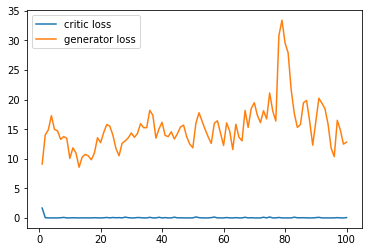

  0%|          | 199/94950 [00:43<5:42:31,  4.61it/s]

step: 200, D: 0.0524503, G: 17.1854


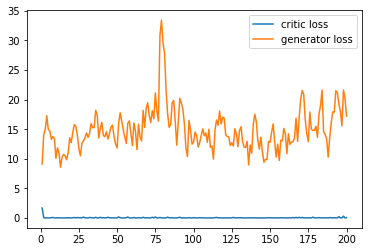

  0%|          | 299/94950 [01:02<5:30:15,  4.78it/s]

step: 300, D: 0.0585309, G: 18.2311


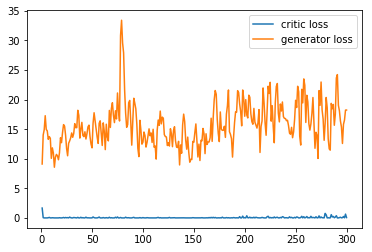

  0%|          | 399/94950 [01:21<5:23:18,  4.87it/s]

step: 400, D: 0.0525199, G: 13.0614


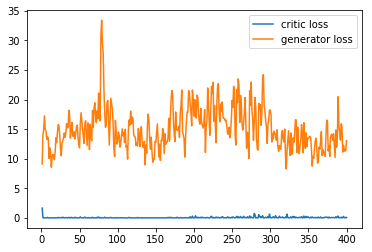

  1%|          | 499/94950 [01:41<5:18:51,  4.94it/s]

step: 500, D: 0.0941748, G: 13.7344


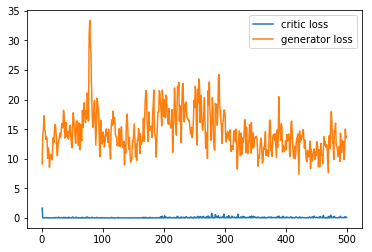

  1%|          | 599/94950 [02:00<5:16:13,  4.97it/s]

step: 600, D: 0.304781, G: 9.13933


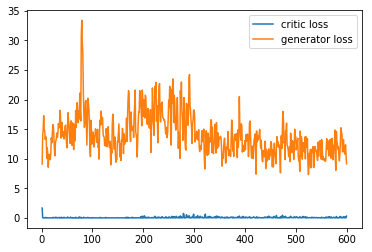

  1%|          | 699/94950 [02:19<5:13:46,  5.01it/s]

step: 700, D: 0.0166054, G: 13.3764


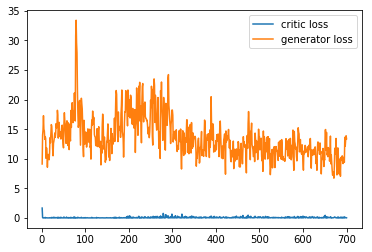

  1%|          | 799/94950 [02:38<5:11:50,  5.03it/s]

step: 800, D: 0.0473059, G: 8.16625


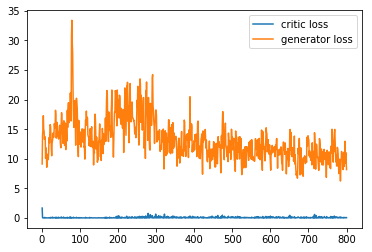

  1%|          | 899/94950 [02:57<5:10:19,  5.05it/s]

step: 900, D: 0.000919864, G: 9.93843


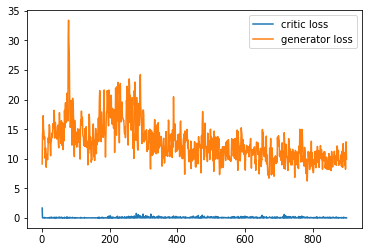

  1%|          | 999/94950 [03:17<5:09:28,  5.06it/s]

step: 1000, D: 0.0140401, G: 10.2238


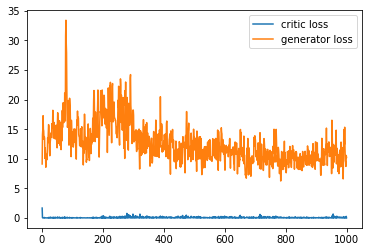

  1%|          | 1099/94950 [03:36<5:08:24,  5.07it/s]

step: 1100, D: 0.0831524, G: 10.83


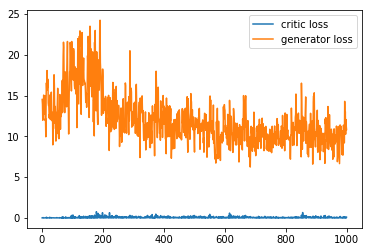

  1%|▏         | 1199/94950 [03:56<5:07:35,  5.08it/s]

step: 1200, D: 0.0500919, G: 11.4663


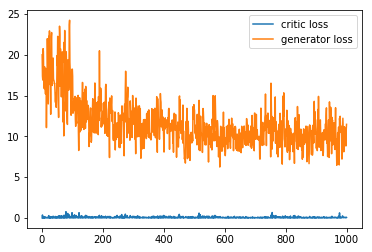

  1%|▏         | 1299/94950 [04:15<5:06:52,  5.09it/s]

step: 1300, D: 0.231523, G: 9.13104


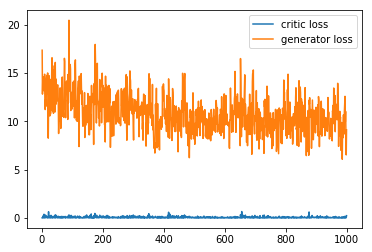

  1%|▏         | 1399/94950 [04:34<5:06:06,  5.09it/s]

step: 1400, D: 0.000710095, G: 8.72184


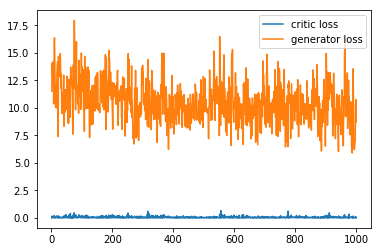

  2%|▏         | 1499/94950 [04:53<5:05:20,  5.10it/s]

step: 1500, D: 0.0713238, G: 9.62834


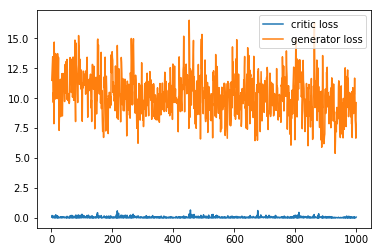

  2%|▏         | 1599/94950 [05:13<5:04:46,  5.10it/s]

step: 1600, D: 0.0336184, G: 7.74986


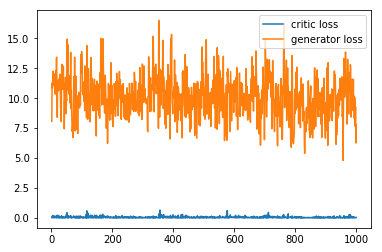

  2%|▏         | 1699/94950 [05:32<5:04:08,  5.11it/s]

step: 1700, D: 0.00381778, G: 11.6054


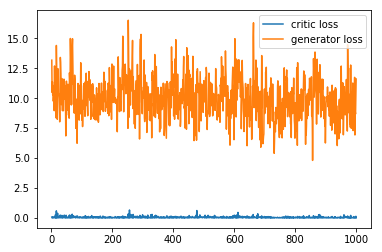

  2%|▏         | 1799/94950 [05:51<5:03:42,  5.11it/s]

step: 1800, D: 0.0436788, G: 10.2918


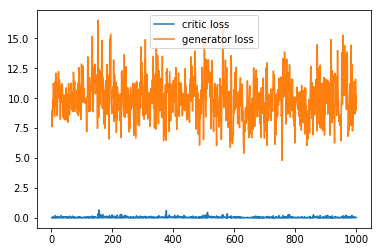

  2%|▏         | 1899/94950 [06:11<5:03:06,  5.12it/s]

step: 1900, D: 0.0544124, G: 11.6151


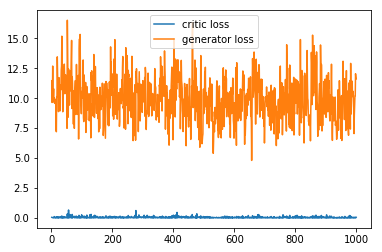

  2%|▏         | 1999/94950 [06:30<5:02:52,  5.12it/s]

step: 2000, D: 0.262484, G: 11.1199


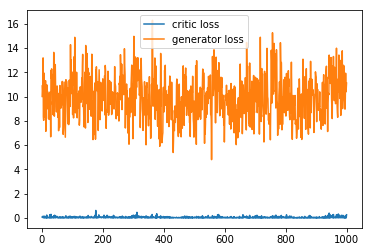

  2%|▏         | 2099/94950 [06:50<5:02:24,  5.12it/s]

step: 2100, D: 0.00890316, G: 8.10491


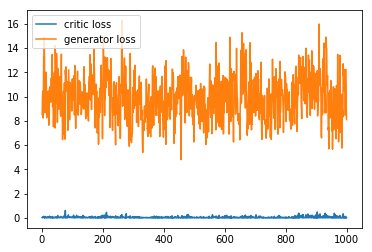

  2%|▏         | 2199/94950 [07:09<5:01:50,  5.12it/s]

step: 2200, D: 0.0388497, G: 6.97967


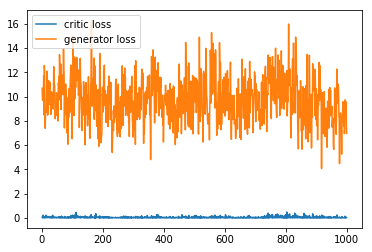

  2%|▏         | 2299/94950 [07:28<5:01:23,  5.12it/s]

step: 2300, D: 0.226997, G: 9.70414


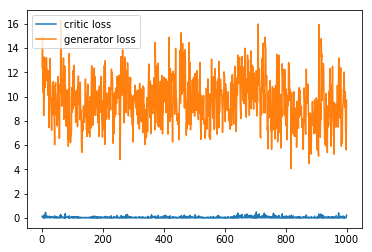

  3%|▎         | 2399/94950 [07:48<5:00:57,  5.13it/s]

step: 2400, D: 0.0686155, G: 10.7765


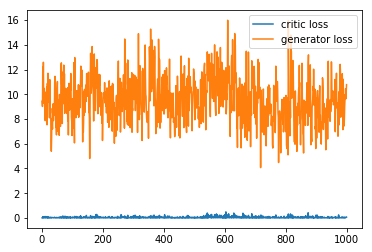

  3%|▎         | 2499/94950 [08:07<5:00:30,  5.13it/s]

step: 2500, D: 0.00711142, G: 9.51745


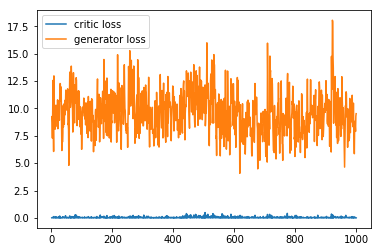

  3%|▎         | 2599/94950 [08:26<5:00:05,  5.13it/s]

step: 2600, D: 0.0697127, G: 10.2365


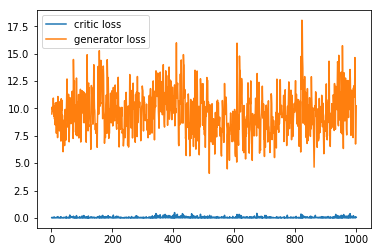

  3%|▎         | 2699/94950 [08:46<4:59:50,  5.13it/s]

step: 2700, D: 0.0919921, G: 9.09101


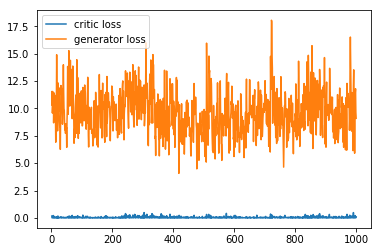

  3%|▎         | 2799/94950 [09:05<4:59:28,  5.13it/s]

step: 2800, D: 0.161369, G: 12.9942


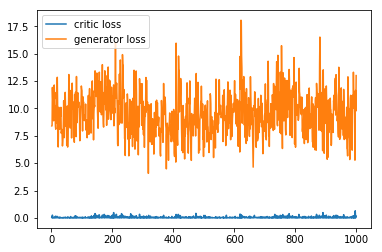

  3%|▎         | 2899/94950 [09:25<4:59:05,  5.13it/s]

step: 2900, D: 0.00651431, G: 6.31663


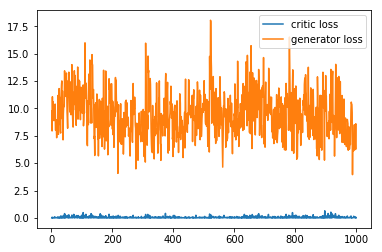

  3%|▎         | 2999/94950 [09:44<4:58:47,  5.13it/s]

step: 3000, D: 0.0014313, G: 8.10833


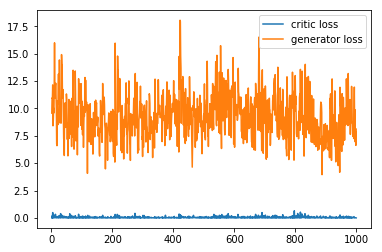

  3%|▎         | 3099/94950 [10:04<4:58:27,  5.13it/s]

step: 3100, D: 0.00104427, G: 7.96039


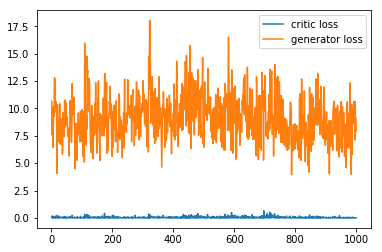

  3%|▎         | 3199/94950 [10:23<4:58:01,  5.13it/s]

step: 3200, D: 0.345576, G: 9.75238


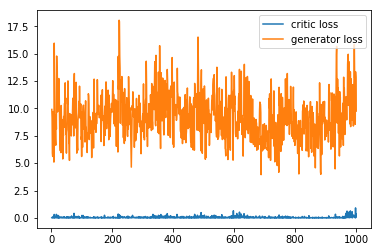

  3%|▎         | 3299/94950 [10:42<4:57:37,  5.13it/s]

step: 3300, D: 0.313068, G: 9.83061


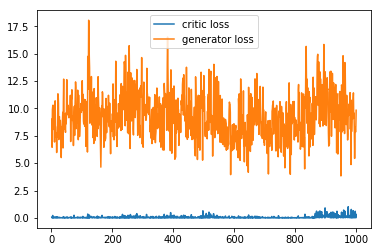

  4%|▎         | 3399/94950 [11:02<4:57:16,  5.13it/s]

step: 3400, D: 0.0192884, G: 6.37566


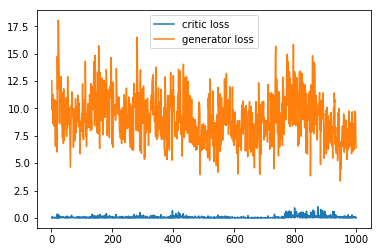

  4%|▎         | 3499/94950 [11:21<4:56:51,  5.13it/s]

step: 3500, D: 0.01115, G: 7.02863


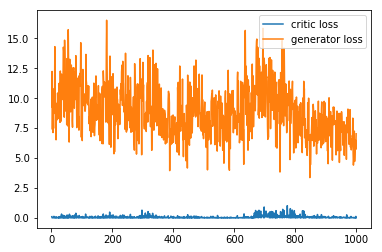

  4%|▍         | 3599/94950 [11:40<4:56:26,  5.14it/s]

step: 3600, D: 0.0159088, G: 8.06471


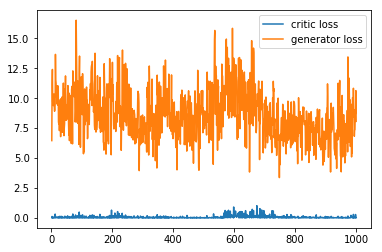

  4%|▍         | 3699/94950 [12:00<4:56:04,  5.14it/s]

step: 3700, D: 0.00296862, G: 7.85687


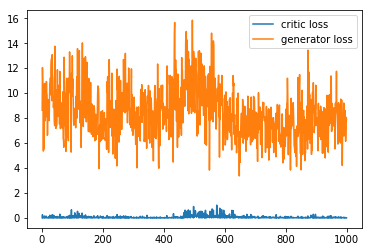

  4%|▍         | 3799/94950 [12:19<4:55:42,  5.14it/s]

step: 3800, D: 0.00281902, G: 10.4543


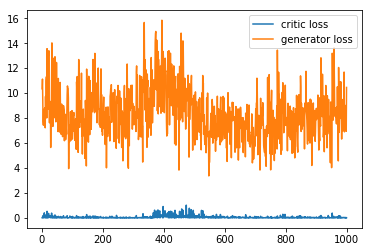

  4%|▍         | 3899/94950 [12:38<4:55:20,  5.14it/s]

step: 3900, D: 0.00407047, G: 10.9734


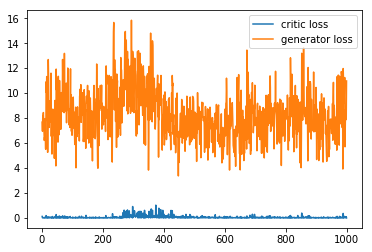

  4%|▍         | 3999/94950 [12:58<4:54:56,  5.14it/s]

step: 4000, D: 0.0989094, G: 9.56938


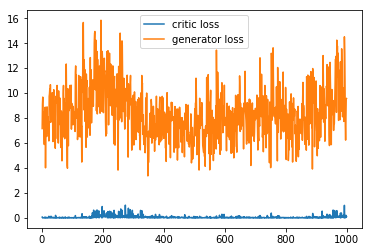

  4%|▍         | 4099/94950 [13:17<4:54:33,  5.14it/s]

step: 4100, D: 9.98445e-06, G: 9.77592


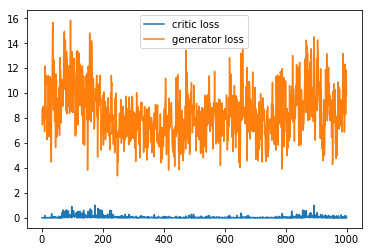

  4%|▍         | 4199/94950 [13:36<4:54:12,  5.14it/s]

step: 4200, D: 0.0133295, G: 11.0459


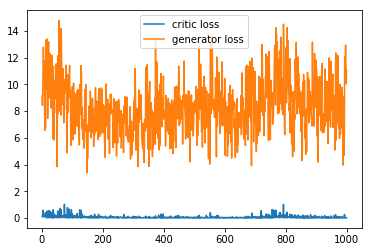

  5%|▍         | 4299/94950 [13:56<4:53:52,  5.14it/s]

step: 4300, D: 0.188081, G: 9.44453


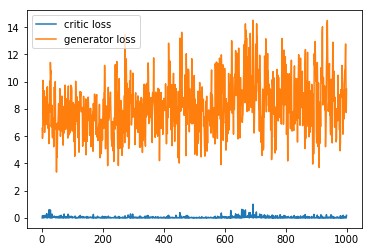

  5%|▍         | 4399/94950 [14:15<4:53:28,  5.14it/s]

step: 4400, D: 0.111001, G: 9.08344


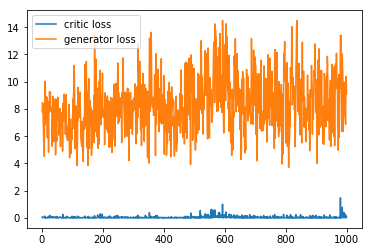

  5%|▍         | 4499/94950 [14:34<4:53:09,  5.14it/s]

step: 4500, D: 0.206812, G: 10.1031


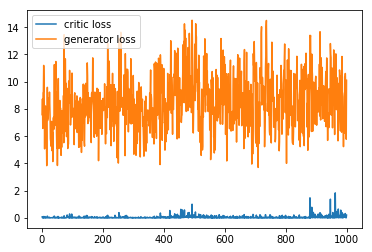

  5%|▍         | 4599/94950 [14:54<4:52:46,  5.14it/s]

step: 4600, D: 0.0486339, G: 9.45753


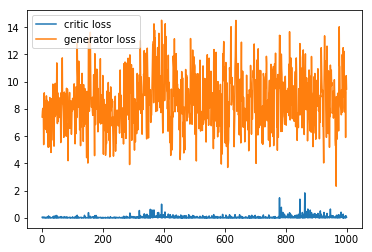

  5%|▍         | 4699/94950 [15:13<4:52:23,  5.14it/s]

step: 4700, D: 0.000568991, G: 8.06037


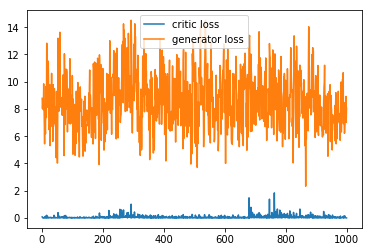

  5%|▌         | 4799/94950 [15:33<4:52:07,  5.14it/s]

step: 4800, D: 0.00879125, G: 11.6051


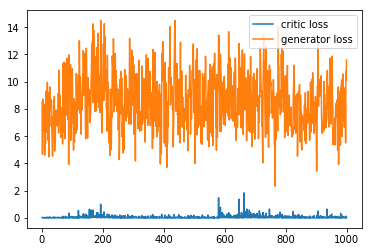

  5%|▌         | 4899/94950 [15:52<4:51:47,  5.14it/s]

step: 4900, D: 0.0586212, G: 8.13592


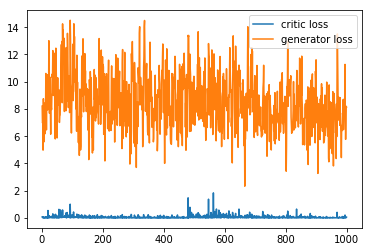

  5%|▌         | 4999/94950 [16:11<4:51:25,  5.14it/s]

step: 5000, D: 0.0509502, G: 8.58145


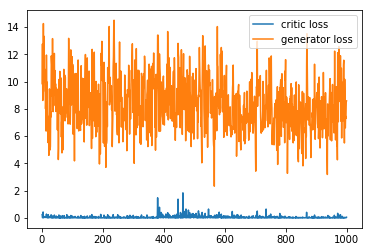

  5%|▌         | 5099/94950 [16:31<4:51:03,  5.15it/s]

step: 5100, D: 0.0114656, G: 8.65843


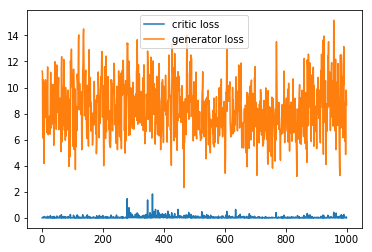

  5%|▌         | 5199/94950 [16:50<4:50:42,  5.15it/s]

step: 5200, D: 0.0787933, G: 8.4751


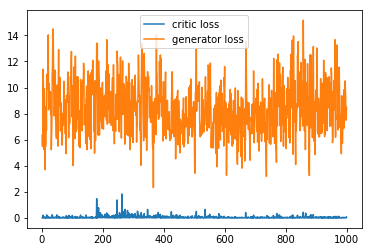

  6%|▌         | 5299/94950 [17:09<4:50:20,  5.15it/s]

step: 5300, D: 0.0404232, G: 10.3108


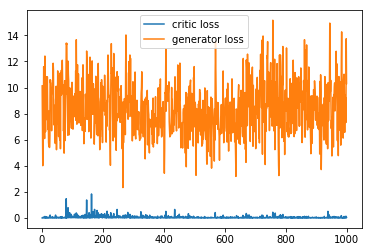

  6%|▌         | 5399/94950 [17:28<4:49:57,  5.15it/s]

step: 5400, D: 0.00614815, G: 7.49567


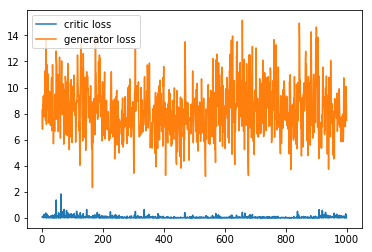

  6%|▌         | 5499/94950 [17:48<4:49:38,  5.15it/s]

step: 5500, D: 0.00353037, G: 8.64291


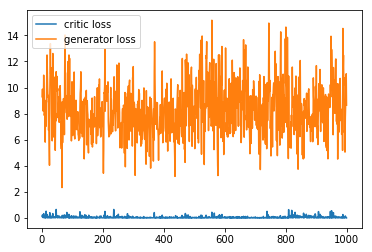

  6%|▌         | 5599/94950 [18:07<4:49:14,  5.15it/s]

step: 5600, D: 0.0555971, G: 8.72673


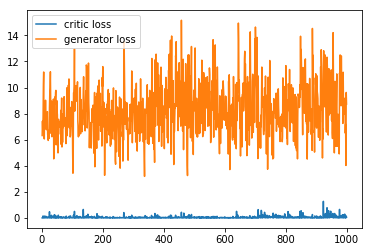

  6%|▌         | 5699/94950 [18:26<4:48:51,  5.15it/s]

step: 5700, D: 0.00301117, G: 7.79434


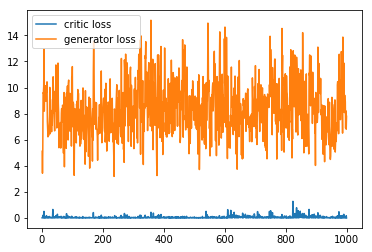

  6%|▌         | 5799/94950 [18:45<4:48:29,  5.15it/s]

step: 5800, D: 0.00043585, G: 9.99829


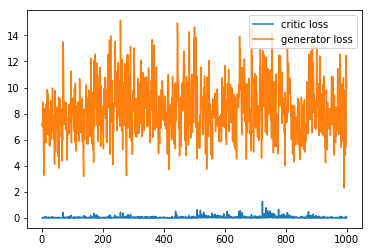

  6%|▌         | 5899/94950 [19:05<4:48:08,  5.15it/s]

step: 5900, D: 0.021023, G: 2.5365


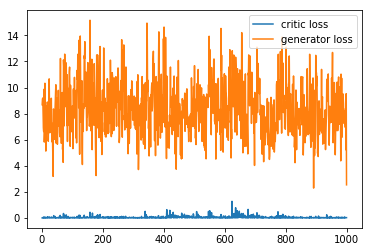

  6%|▋         | 5999/94950 [19:24<4:47:46,  5.15it/s]

step: 6000, D: 0.0970374, G: 8.88586


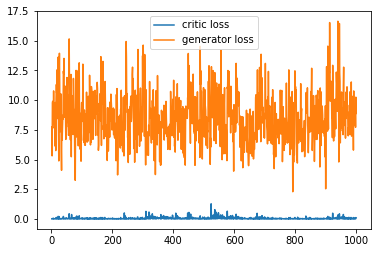

  6%|▋         | 6099/94950 [19:43<4:47:24,  5.15it/s]

step: 6100, D: 0.0043071, G: 9.26487


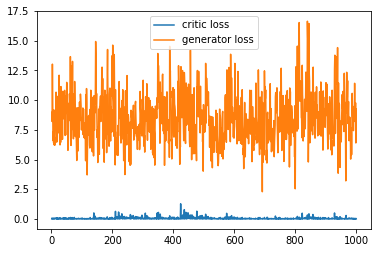

  7%|▋         | 6199/94950 [20:03<4:47:07,  5.15it/s]

step: 6200, D: 0.00758996, G: 8.87461


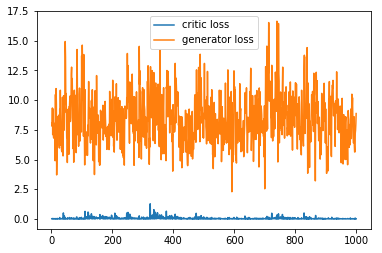

  7%|▋         | 6299/94950 [20:22<4:46:46,  5.15it/s]

step: 6300, D: 0.250955, G: 20.5936


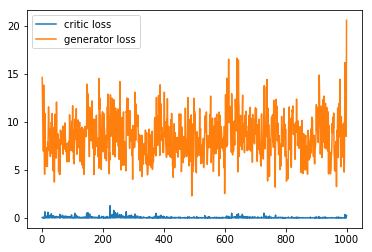

  7%|▋         | 6399/94950 [20:41<4:46:22,  5.15it/s]

step: 6400, D: 0.000369849, G: 13.4265


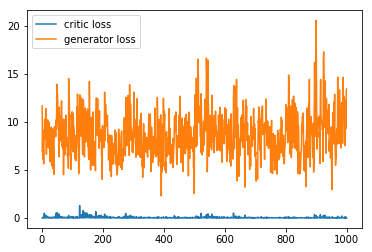

  7%|▋         | 6499/94950 [21:00<4:46:00,  5.15it/s]

step: 6500, D: 0.0207294, G: 8.95305


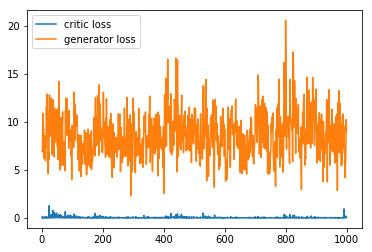

  7%|▋         | 6599/94950 [21:20<4:45:38,  5.16it/s]

step: 6600, D: 0.0352626, G: 11.8631


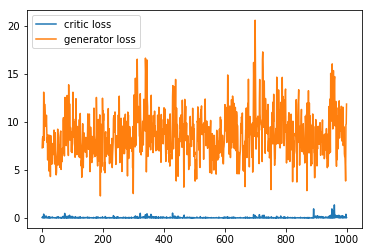

  7%|▋         | 6699/94950 [21:39<4:45:16,  5.16it/s]

step: 6700, D: 0.00025556, G: 5.34592


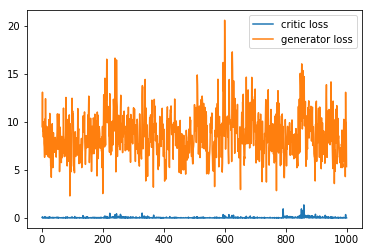

  7%|▋         | 6799/94950 [21:58<4:44:55,  5.16it/s]

step: 6800, D: 0.0307008, G: 4.21487


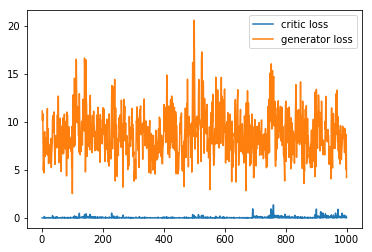

  7%|▋         | 6899/94950 [22:17<4:44:35,  5.16it/s]

step: 6900, D: 0.099045, G: 9.83225


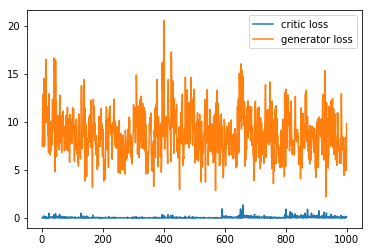

  7%|▋         | 6999/94950 [22:36<4:44:12,  5.16it/s]

step: 7000, D: 0.000393606, G: 9.63047


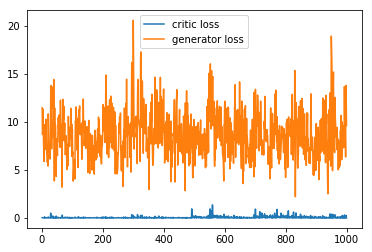

  7%|▋         | 7099/94950 [22:56<4:43:51,  5.16it/s]

step: 7100, D: 0.000101378, G: 7.60077


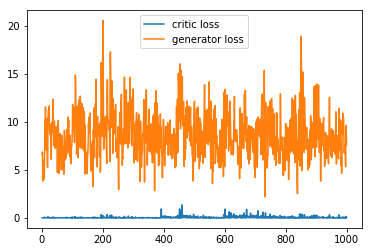

  8%|▊         | 7199/94950 [23:15<4:43:31,  5.16it/s]

step: 7200, D: 0.0136284, G: 3.68447


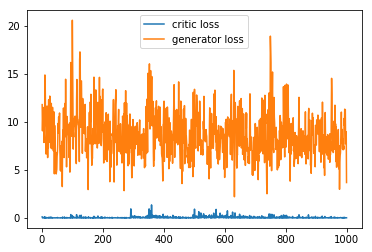

  8%|▊         | 7299/94950 [23:35<4:43:12,  5.16it/s]

step: 7300, D: 0.0321521, G: 5.80973


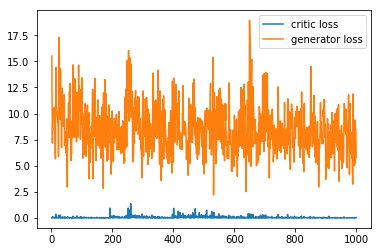

  8%|▊         | 7399/94950 [23:54<4:42:51,  5.16it/s]

step: 7400, D: 0.000112347, G: 10.452


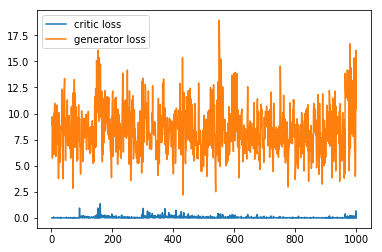

  8%|▊         | 7499/94950 [24:13<4:42:32,  5.16it/s]

step: 7500, D: 0.00116757, G: 7.62669


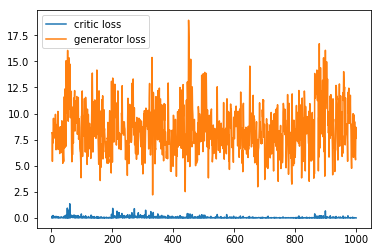

  8%|▊         | 7599/94950 [24:33<4:42:15,  5.16it/s]

step: 7600, D: 0.00480627, G: 10.8954


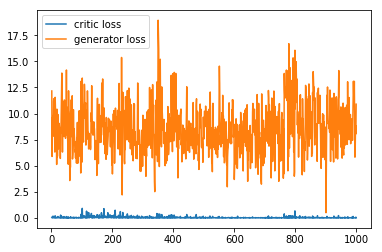

  8%|▊         | 7699/94950 [24:52<4:41:52,  5.16it/s]

step: 7700, D: 0.000953515, G: 8.1915


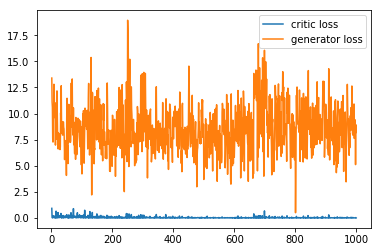

  8%|▊         | 7799/94950 [25:11<4:41:32,  5.16it/s]

step: 7800, D: 0.0131271, G: 5.65367


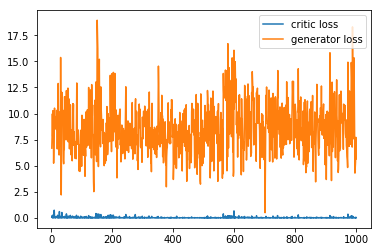

  8%|▊         | 7899/94950 [25:30<4:41:12,  5.16it/s]

step: 7900, D: 0.052438, G: 7.60139


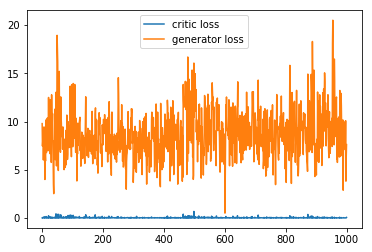

  8%|▊         | 7999/94950 [25:50<4:40:52,  5.16it/s]

step: 8000, D: 0.000902147, G: 13.5096


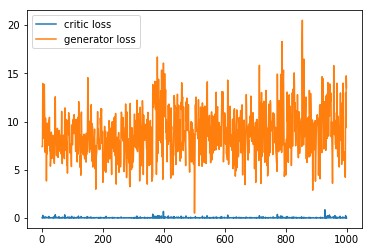

  9%|▊         | 8099/94950 [26:09<4:40:31,  5.16it/s]

step: 8100, D: 0.048477, G: 11.5558


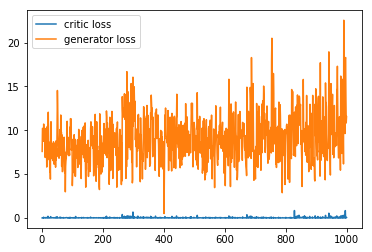

  9%|▊         | 8199/94950 [26:28<4:40:11,  5.16it/s]

step: 8200, D: 0.000397192, G: 8.52731


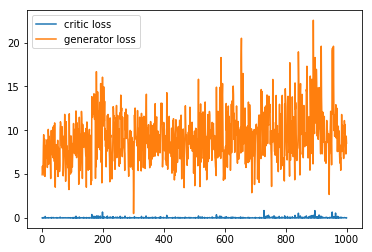

  9%|▊         | 8299/94950 [26:48<4:39:52,  5.16it/s]

step: 8300, D: 0.00942224, G: 8.95594


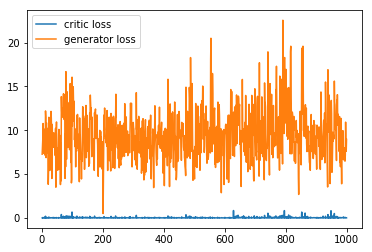

  9%|▉         | 8399/94950 [27:07<4:39:32,  5.16it/s]

step: 8400, D: 0.0164821, G: 5.10783


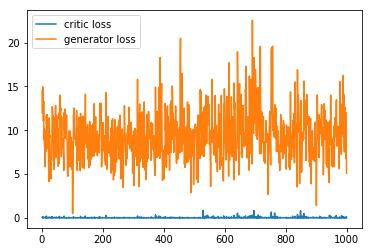

  9%|▉         | 8499/94950 [27:26<4:39:11,  5.16it/s]

step: 8500, D: 0.00075608, G: 13.0035


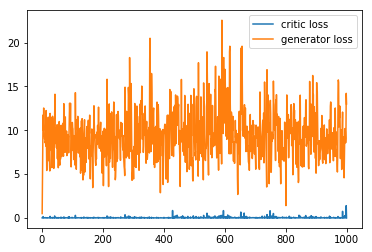

  9%|▉         | 8599/94950 [27:45<4:38:49,  5.16it/s]

step: 8600, D: 0.0238812, G: 9.16291


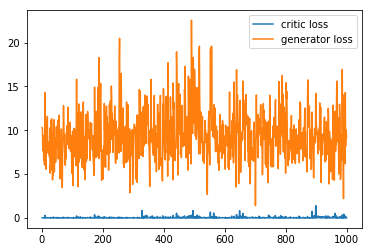

  9%|▉         | 8699/94950 [28:05<4:38:29,  5.16it/s]

step: 8700, D: 0.0622998, G: 9.32462


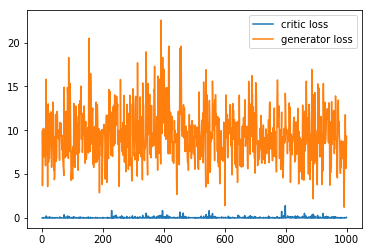

  9%|▉         | 8799/94950 [28:24<4:38:09,  5.16it/s]

step: 8800, D: 0.0197886, G: 11.1315


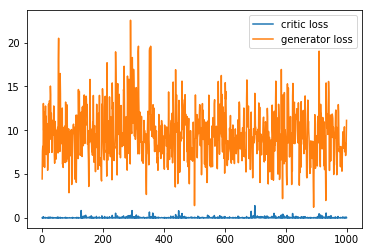

  9%|▉         | 8899/94950 [28:43<4:37:48,  5.16it/s]

step: 8900, D: 0.014935, G: 8.83897


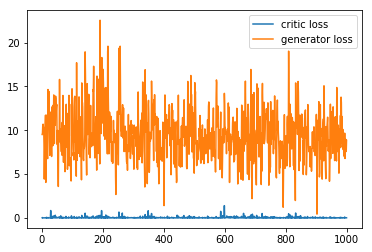

  9%|▉         | 8999/94950 [29:03<4:37:28,  5.16it/s]

step: 9000, D: 0.00206454, G: 7.3416


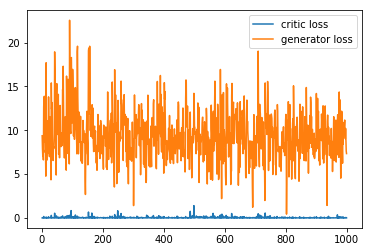

 10%|▉         | 9099/94950 [29:22<4:37:06,  5.16it/s]

step: 9100, D: 0.00322328, G: 7.62028


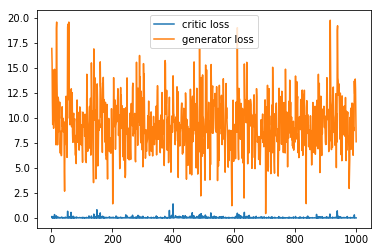

 10%|▉         | 9199/94950 [29:41<4:36:46,  5.16it/s]

step: 9200, D: 0.00585863, G: 11.1806


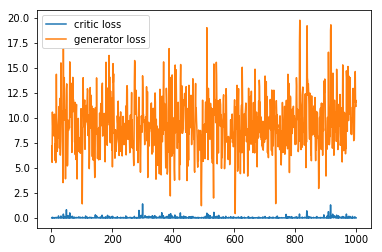

 10%|▉         | 9299/94950 [30:00<4:36:27,  5.16it/s]

step: 9300, D: 0.0123627, G: 10.4207


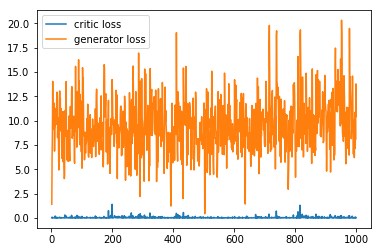

 10%|▉         | 9399/94950 [30:20<4:36:07,  5.16it/s]

step: 9400, D: 0.00884371, G: 6.24491


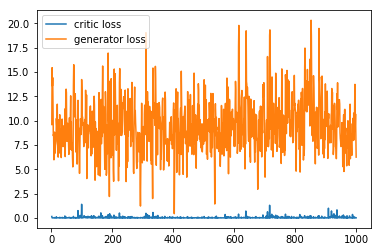

 10%|█         | 9499/94950 [30:39<4:35:48,  5.16it/s]

step: 9500, D: 0.00443143, G: 13.1419


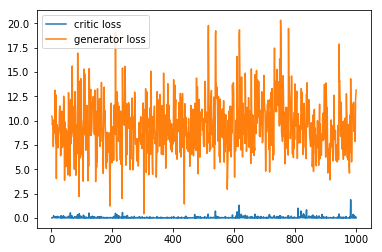

 10%|█         | 9599/94950 [30:58<4:35:29,  5.16it/s]

step: 9600, D: 6.34709e-05, G: 5.5025


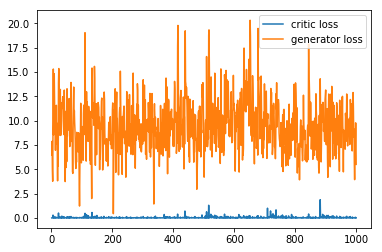

 10%|█         | 9699/94950 [31:18<4:35:09,  5.16it/s]

step: 9700, D: 0.00660377, G: 10.5136


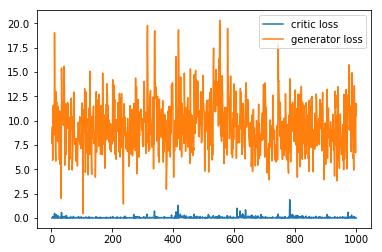

 10%|█         | 9799/94950 [31:37<4:34:48,  5.16it/s]

step: 9800, D: 0.000484228, G: 11.5944


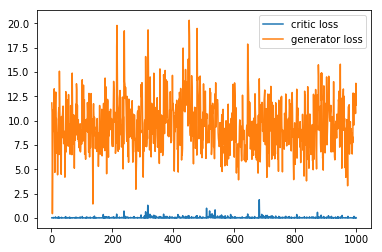

 10%|█         | 9899/94950 [31:56<4:34:27,  5.16it/s]

step: 9900, D: 0.00296267, G: 6.83945


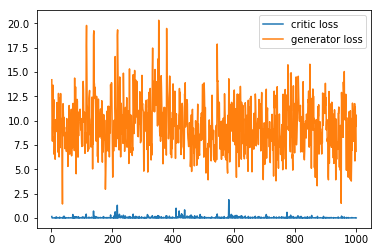

 11%|█         | 9999/94950 [32:15<4:34:06,  5.17it/s]

step: 10000, D: 0.10517, G: 9.9284


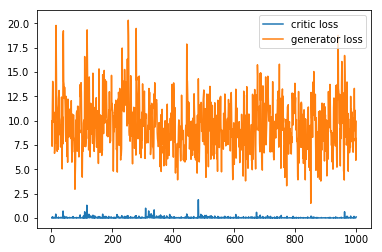

 11%|█         | 10099/94950 [32:35<4:33:46,  5.17it/s]

step: 10100, D: 0.000358949, G: 10.7848


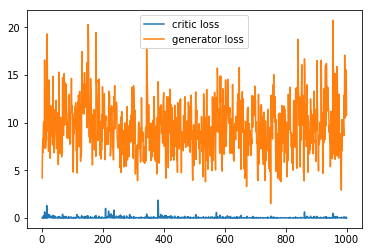

 11%|█         | 10199/94950 [32:54<4:33:26,  5.17it/s]

step: 10200, D: 0.00235952, G: 10.47


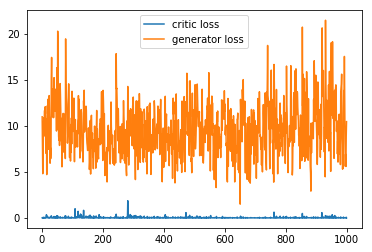

 11%|█         | 10299/94950 [33:13<4:33:06,  5.17it/s]

step: 10300, D: 5.50139e-05, G: 15.9426


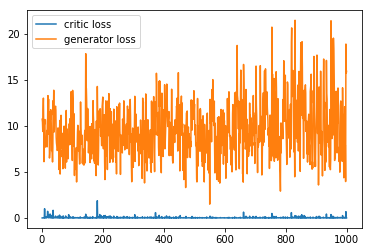

 11%|█         | 10399/94950 [33:33<4:32:47,  5.17it/s]

step: 10400, D: 0.00916906, G: 12.3261


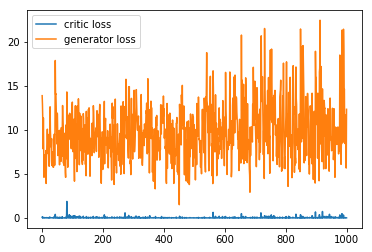

 11%|█         | 10499/94950 [33:52<4:32:28,  5.17it/s]

step: 10500, D: 0.000330386, G: 12.9201


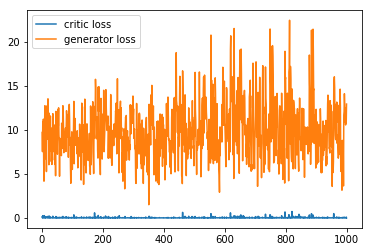

 11%|█         | 10599/94950 [34:11<4:32:07,  5.17it/s]

step: 10600, D: 0.000168509, G: 11.6725


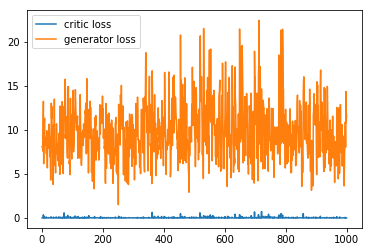

 11%|█▏        | 10699/94950 [34:31<4:31:49,  5.17it/s]

step: 10700, D: 0.001152, G: 10.8789


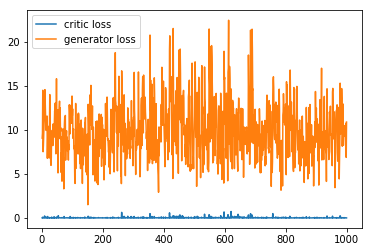

 11%|█▏        | 10799/94950 [34:50<4:31:29,  5.17it/s]

step: 10800, D: 0.0258553, G: 10.4746


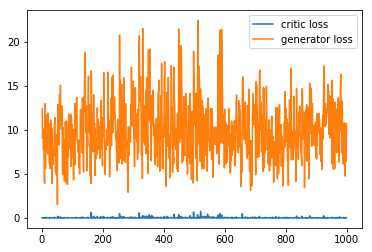

 11%|█▏        | 10899/94950 [35:09<4:31:08,  5.17it/s]

step: 10900, D: 7.85708e-06, G: 16.2889


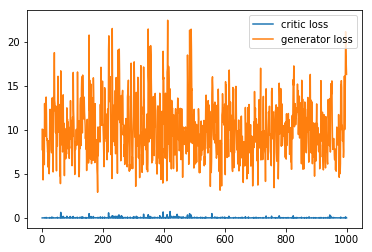

 12%|█▏        | 10999/94950 [35:28<4:30:49,  5.17it/s]

step: 11000, D: 0.0120373, G: 6.59125


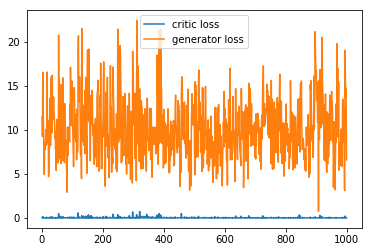

 12%|█▏        | 11099/94950 [35:48<4:30:31,  5.17it/s]

step: 11100, D: 0.00452152, G: 6.37872


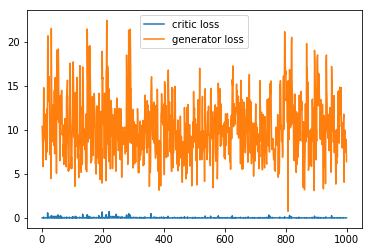

 12%|█▏        | 11199/94950 [36:07<4:30:11,  5.17it/s]

step: 11200, D: 2.94552e-07, G: 18.1834


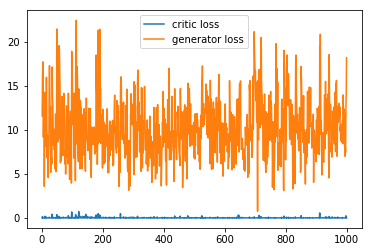

 12%|█▏        | 11299/94950 [36:26<4:29:51,  5.17it/s]

step: 11300, D: 0.101239, G: 18.6843


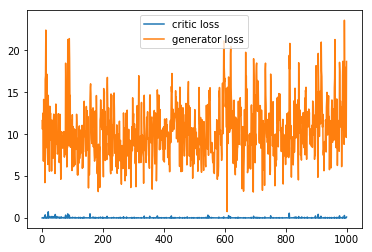

 12%|█▏        | 11399/94950 [36:46<4:29:31,  5.17it/s]

step: 11400, D: 0.00248627, G: 14.2863


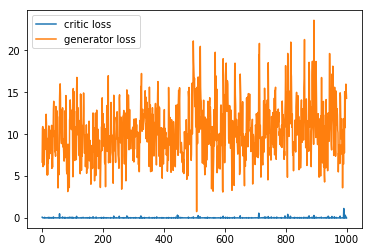

 12%|█▏        | 11499/94950 [37:05<4:29:11,  5.17it/s]

step: 11500, D: 0.000809004, G: 8.08735


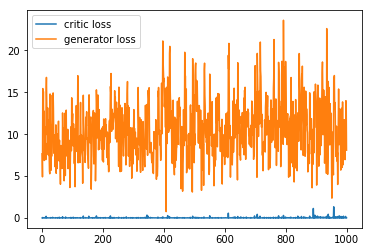

 12%|█▏        | 11599/94950 [37:24<4:28:51,  5.17it/s]

step: 11600, D: 0.00519133, G: 8.63175


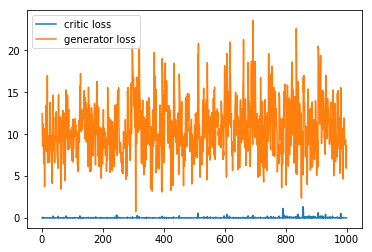

 12%|█▏        | 11699/94950 [37:43<4:28:29,  5.17it/s]

step: 11700, D: 0.000169761, G: 14.7421


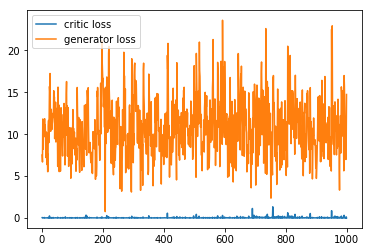

 12%|█▏        | 11799/94950 [38:03<4:28:10,  5.17it/s]

step: 11800, D: 0.00471709, G: 8.13497


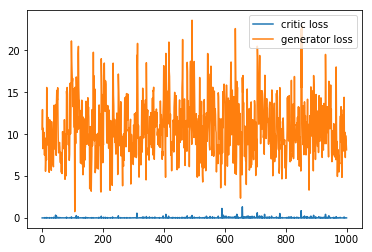

 13%|█▎        | 11899/94950 [38:22<4:27:49,  5.17it/s]

step: 11900, D: 0.0014098, G: 6.40025


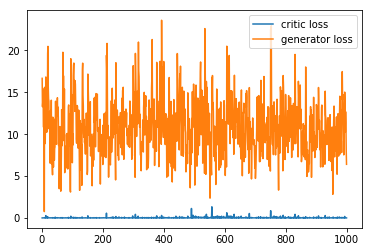

 13%|█▎        | 11999/94950 [38:41<4:27:28,  5.17it/s]

step: 12000, D: 0.255502, G: 11.0639


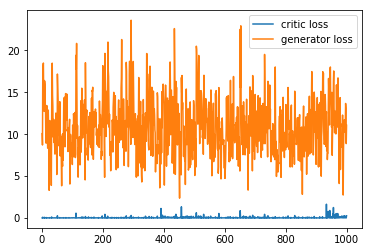

 13%|█▎        | 12099/94950 [39:00<4:27:08,  5.17it/s]

step: 12100, D: 0.000668886, G: 9.24594


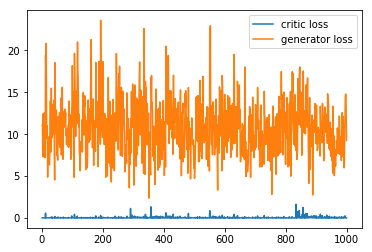

 13%|█▎        | 12199/94950 [39:20<4:26:49,  5.17it/s]

step: 12200, D: 0.000591298, G: 10.3776


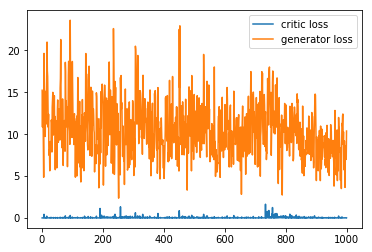

 13%|█▎        | 12299/94950 [39:39<4:26:29,  5.17it/s]

step: 12300, D: 0.018376, G: 10.8


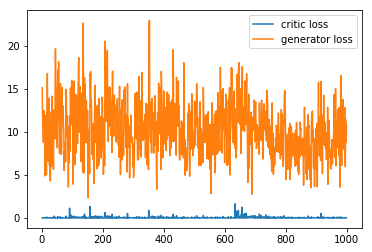

 13%|█▎        | 12399/94950 [39:58<4:26:10,  5.17it/s]

step: 12400, D: 5.56864e-05, G: 13.0309


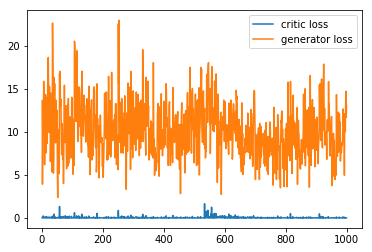

 13%|█▎        | 12499/94950 [40:18<4:25:51,  5.17it/s]

step: 12500, D: 0.00181289, G: 7.83157


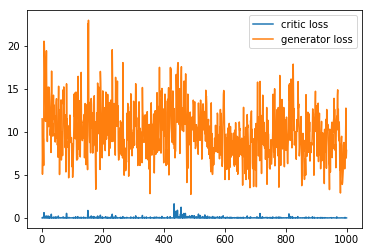

 13%|█▎        | 12599/94950 [40:37<4:25:31,  5.17it/s]

step: 12600, D: 0.0681209, G: 9.69855


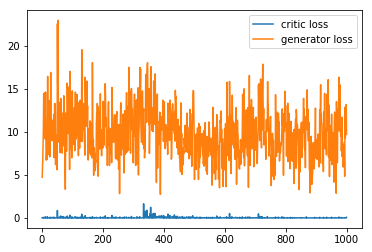

 13%|█▎        | 12699/94950 [40:56<4:25:11,  5.17it/s]

step: 12700, D: 0.000838702, G: 9.44855


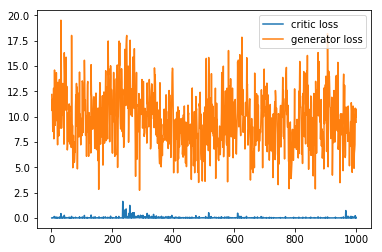

 13%|█▎        | 12799/94950 [41:15<4:24:50,  5.17it/s]

step: 12800, D: 5.82837e-05, G: 11.1207


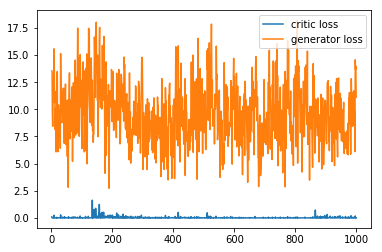

 14%|█▎        | 12899/94950 [41:35<4:24:31,  5.17it/s]

step: 12900, D: 0.490121, G: 17.577


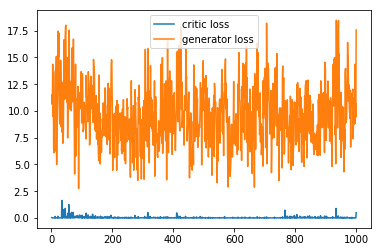

 14%|█▎        | 12999/94950 [41:54<4:24:11,  5.17it/s]

step: 13000, D: 0.0157991, G: 14.0176


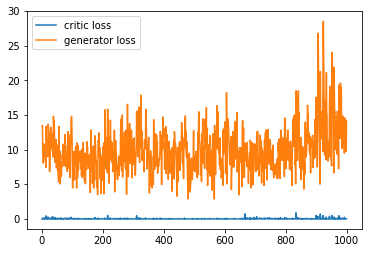

 14%|█▍        | 13099/94950 [42:13<4:23:51,  5.17it/s]

step: 13100, D: 4.76448e-05, G: 11.8867


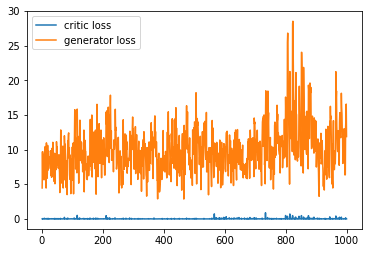

 14%|█▍        | 13199/94950 [42:32<4:23:31,  5.17it/s]

step: 13200, D: 1.65489e-05, G: 9.09931


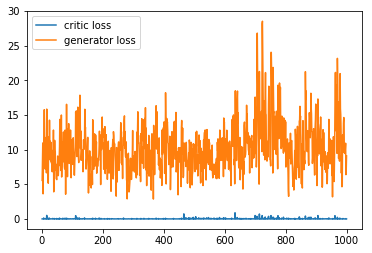

 14%|█▍        | 13299/94950 [42:52<4:23:11,  5.17it/s]

step: 13300, D: 0.00111428, G: 8.6166


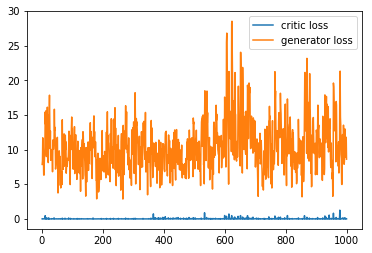

 14%|█▍        | 13399/94950 [43:11<4:22:51,  5.17it/s]

step: 13400, D: 5.76726e-07, G: 18.1691


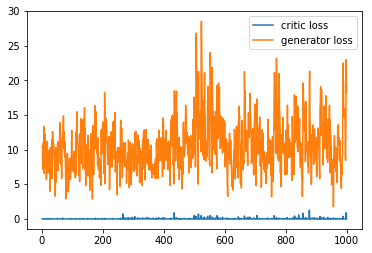

 14%|█▍        | 13499/94950 [43:30<4:22:31,  5.17it/s]

step: 13500, D: 0.000326606, G: 10.7023


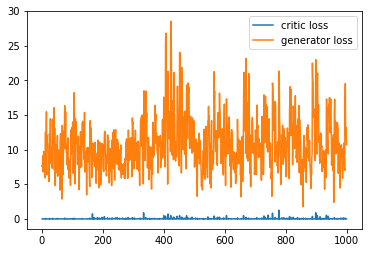

 14%|█▍        | 13599/94950 [43:49<4:22:12,  5.17it/s]

step: 13600, D: 4.63544e-06, G: 14.6366


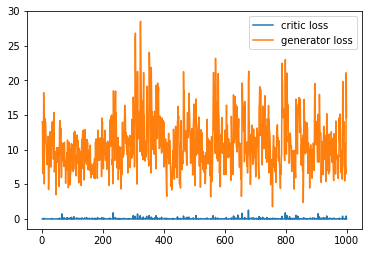

 14%|█▍        | 13699/94950 [44:09<4:21:51,  5.17it/s]

step: 13700, D: 4.95746e-06, G: 10.2736


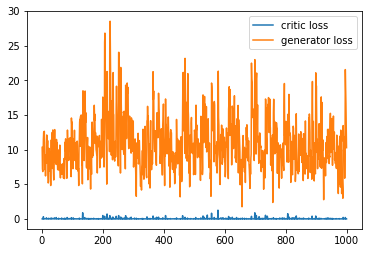

 15%|█▍        | 13799/94950 [44:28<4:21:32,  5.17it/s]

step: 13800, D: 0.000204746, G: 12.9696


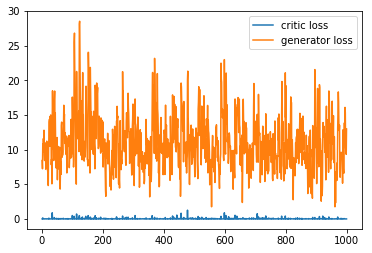

 15%|█▍        | 13899/94950 [44:47<4:21:13,  5.17it/s]

step: 13900, D: 0.000253911, G: 9.6394


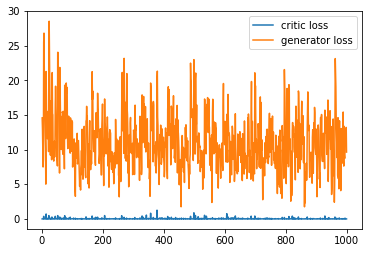

 15%|█▍        | 13999/94950 [45:07<4:20:53,  5.17it/s]

step: 14000, D: 0.000276507, G: 6.36348


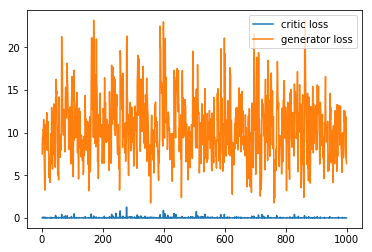

 15%|█▍        | 14099/94950 [45:26<4:20:33,  5.17it/s]

step: 14100, D: 0.0824659, G: 7.58322


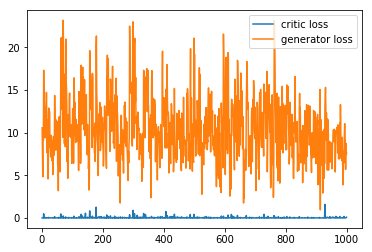

 15%|█▍        | 14199/94950 [45:45<4:20:13,  5.17it/s]

step: 14200, D: 0.0293884, G: 6.71759


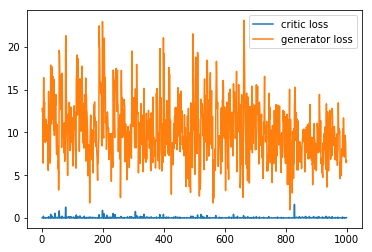

 15%|█▌        | 14299/94950 [46:04<4:19:54,  5.17it/s]

step: 14300, D: 1.91411e-05, G: 16.2153


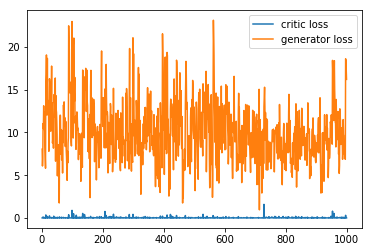

 15%|█▌        | 14399/94950 [46:24<4:19:35,  5.17it/s]

step: 14400, D: 8.18369e-06, G: 12.2434


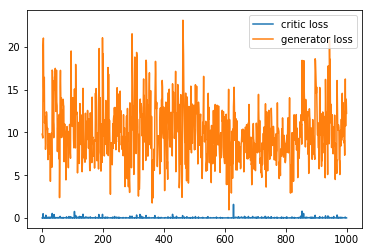

 15%|█▌        | 14499/94950 [46:43<4:19:15,  5.17it/s]

step: 14500, D: 6.66217e-05, G: 12.9234


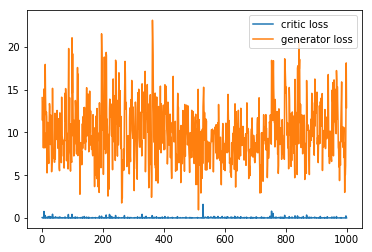

 15%|█▌        | 14599/94950 [47:02<4:18:56,  5.17it/s]

step: 14600, D: 0.0298782, G: 15.14


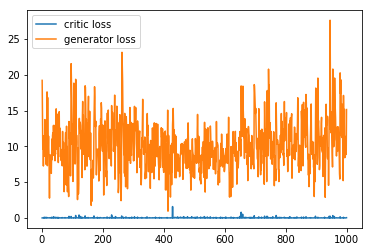

 15%|█▌        | 14699/94950 [47:22<4:18:37,  5.17it/s]

step: 14700, D: 0.0569526, G: 12.7655


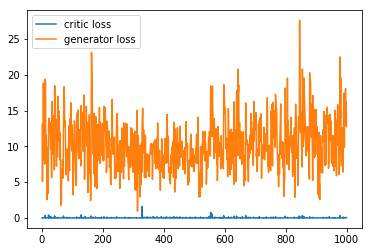

 16%|█▌        | 14799/94950 [47:41<4:18:17,  5.17it/s]

step: 14800, D: 0.00359195, G: 7.61287


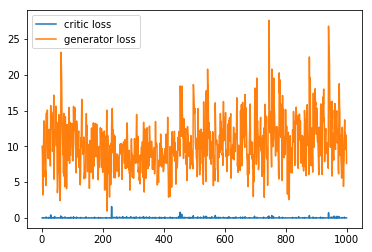

 16%|█▌        | 14899/94950 [48:00<4:17:58,  5.17it/s]

step: 14900, D: 0.00242213, G: 8.23486


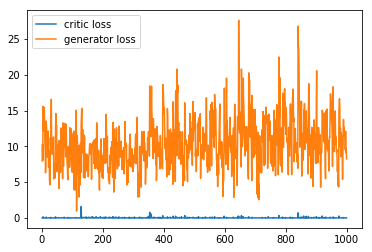

 16%|█▌        | 14999/94950 [48:20<4:17:39,  5.17it/s]

step: 15000, D: 0.0020587, G: 12.4341


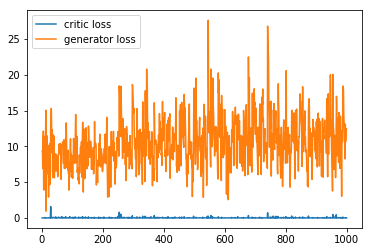

 16%|█▌        | 15099/94950 [48:39<4:17:19,  5.17it/s]

step: 15100, D: 8.50545e-07, G: 13.1359


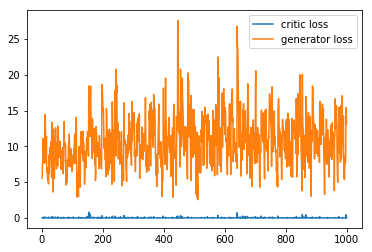

 16%|█▌        | 15199/94950 [48:58<4:16:59,  5.17it/s]

step: 15200, D: 2.09685e-05, G: 15.95


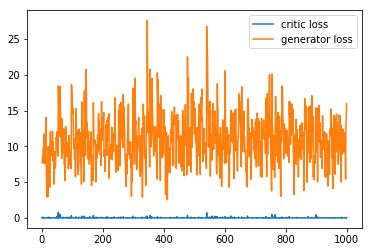

 16%|█▌        | 15299/94950 [49:18<4:16:41,  5.17it/s]

step: 15300, D: 8.80915e-07, G: 19.5811


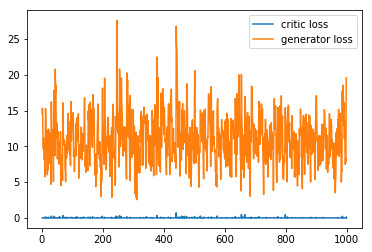

 16%|█▌        | 15399/94950 [49:37<4:16:22,  5.17it/s]

step: 15400, D: 4.55539e-05, G: 11.2504


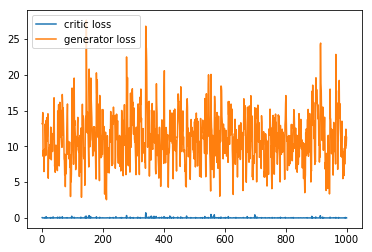

 16%|█▋        | 15499/94950 [49:56<4:16:01,  5.17it/s]

step: 15500, D: 1.5572e-05, G: 9.90964


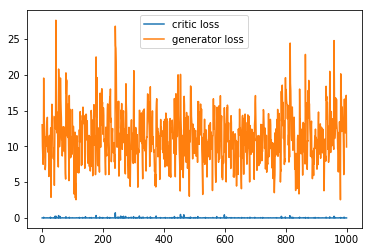

 16%|█▋        | 15599/94950 [50:16<4:15:42,  5.17it/s]

step: 15600, D: 0.0091021, G: 8.44415


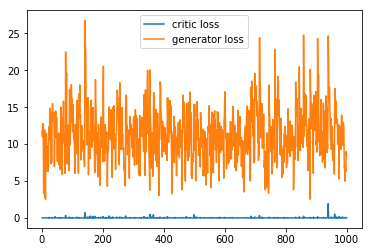

 17%|█▋        | 15699/94950 [50:35<4:15:23,  5.17it/s]

step: 15700, D: 0.0129781, G: 9.58249


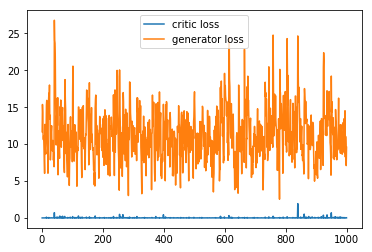

 17%|█▋        | 15799/94950 [50:54<4:15:03,  5.17it/s]

step: 15800, D: 0.000310263, G: 9.86199


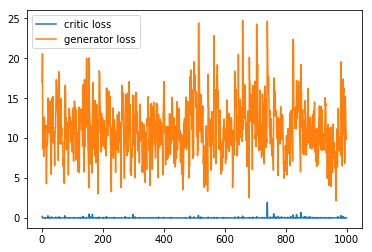

 17%|█▋        | 15899/94950 [51:13<4:14:43,  5.17it/s]

step: 15900, D: 0.0193391, G: 4.53603


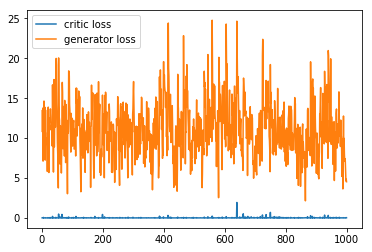

 17%|█▋        | 15999/94950 [51:33<4:14:23,  5.17it/s]

step: 16000, D: 0.000102131, G: 11.3801


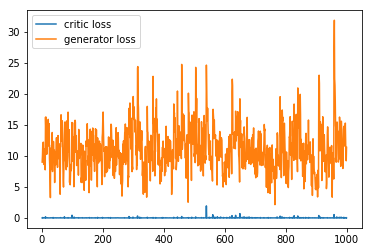

 17%|█▋        | 16099/94950 [51:52<4:14:03,  5.17it/s]

step: 16100, D: 0.361, G: 18.375


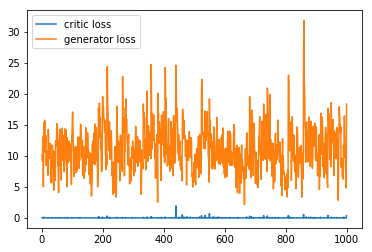

 17%|█▋        | 16199/94950 [52:11<4:13:43,  5.17it/s]

step: 16200, D: 0.00460096, G: 1.9575


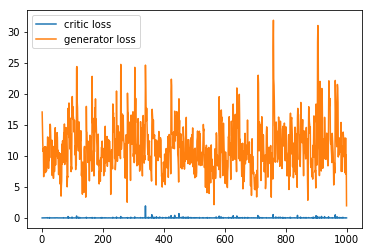

 17%|█▋        | 16299/94950 [52:30<4:13:24,  5.17it/s]

step: 16300, D: 0.0106113, G: 4.96027


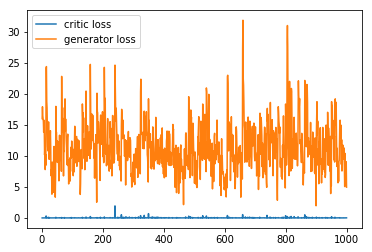

 17%|█▋        | 16399/94950 [52:50<4:13:05,  5.17it/s]

step: 16400, D: 0.000438522, G: 6.55098


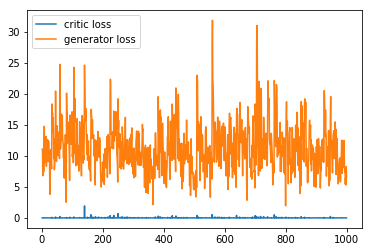

 17%|█▋        | 16499/94950 [53:09<4:12:45,  5.17it/s]

step: 16500, D: 0.0156114, G: 11.586


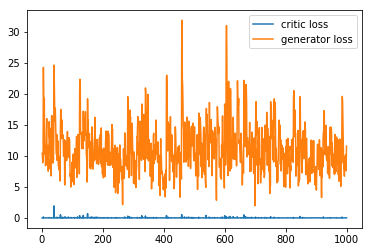

 17%|█▋        | 16599/94950 [53:28<4:12:25,  5.17it/s]

step: 16600, D: 0.0259279, G: 10.1587


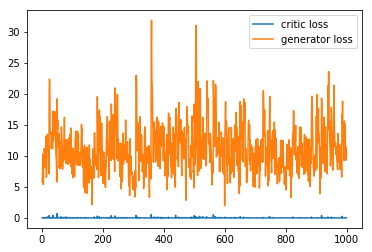

 18%|█▊        | 16699/94950 [53:47<4:12:06,  5.17it/s]

step: 16700, D: 0.000440862, G: 12.8188


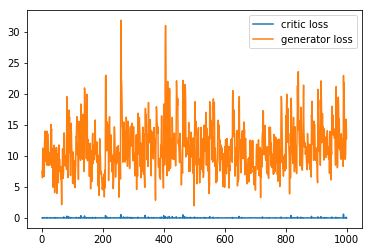

 18%|█▊        | 16799/94950 [54:07<4:11:45,  5.17it/s]

step: 16800, D: 0.00112907, G: 11.6801


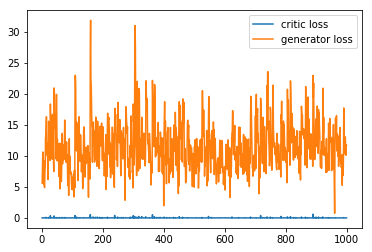

 18%|█▊        | 16899/94950 [54:26<4:11:25,  5.17it/s]

step: 16900, D: 2.9996e-05, G: 14.0172


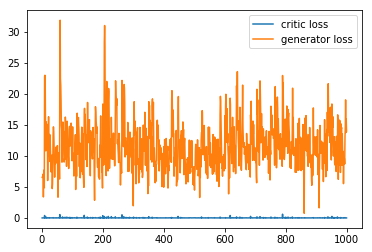

 18%|█▊        | 16999/94950 [54:45<4:11:05,  5.17it/s]

step: 17000, D: 0.0500087, G: 12.7509


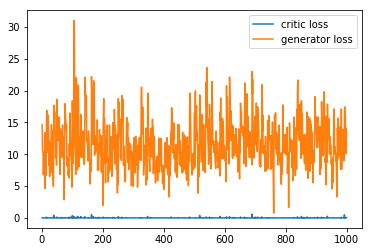

 18%|█▊        | 17099/94950 [55:04<4:10:45,  5.17it/s]

step: 17100, D: 0.00695183, G: 9.40115


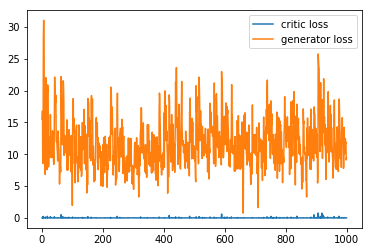

 18%|█▊        | 17199/94950 [55:23<4:10:26,  5.17it/s]

step: 17200, D: 0.00027454, G: 9.29534


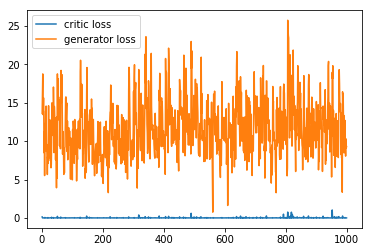

 18%|█▊        | 17299/94950 [55:43<4:10:06,  5.17it/s]

step: 17300, D: 0.00768179, G: 7.55549


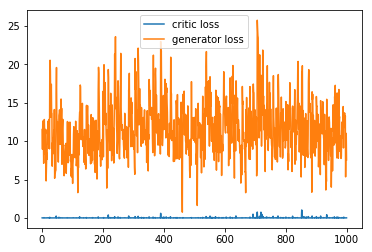

 18%|█▊        | 17399/94950 [56:02<4:09:47,  5.17it/s]

step: 17400, D: 0.00120849, G: 8.44712


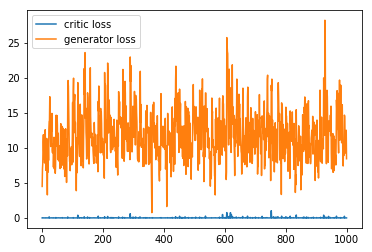

 18%|█▊        | 17499/94950 [56:21<4:09:28,  5.17it/s]

step: 17500, D: 4.22431e-06, G: 10.1372


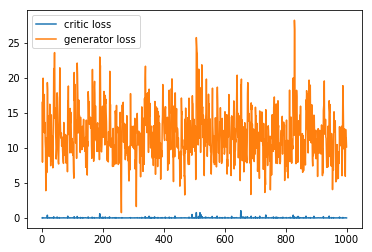

 19%|█▊        | 17599/94950 [56:40<4:09:08,  5.17it/s]

step: 17600, D: 0.00115648, G: 9.34563


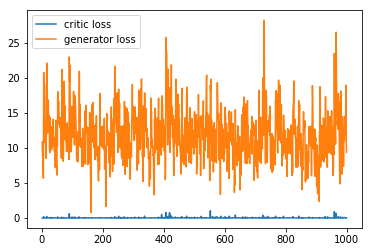

 19%|█▊        | 17699/94950 [57:00<4:08:48,  5.17it/s]

step: 17700, D: 0.000280705, G: 10.7013


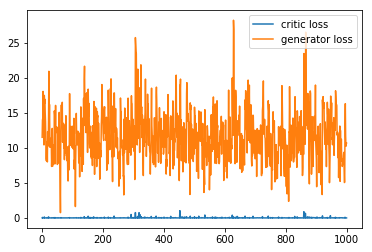

 19%|█▊        | 17799/94950 [57:19<4:08:29,  5.17it/s]

step: 17800, D: 0.00520194, G: 11.2737


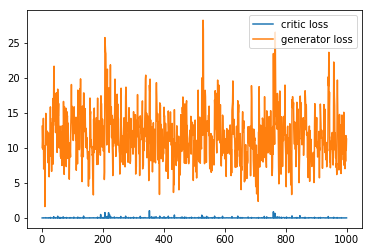

 19%|█▉        | 17899/94950 [57:39<4:08:10,  5.17it/s]

step: 17900, D: 0.0149441, G: 12.4984


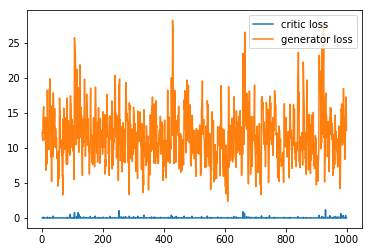

 19%|█▉        | 17999/94950 [57:58<4:07:50,  5.17it/s]

step: 18000, D: 0.000195577, G: 7.38123


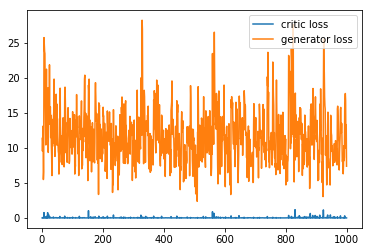

 19%|█▉        | 18099/94950 [58:17<4:07:32,  5.17it/s]

step: 18100, D: 0.0211276, G: 6.12407


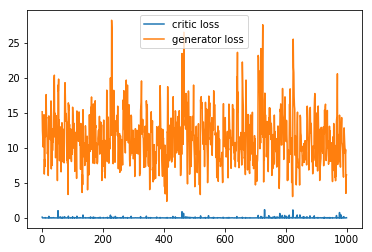

 19%|█▉        | 18199/94950 [58:36<4:07:12,  5.17it/s]

step: 18200, D: 0.100962, G: 11.9258


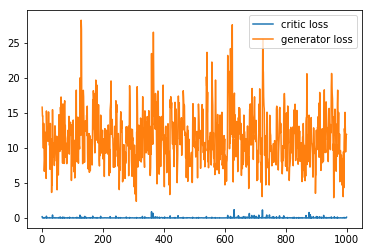

 19%|█▉        | 18299/94950 [58:56<4:06:52,  5.17it/s]

step: 18300, D: 0.000458001, G: 11.9164


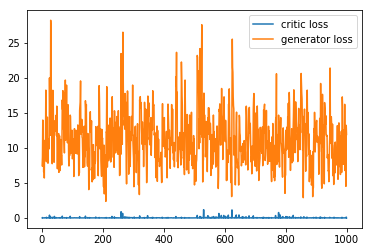

 19%|█▉        | 18399/94950 [59:15<4:06:32,  5.18it/s]

step: 18400, D: 4.50134e-05, G: 12.4256


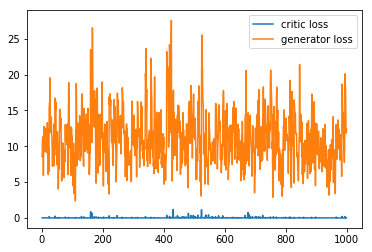

 19%|█▉        | 18499/94950 [59:34<4:06:13,  5.17it/s]

step: 18500, D: 0.00333267, G: 10.1887


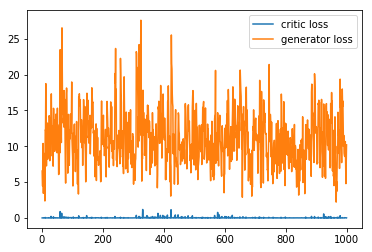

 20%|█▉        | 18599/94950 [59:54<4:05:54,  5.17it/s]

step: 18600, D: 3.95223e-08, G: 12.8972


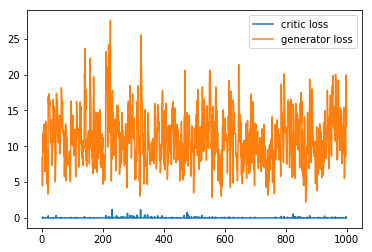

 20%|█▉        | 18699/94950 [1:00:13<4:05:34,  5.17it/s]

step: 18700, D: 0.0230501, G: 16.1856


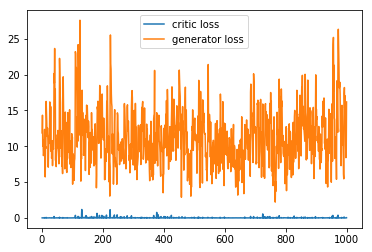

 20%|█▉        | 18799/94950 [1:00:32<4:05:15,  5.17it/s]

step: 18800, D: 0.126517, G: 12.7085


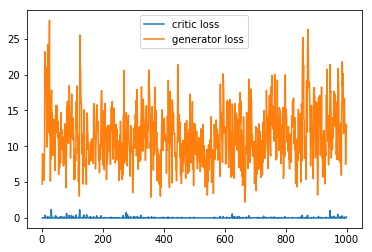

 20%|█▉        | 18899/94950 [1:00:51<4:04:55,  5.18it/s]

step: 18900, D: 0.032571, G: 13.3907


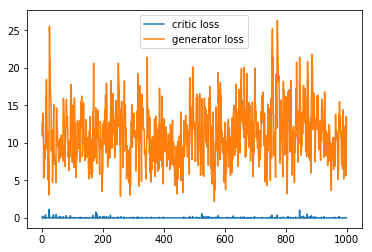

 20%|██        | 18999/94950 [1:01:11<4:04:36,  5.18it/s]

step: 19000, D: 0.00965943, G: 9.17187


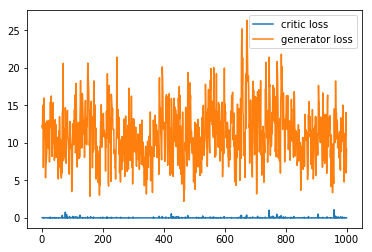

 20%|██        | 19099/94950 [1:01:30<4:04:16,  5.18it/s]

step: 19100, D: 0.00364198, G: 13.9474


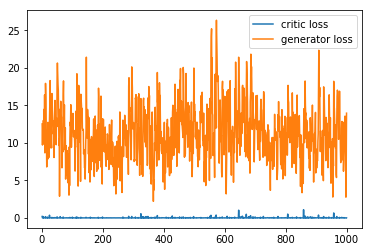

 20%|██        | 19199/94950 [1:01:49<4:03:56,  5.18it/s]

step: 19200, D: 0.0186563, G: 8.72799


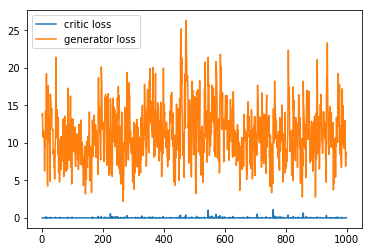

 20%|██        | 19299/94950 [1:02:08<4:03:37,  5.18it/s]

step: 19300, D: 0.0137058, G: 14.8481


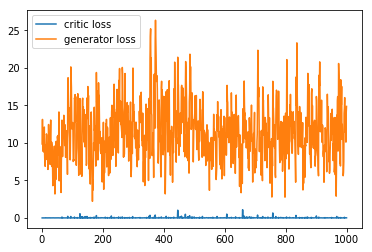

 20%|██        | 19399/94950 [1:02:28<4:03:17,  5.18it/s]

step: 19400, D: 0.0371524, G: 14.3662


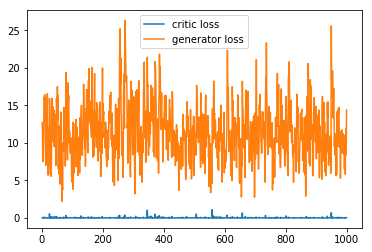

 21%|██        | 19499/94950 [1:02:47<4:02:59,  5.18it/s]

step: 19500, D: 0.0900262, G: 8.06401


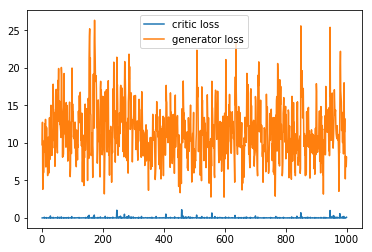

 21%|██        | 19599/94950 [1:03:07<4:02:40,  5.18it/s]

step: 19600, D: 0.00126215, G: 13.2894


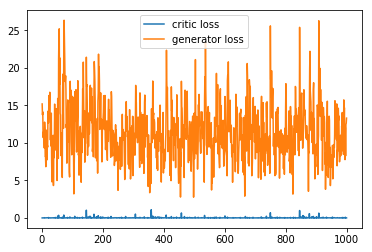

 21%|██        | 19699/94950 [1:03:26<4:02:20,  5.18it/s]

step: 19700, D: 0.00296917, G: 8.29641


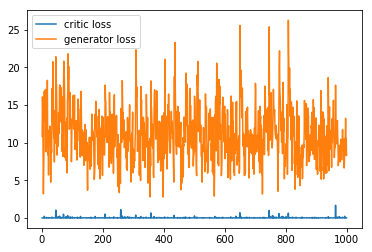

 21%|██        | 19799/94950 [1:03:45<4:02:00,  5.18it/s]

step: 19800, D: 0.00796913, G: 11.0985


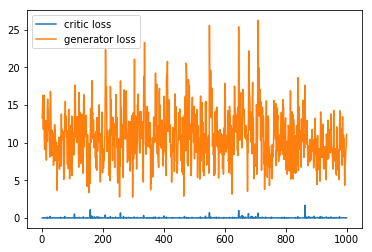

 21%|██        | 19899/94950 [1:04:05<4:01:41,  5.18it/s]

step: 19900, D: 0.00659301, G: 5.25866


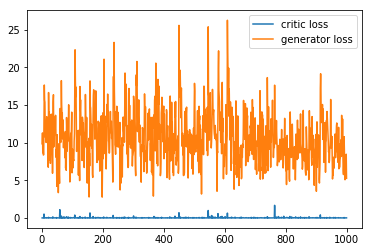

 21%|██        | 19999/94950 [1:04:24<4:01:22,  5.18it/s]

step: 20000, D: 0.0279702, G: 13.1384


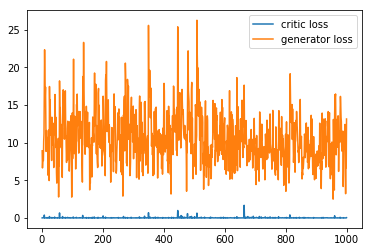

 21%|██        | 20099/94950 [1:04:43<4:01:02,  5.18it/s]

step: 20100, D: 9.85405e-06, G: 12.2491


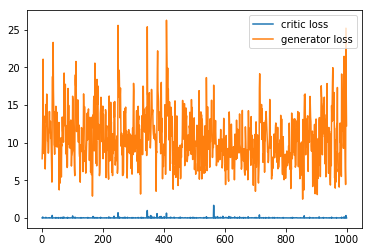

 21%|██▏       | 20199/94950 [1:05:02<4:00:43,  5.18it/s]

step: 20200, D: 3.29861e-08, G: 19.8342


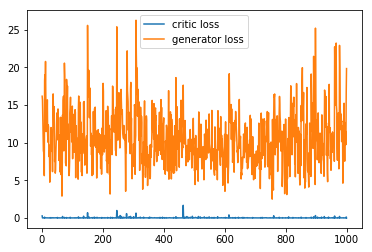

 21%|██▏       | 20299/94950 [1:05:22<4:00:23,  5.18it/s]

step: 20300, D: 0.000369853, G: 16.4686


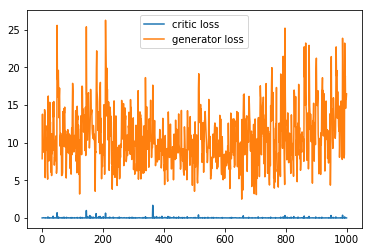

 21%|██▏       | 20399/94950 [1:05:41<4:00:04,  5.18it/s]

step: 20400, D: 6.81852e-05, G: 13.9106


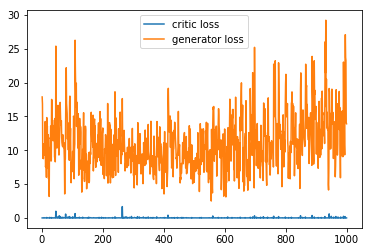

 22%|██▏       | 20499/94950 [1:06:00<3:59:45,  5.18it/s]

step: 20500, D: 1.72829e-05, G: 21.1826


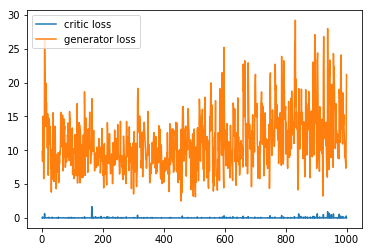

 22%|██▏       | 20599/94950 [1:06:20<3:59:25,  5.18it/s]

step: 20600, D: 3.46252e-05, G: 12.1079


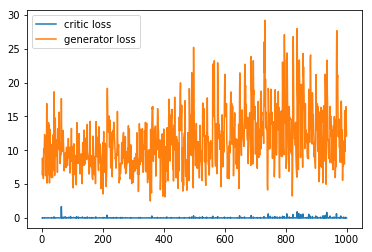

 22%|██▏       | 20699/94950 [1:06:39<3:59:06,  5.18it/s]

step: 20700, D: 0.0061663, G: 9.25543


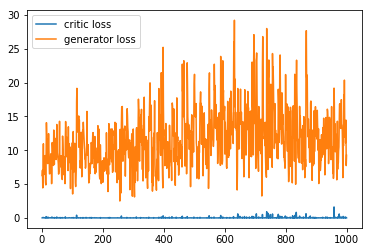

 22%|██▏       | 20799/94950 [1:06:58<3:58:46,  5.18it/s]

step: 20800, D: 0.00186144, G: 8.79545


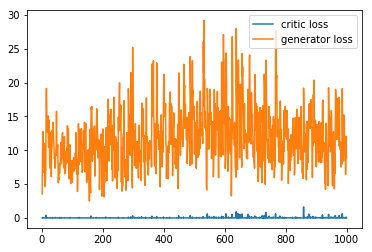

 22%|██▏       | 20899/94950 [1:07:18<3:58:27,  5.18it/s]

step: 20900, D: 0.0146751, G: 13.1417


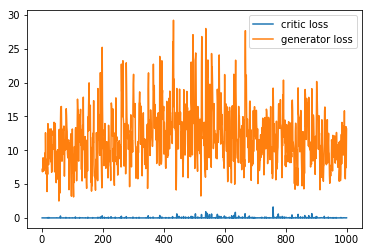

 22%|██▏       | 20999/94950 [1:07:37<3:58:08,  5.18it/s]

step: 21000, D: 0.000255617, G: 12.145


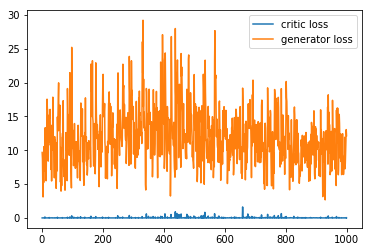

 22%|██▏       | 21099/94950 [1:07:56<3:57:48,  5.18it/s]

step: 21100, D: 0.00440357, G: 5.46501


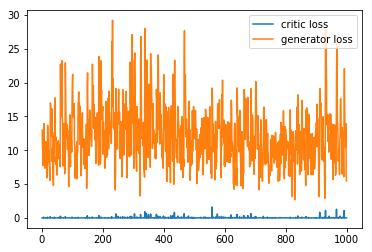

 22%|██▏       | 21199/94950 [1:08:15<3:57:29,  5.18it/s]

step: 21200, D: 0.00571684, G: 10.7184


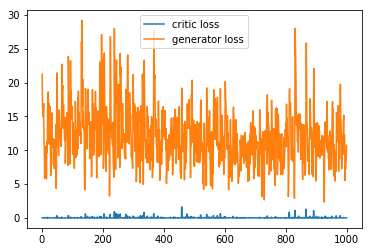

 22%|██▏       | 21299/94950 [1:08:35<3:57:10,  5.18it/s]

step: 21300, D: 0.0137089, G: 7.52094


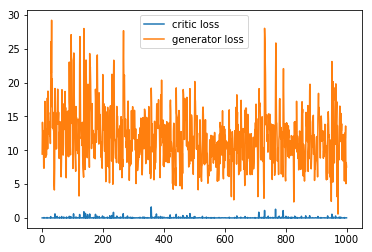

 23%|██▎       | 21399/94950 [1:08:54<3:56:51,  5.18it/s]

step: 21400, D: 0.000292776, G: 6.00055


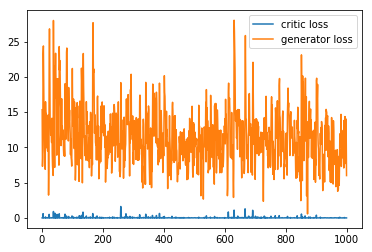

 23%|██▎       | 21499/94950 [1:09:13<3:56:31,  5.18it/s]

step: 21500, D: 0.000365866, G: 10.4536


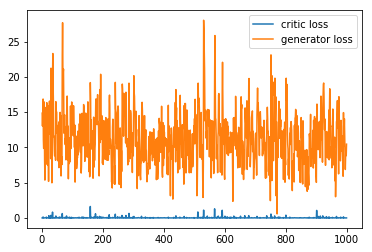

 23%|██▎       | 21599/94950 [1:09:33<3:56:12,  5.18it/s]

step: 21600, D: 2.64409e-05, G: 10.8484


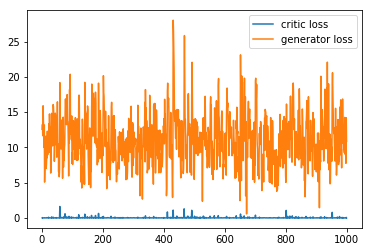

 23%|██▎       | 21699/94950 [1:09:52<3:55:53,  5.18it/s]

step: 21700, D: 4.96028e-05, G: 6.72875


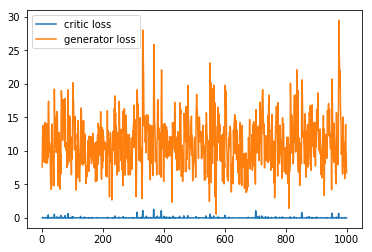

 23%|██▎       | 21799/94950 [1:10:12<3:55:34,  5.18it/s]

step: 21800, D: 1.52432e-05, G: 13.09


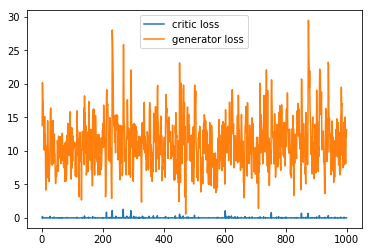

 23%|██▎       | 21899/94950 [1:10:31<3:55:14,  5.18it/s]

step: 21900, D: 2.26536e-07, G: 15.2397


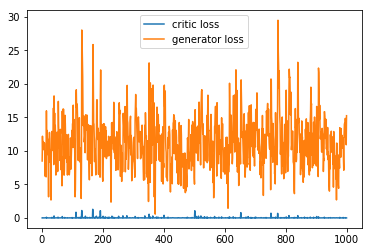

 23%|██▎       | 21999/94950 [1:10:50<3:54:55,  5.18it/s]

step: 22000, D: 0.000191501, G: 8.3553


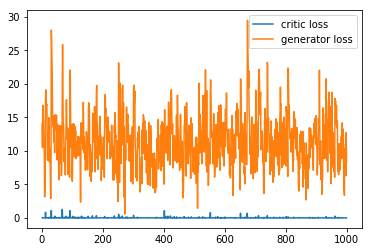

 23%|██▎       | 22099/94950 [1:11:10<3:54:36,  5.18it/s]

step: 22100, D: 0.000467146, G: 13.3298


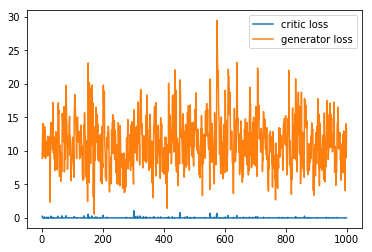

 23%|██▎       | 22199/94950 [1:11:29<3:54:17,  5.18it/s]

step: 22200, D: 0.000463281, G: 11.2734


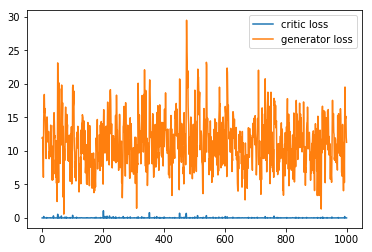

 23%|██▎       | 22299/94950 [1:11:48<3:53:58,  5.18it/s]

step: 22300, D: 7.65488e-08, G: 16.1447


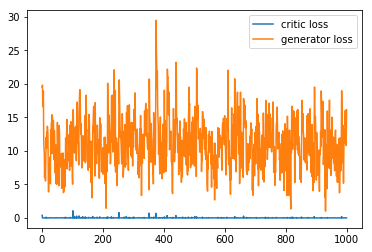

 24%|██▎       | 22399/94950 [1:12:08<3:53:38,  5.18it/s]

step: 22400, D: 1.35518e-06, G: 19.0583


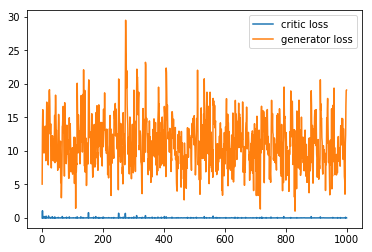

 24%|██▎       | 22499/94950 [1:12:27<3:53:18,  5.18it/s]

step: 22500, D: 0.0127473, G: 11.5797


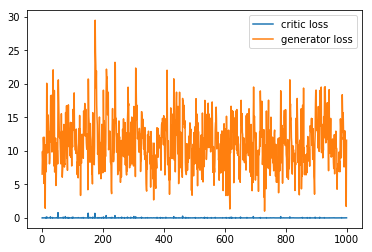

 24%|██▍       | 22599/94950 [1:12:46<3:52:58,  5.18it/s]

step: 22600, D: 0.00262647, G: 12.181


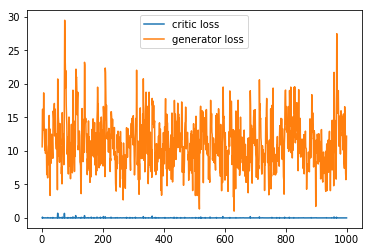

 24%|██▍       | 22699/94950 [1:13:05<3:52:39,  5.18it/s]

step: 22700, D: 0.000224736, G: 11.5891


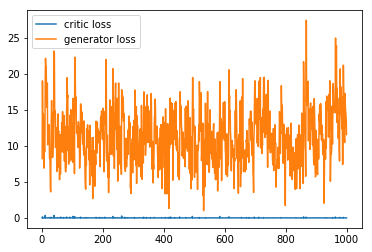

 24%|██▍       | 22799/94950 [1:13:24<3:52:19,  5.18it/s]

step: 22800, D: 2.35897e-06, G: 15.0718


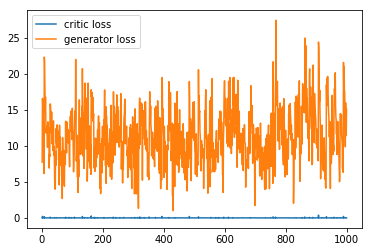

 24%|██▍       | 22899/94950 [1:13:44<3:51:59,  5.18it/s]

step: 22900, D: 6.86076e-08, G: 13.8824


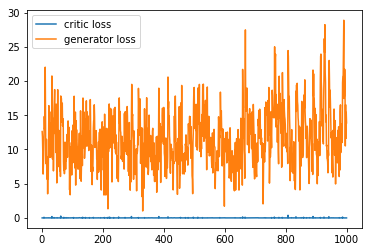

 24%|██▍       | 22999/94950 [1:14:03<3:51:41,  5.18it/s]

step: 23000, D: 0.0235511, G: 12.1473


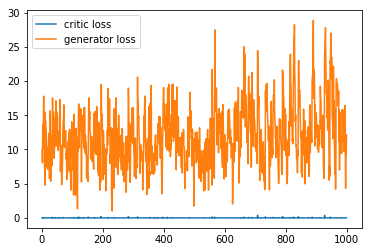

 24%|██▍       | 23099/94950 [1:14:22<3:51:22,  5.18it/s]

step: 23100, D: 2.98781e-06, G: 19.7637


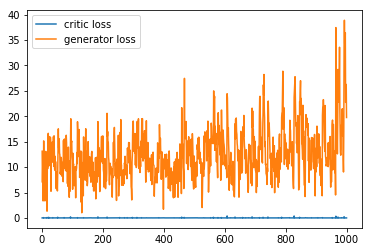

 24%|██▍       | 23199/94950 [1:14:41<3:51:02,  5.18it/s]

step: 23200, D: 2.12062e-09, G: 23.5451


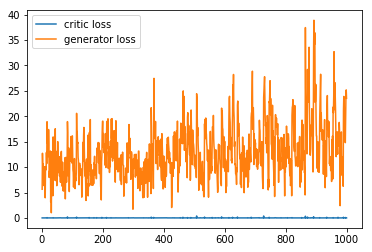

 25%|██▍       | 23299/94950 [1:15:01<3:50:42,  5.18it/s]

step: 23300, D: 8.21376e-07, G: 10.3806


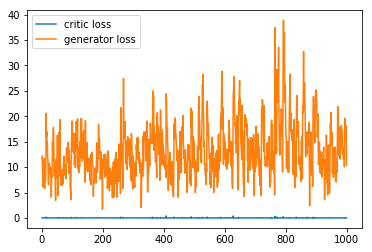

 25%|██▍       | 23399/94950 [1:15:20<3:50:22,  5.18it/s]

step: 23400, D: 4.38266e-07, G: 25.3719


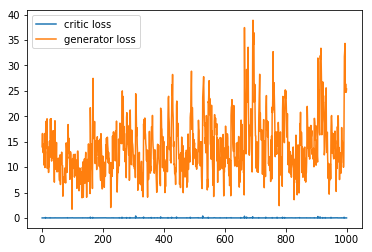

 25%|██▍       | 23499/94950 [1:15:39<3:50:03,  5.18it/s]

step: 23500, D: 0.000186862, G: 12.4562


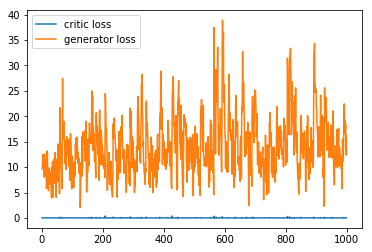

 25%|██▍       | 23599/94950 [1:15:58<3:49:43,  5.18it/s]

step: 23600, D: 2.58588e-06, G: 15.7612


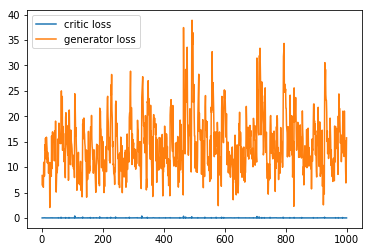

 25%|██▍       | 23699/94950 [1:16:18<3:49:24,  5.18it/s]

step: 23700, D: 0.000701524, G: 11.7042


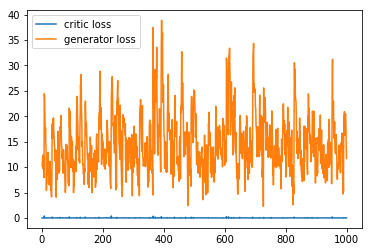

 25%|██▌       | 23799/94950 [1:16:37<3:49:05,  5.18it/s]

step: 23800, D: 1.0508e-09, G: 33.8645


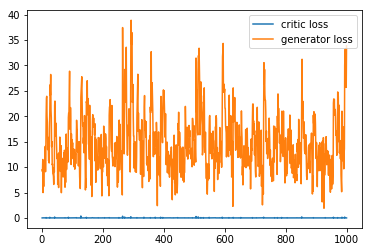

 25%|██▌       | 23899/94950 [1:16:56<3:48:46,  5.18it/s]

step: 23900, D: 0.0116058, G: 13.4686


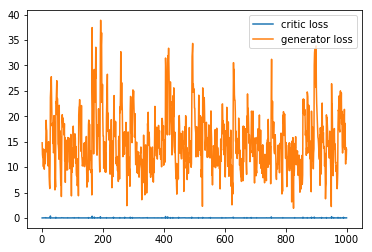

 25%|██▌       | 23999/94950 [1:17:16<3:48:26,  5.18it/s]

step: 24000, D: 8.13918e-05, G: 10.8524


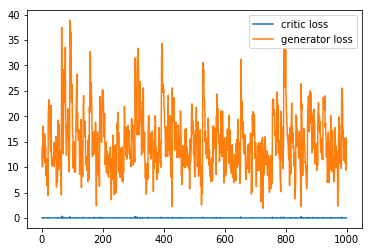

 25%|██▌       | 24099/94950 [1:17:35<3:48:08,  5.18it/s]

step: 24100, D: 0.000154653, G: 9.1364


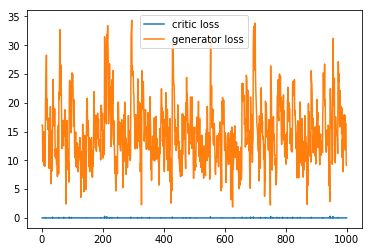

 25%|██▌       | 24199/94950 [1:17:55<3:47:48,  5.18it/s]

step: 24200, D: 1.09485e-05, G: 12.7048


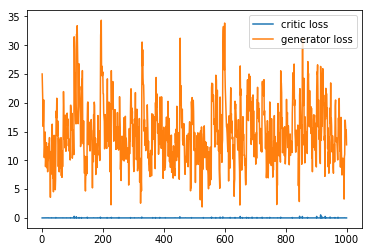

 26%|██▌       | 24299/94950 [1:18:14<3:47:28,  5.18it/s]

step: 24300, D: 1.84213e-05, G: 10.2752


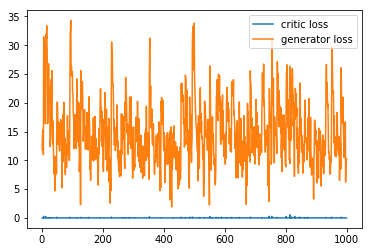

 26%|██▌       | 24399/94950 [1:18:33<3:47:09,  5.18it/s]

step: 24400, D: 0.00496135, G: 15.5834


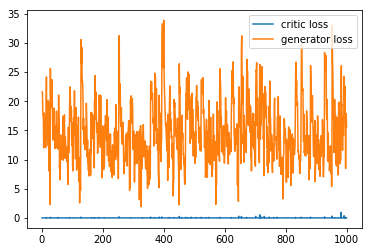

 26%|██▌       | 24499/94950 [1:18:52<3:46:50,  5.18it/s]

step: 24500, D: 1.53963e-06, G: 15.3653


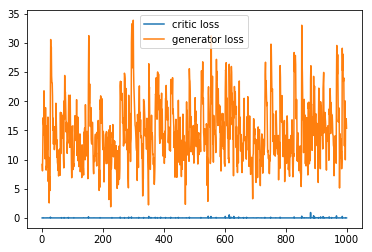

 26%|██▌       | 24599/94950 [1:19:12<3:46:30,  5.18it/s]

step: 24600, D: 0.000147767, G: 16.961


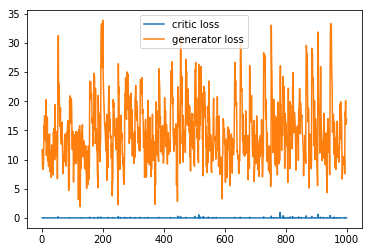

 26%|██▌       | 24699/94950 [1:19:31<3:46:11,  5.18it/s]

step: 24700, D: 0.000949366, G: 13.6593


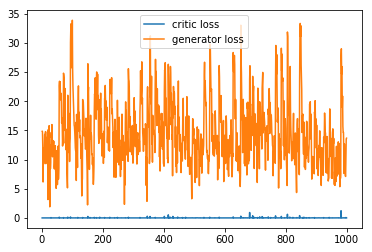

 26%|██▌       | 24799/94950 [1:19:50<3:45:52,  5.18it/s]

step: 24800, D: 5.03619e-07, G: 22.6857


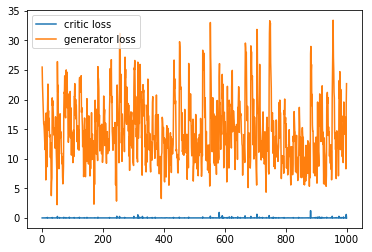

 26%|██▌       | 24899/94950 [1:20:10<3:45:32,  5.18it/s]

step: 24900, D: 3.77473e-06, G: 18.8661


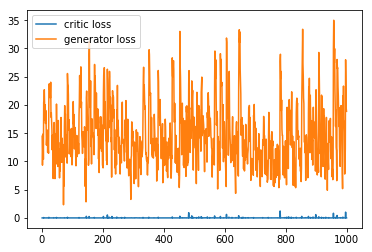

 26%|██▋       | 24999/94950 [1:20:29<3:45:13,  5.18it/s]

step: 25000, D: 0.000566026, G: 9.28348


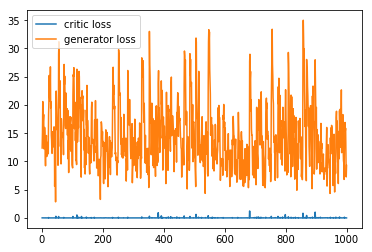

 26%|██▋       | 25099/94950 [1:20:48<3:44:54,  5.18it/s]

step: 25100, D: 0.0295285, G: 8.97781


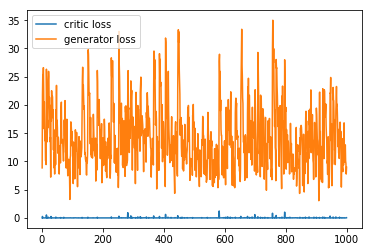

 27%|██▋       | 25199/94950 [1:21:08<3:44:34,  5.18it/s]

step: 25200, D: 0.000146235, G: 7.93771


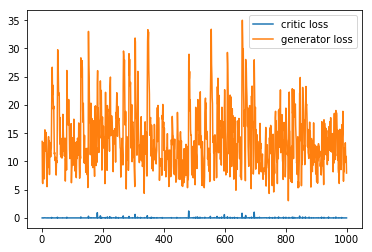

 27%|██▋       | 25299/94950 [1:21:27<3:44:15,  5.18it/s]

step: 25300, D: 0.0622716, G: 10.0402


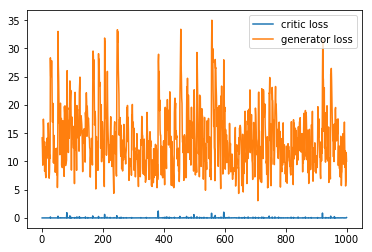

 27%|██▋       | 25399/94950 [1:21:46<3:43:56,  5.18it/s]

step: 25400, D: 0.00764941, G: 7.33617


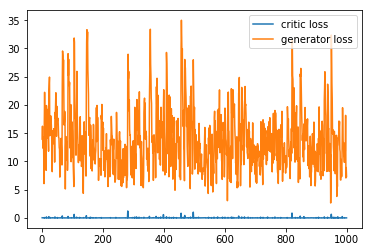

 27%|██▋       | 25499/94950 [1:22:06<3:43:37,  5.18it/s]

step: 25500, D: 0.0002072, G: 9.82032


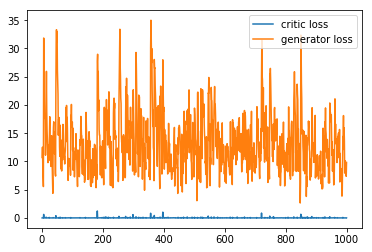

 27%|██▋       | 25599/94950 [1:22:25<3:43:18,  5.18it/s]

step: 25600, D: 0.00571072, G: 10.8528


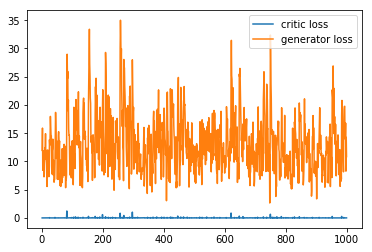

 27%|██▋       | 25699/94950 [1:22:44<3:42:58,  5.18it/s]

step: 25700, D: 0.000125204, G: 9.83867


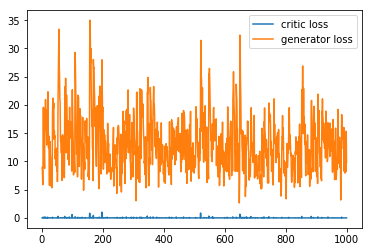

 27%|██▋       | 25799/94950 [1:23:04<3:42:39,  5.18it/s]

step: 25800, D: 0.000315037, G: 11.4664


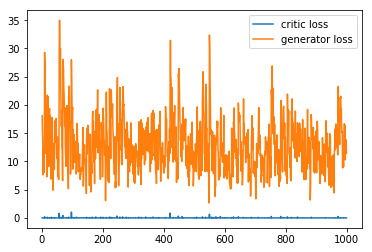

 27%|██▋       | 25899/94950 [1:23:23<3:42:20,  5.18it/s]

step: 25900, D: 0.120531, G: 18.0387


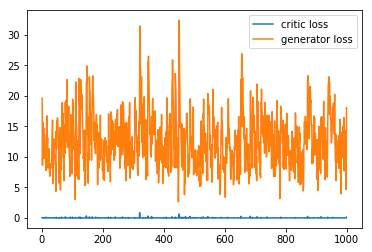

 27%|██▋       | 25999/94950 [1:23:42<3:42:01,  5.18it/s]

step: 26000, D: 5.48498e-08, G: 17.6466


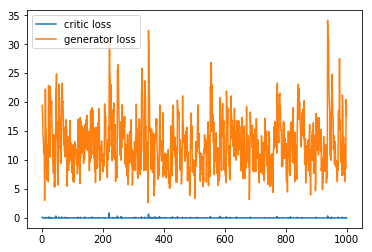

 27%|██▋       | 26099/94950 [1:24:02<3:41:41,  5.18it/s]

step: 26100, D: 6.75742e-07, G: 14.4372


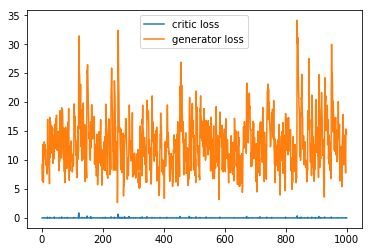

 28%|██▊       | 26199/94950 [1:24:21<3:41:22,  5.18it/s]

step: 26200, D: 0.0108152, G: 9.16041


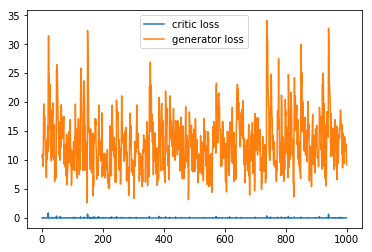

 28%|██▊       | 26299/94950 [1:24:40<3:41:02,  5.18it/s]

step: 26300, D: 1.31157e-05, G: 11.2162


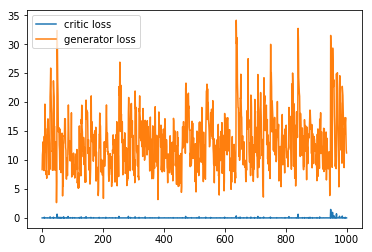

 28%|██▊       | 26399/94950 [1:24:59<3:40:42,  5.18it/s]

step: 26400, D: 0.00015868, G: 16.4127


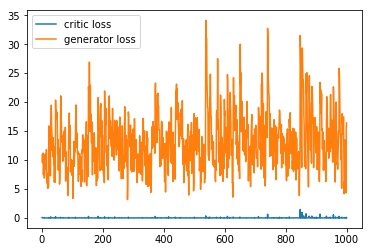

 28%|██▊       | 26499/94950 [1:25:19<3:40:23,  5.18it/s]

step: 26500, D: 0.000581741, G: 6.69915


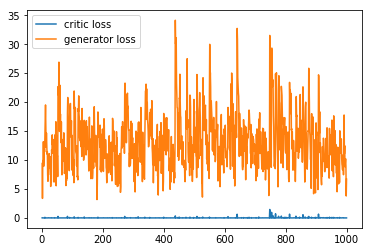

 28%|██▊       | 26599/94950 [1:25:38<3:40:03,  5.18it/s]

step: 26600, D: 0.025357, G: 13.5197


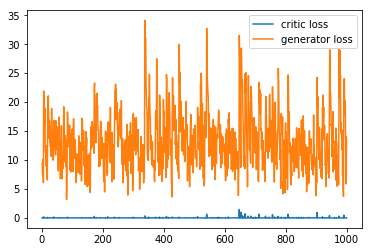

 28%|██▊       | 26699/94950 [1:25:57<3:39:44,  5.18it/s]

step: 26700, D: 0.118404, G: 12.9996


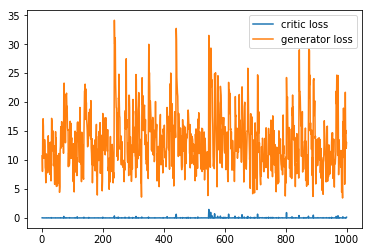

 28%|██▊       | 26799/94950 [1:26:16<3:39:24,  5.18it/s]

step: 26800, D: 0.0125087, G: 10.1546


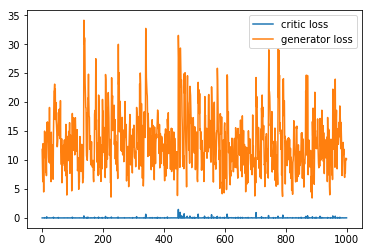

 28%|██▊       | 26899/94950 [1:26:36<3:39:05,  5.18it/s]

step: 26900, D: 0.000168222, G: 8.45177


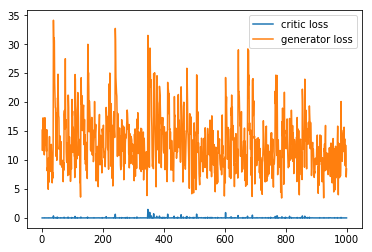

 28%|██▊       | 26999/94950 [1:26:55<3:38:46,  5.18it/s]

step: 27000, D: 1.22328e-08, G: 19.8997


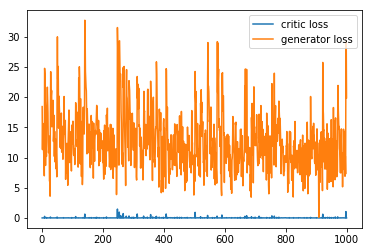

 29%|██▊       | 27099/94950 [1:27:14<3:38:26,  5.18it/s]

step: 27100, D: 0.0120314, G: 6.9368


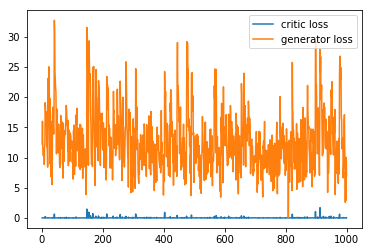

 29%|██▊       | 27199/94950 [1:27:34<3:38:07,  5.18it/s]

step: 27200, D: 0.00250577, G: 9.08934


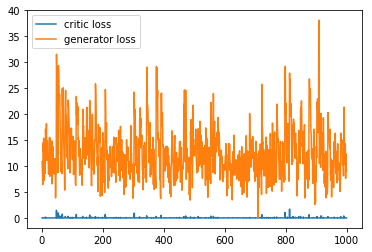

 29%|██▉       | 27299/94950 [1:27:53<3:37:48,  5.18it/s]

step: 27300, D: 0.711483, G: 22.6375


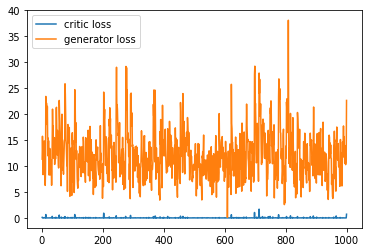

 29%|██▉       | 27399/94950 [1:28:12<3:37:28,  5.18it/s]

step: 27400, D: 0.000141238, G: 7.06509


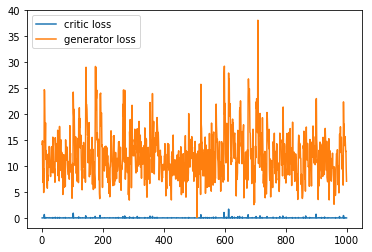

 29%|██▉       | 27499/94950 [1:28:31<3:37:08,  5.18it/s]

step: 27500, D: 1.77387e-05, G: 10.5696


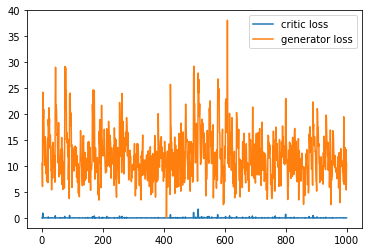

 29%|██▉       | 27599/94950 [1:28:50<3:36:49,  5.18it/s]

step: 27600, D: 0.045246, G: 11.7644


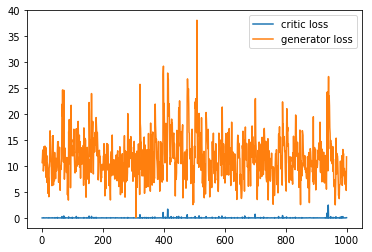

 29%|██▉       | 27699/94950 [1:29:10<3:36:29,  5.18it/s]

step: 27700, D: 0.000345273, G: 9.40761


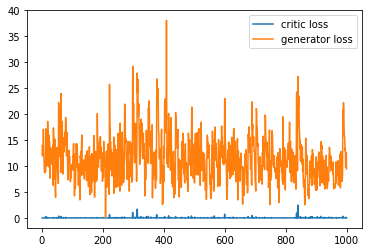

 29%|██▉       | 27799/94950 [1:29:29<3:36:09,  5.18it/s]

step: 27800, D: 0.0616624, G: 12.0719


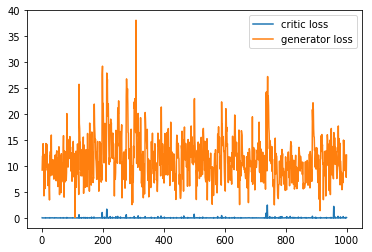

 29%|██▉       | 27899/94950 [1:29:48<3:35:50,  5.18it/s]

step: 27900, D: 0.00932204, G: 7.36923


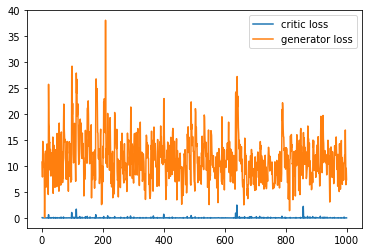

 29%|██▉       | 27999/94950 [1:30:07<3:35:31,  5.18it/s]

step: 28000, D: 0.0854903, G: 17.8077


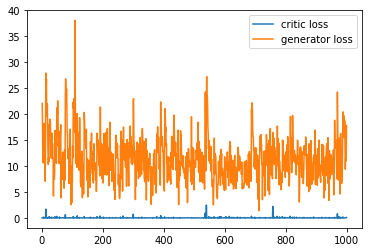

 30%|██▉       | 28099/94950 [1:30:27<3:35:11,  5.18it/s]

step: 28100, D: 0.000882616, G: 7.69376


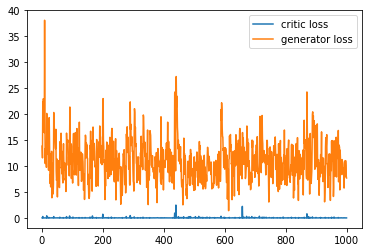

 30%|██▉       | 28199/94950 [1:30:46<3:34:52,  5.18it/s]

step: 28200, D: 0.0375389, G: 9.51298


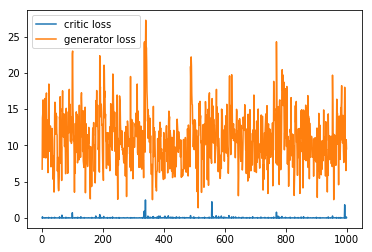

 30%|██▉       | 28299/94950 [1:31:05<3:34:33,  5.18it/s]

step: 28300, D: 0.000479785, G: 11.862


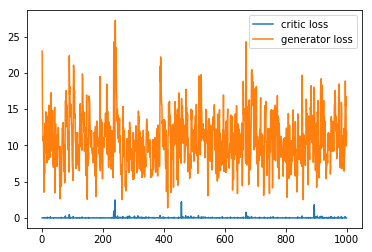

 30%|██▉       | 28399/94950 [1:31:24<3:34:13,  5.18it/s]

step: 28400, D: 0.000517835, G: 11.4188


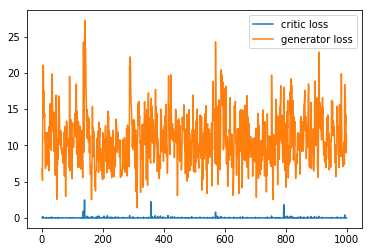

 30%|███       | 28499/94950 [1:31:44<3:33:53,  5.18it/s]

step: 28500, D: 0.204919, G: 19.4206


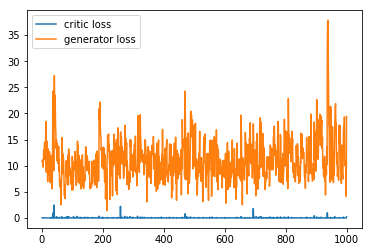

 30%|███       | 28599/94950 [1:32:03<3:33:34,  5.18it/s]

step: 28600, D: 0.000169864, G: 11.4629


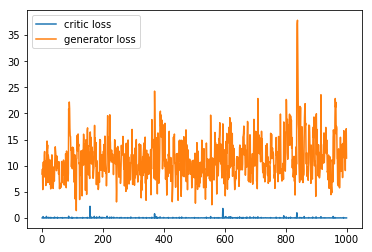

 30%|███       | 28699/94950 [1:32:22<3:33:15,  5.18it/s]

step: 28700, D: 0.00384185, G: 15.1386


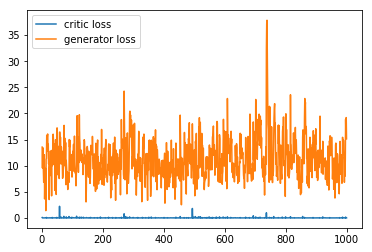

 30%|███       | 28799/94950 [1:32:42<3:32:55,  5.18it/s]

step: 28800, D: 1.51649e-07, G: 8.86113


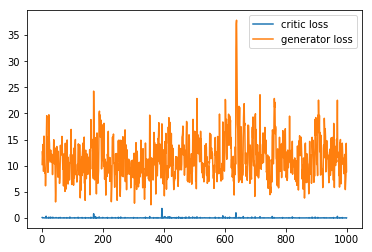

 30%|███       | 28899/94950 [1:33:01<3:32:36,  5.18it/s]

step: 28900, D: 0.00794228, G: 9.92537


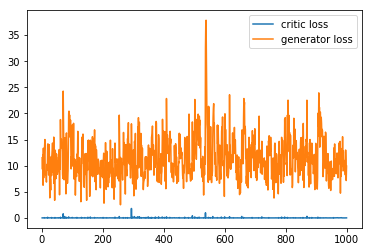

 31%|███       | 28999/94950 [1:33:20<3:32:17,  5.18it/s]

step: 29000, D: 0.000113837, G: 9.61542


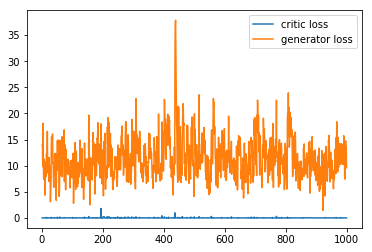

 31%|███       | 29099/94950 [1:33:40<3:31:58,  5.18it/s]

step: 29100, D: 0.000460324, G: 10.0207


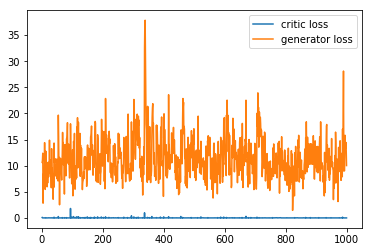

 31%|███       | 29199/94950 [1:33:59<3:31:38,  5.18it/s]

step: 29200, D: 0.000380062, G: 7.01435


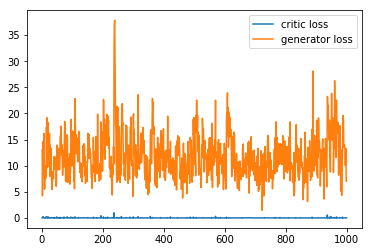

 31%|███       | 29299/94950 [1:34:18<3:31:19,  5.18it/s]

step: 29300, D: 0.00142602, G: 13.5668


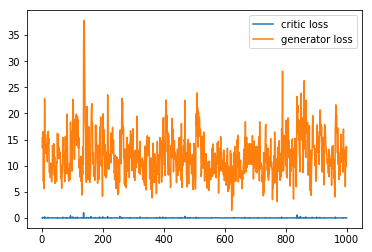

 31%|███       | 29399/94950 [1:34:38<3:31:00,  5.18it/s]

step: 29400, D: 9.30508e-05, G: 21.618


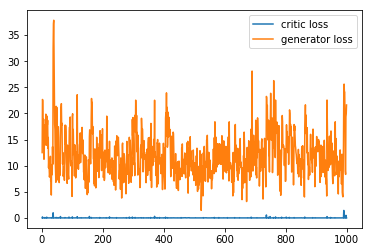

 31%|███       | 29499/94950 [1:34:57<3:30:40,  5.18it/s]

step: 29500, D: 0.000613791, G: 7.05311


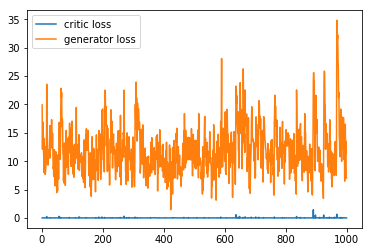

 31%|███       | 29599/94950 [1:35:16<3:30:20,  5.18it/s]

step: 29600, D: 0.000863051, G: 9.35947


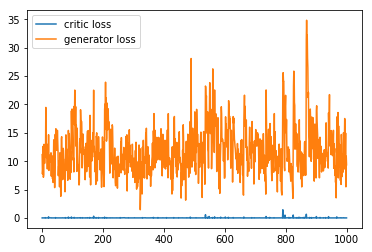

 31%|███▏      | 29699/94950 [1:35:35<3:30:01,  5.18it/s]

step: 29700, D: 0.000137808, G: 12.7716


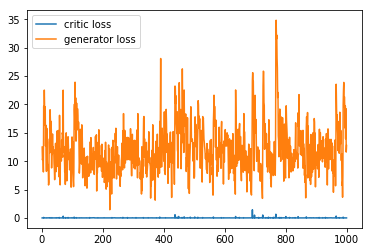

 31%|███▏      | 29799/94950 [1:35:54<3:29:42,  5.18it/s]

step: 29800, D: 0.00901902, G: 5.69898


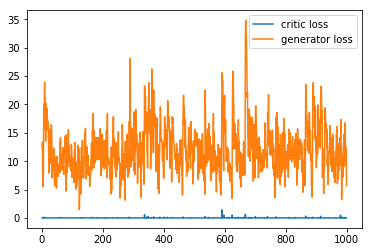

 31%|███▏      | 29899/94950 [1:36:14<3:29:23,  5.18it/s]

step: 29900, D: 0.0225107, G: 11.0824


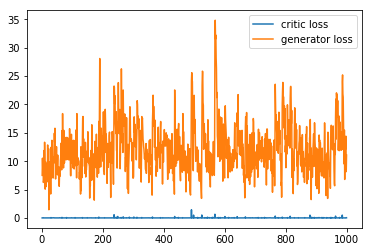

 32%|███▏      | 29999/94950 [1:36:33<3:29:04,  5.18it/s]

step: 30000, D: 6.13198e-05, G: 10.0859


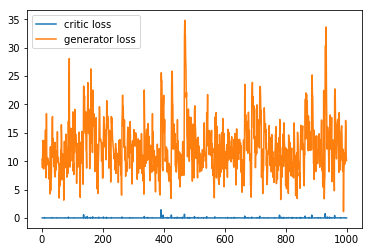

 32%|███▏      | 30099/94950 [1:36:53<3:28:44,  5.18it/s]

step: 30100, D: 2.14829e-05, G: 13.1278


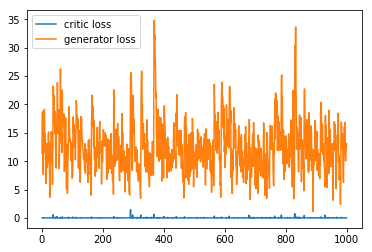

 32%|███▏      | 30199/94950 [1:37:12<3:28:25,  5.18it/s]

step: 30200, D: 0.00109179, G: 6.59092


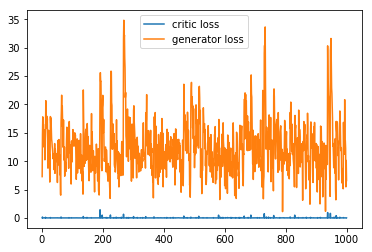

 32%|███▏      | 30299/94950 [1:37:31<3:28:05,  5.18it/s]

step: 30300, D: 0.00225648, G: 8.41691


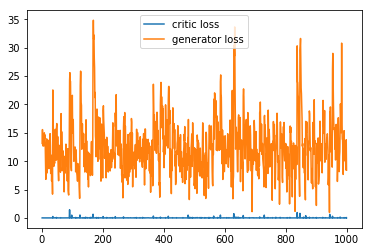

 32%|███▏      | 30399/94950 [1:37:51<3:27:46,  5.18it/s]

step: 30400, D: 0.000139298, G: 11.133


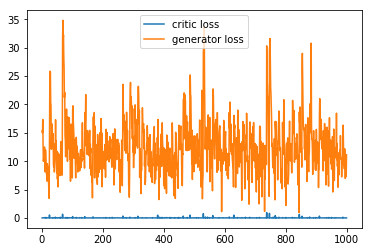

 32%|███▏      | 30499/94950 [1:38:10<3:27:27,  5.18it/s]

step: 30500, D: 0.0160883, G: 13.7115


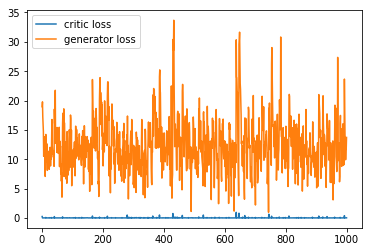

 32%|███▏      | 30599/94950 [1:38:29<3:27:07,  5.18it/s]

step: 30600, D: 0.0144488, G: 11.8027


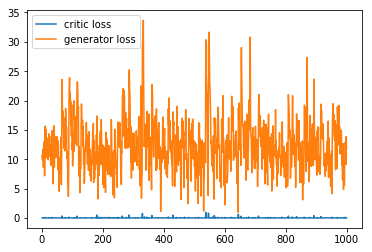

 32%|███▏      | 30699/94950 [1:38:48<3:26:48,  5.18it/s]

step: 30700, D: 5.49113e-07, G: 13.3367


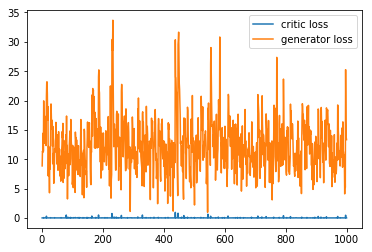

 32%|███▏      | 30799/94950 [1:39:08<3:26:29,  5.18it/s]

step: 30800, D: 0.000136103, G: 11.5273


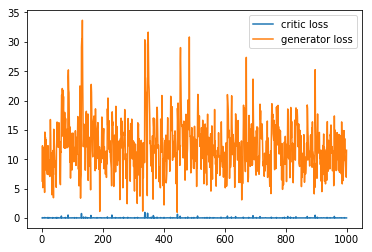

 33%|███▎      | 30899/94950 [1:39:27<3:26:09,  5.18it/s]

step: 30900, D: 1.11247e-05, G: 12.0427


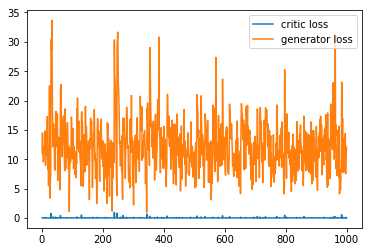

 33%|███▎      | 30999/94950 [1:39:46<3:25:50,  5.18it/s]

step: 31000, D: 5.63093e-06, G: 11.5995


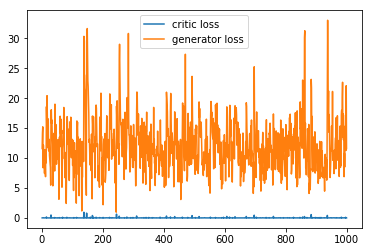

 33%|███▎      | 31099/94950 [1:40:06<3:25:31,  5.18it/s]

step: 31100, D: 5.23682e-06, G: 8.97988


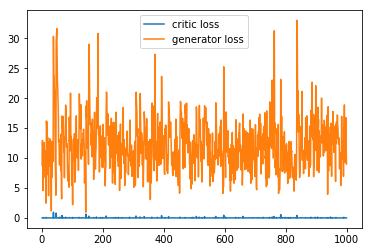

 33%|███▎      | 31199/94950 [1:40:25<3:25:11,  5.18it/s]

step: 31200, D: 5.06432e-05, G: 13.043


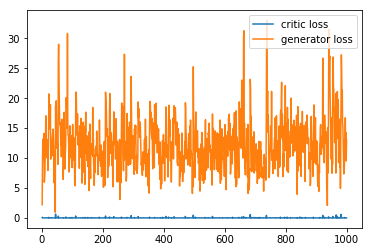

 33%|███▎      | 31299/94950 [1:40:44<3:24:52,  5.18it/s]

step: 31300, D: 0.00213188, G: 13.7903


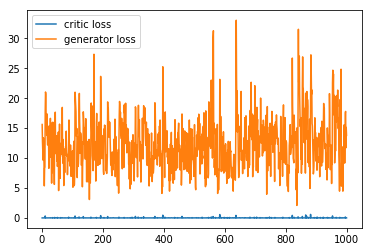

 33%|███▎      | 31399/94950 [1:41:03<3:24:33,  5.18it/s]

step: 31400, D: 0.00540285, G: 6.05132


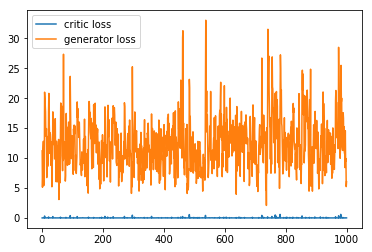

 33%|███▎      | 31499/94950 [1:41:23<3:24:13,  5.18it/s]

step: 31500, D: 0.013062, G: 14.6671


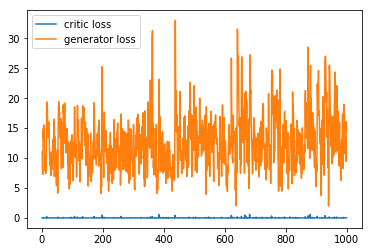

 33%|███▎      | 31599/94950 [1:41:42<3:23:54,  5.18it/s]

step: 31600, D: 0.114205, G: 12.4724


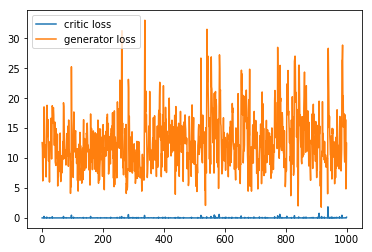

 33%|███▎      | 31699/94950 [1:42:01<3:23:34,  5.18it/s]

step: 31700, D: 0.00151008, G: 6.61556


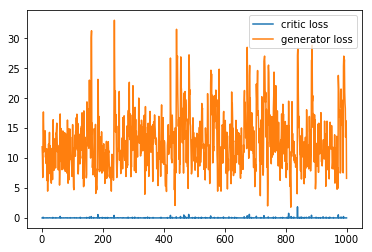

 33%|███▎      | 31799/94950 [1:42:21<3:23:16,  5.18it/s]

step: 31800, D: 1.295e-05, G: 13.6302


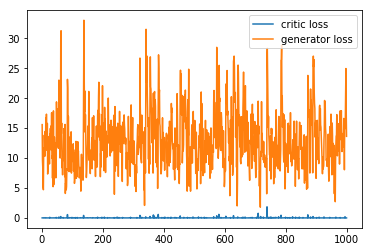

 34%|███▎      | 31899/94950 [1:42:40<3:22:56,  5.18it/s]

step: 31900, D: 4.18406e-06, G: 15.5582


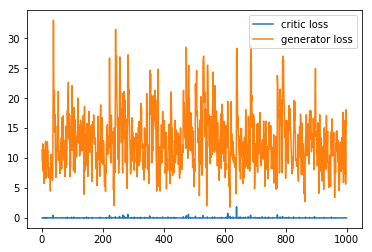

 34%|███▎      | 31999/94950 [1:42:59<3:22:37,  5.18it/s]

step: 32000, D: 0.00074316, G: 9.05814


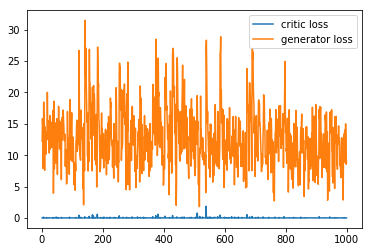

 34%|███▍      | 32099/94950 [1:43:19<3:22:18,  5.18it/s]

step: 32100, D: 6.47024e-05, G: 10.1657


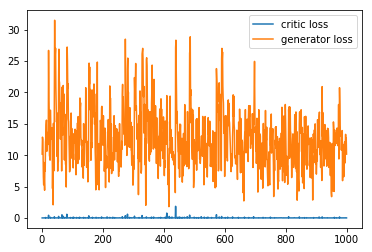

 34%|███▍      | 32199/94950 [1:43:38<3:21:58,  5.18it/s]

step: 32200, D: 0.000687403, G: 12.2168


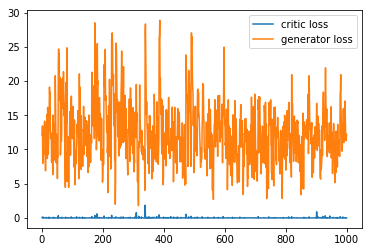

 34%|███▍      | 32299/94950 [1:43:57<3:21:39,  5.18it/s]

step: 32300, D: 0.00124206, G: 12.8162


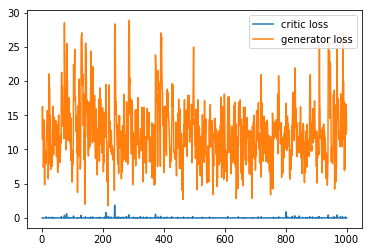

 34%|███▍      | 32399/94950 [1:44:16<3:21:19,  5.18it/s]

step: 32400, D: 0.000981439, G: 8.94396


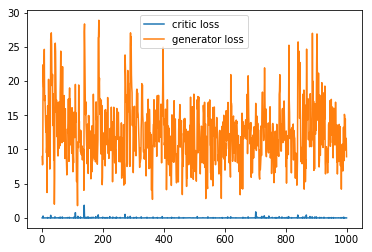

 34%|███▍      | 32499/94950 [1:44:36<3:21:00,  5.18it/s]

step: 32500, D: 6.24043e-05, G: 14.4812


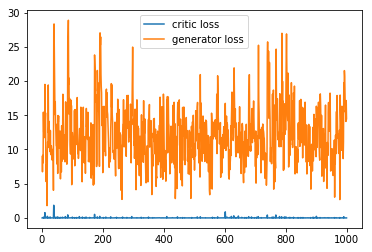

 34%|███▍      | 32599/94950 [1:44:55<3:20:41,  5.18it/s]

step: 32600, D: 0.000816709, G: 8.16533


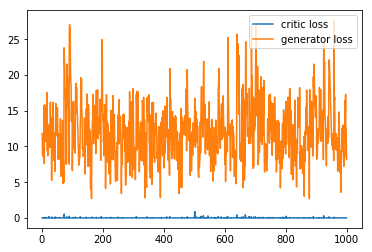

 34%|███▍      | 32699/94950 [1:45:14<3:20:22,  5.18it/s]

step: 32700, D: 0.0827402, G: 17.369


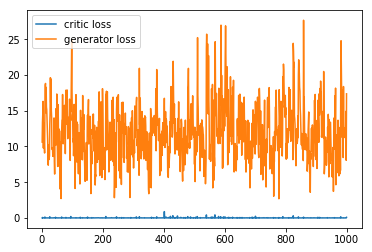

 35%|███▍      | 32799/94950 [1:45:34<3:20:02,  5.18it/s]

step: 32800, D: 2.59539e-05, G: 11.7516


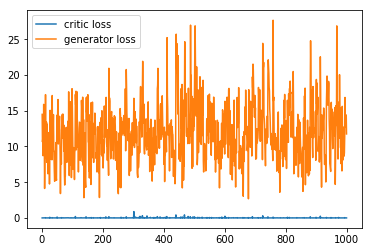

 35%|███▍      | 32899/94950 [1:45:53<3:19:43,  5.18it/s]

step: 32900, D: 0.000127937, G: 11.0444


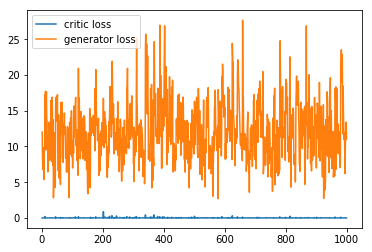

 35%|███▍      | 32999/94950 [1:46:13<3:19:24,  5.18it/s]

step: 33000, D: 0.0928821, G: 19.9547


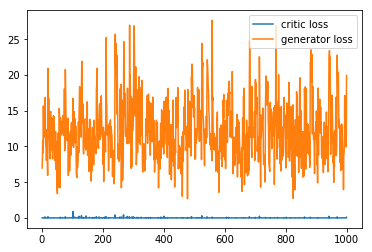

 35%|███▍      | 33099/94950 [1:46:32<3:19:04,  5.18it/s]

step: 33100, D: 0.00168001, G: 9.52691


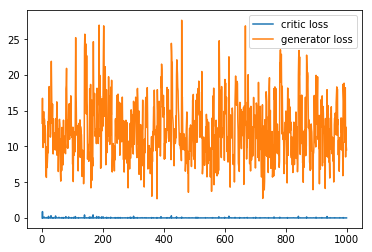

 35%|███▍      | 33199/94950 [1:46:51<3:18:45,  5.18it/s]

step: 33200, D: 0.047109, G: 18.6932


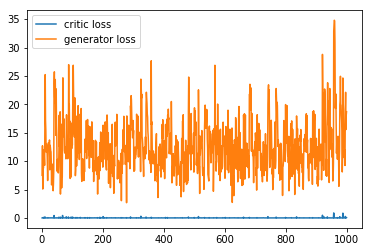

 35%|███▌      | 33299/94950 [1:47:10<3:18:26,  5.18it/s]

step: 33300, D: 1.93275e-06, G: 19.1217


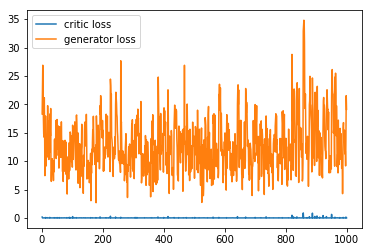

 35%|███▌      | 33399/94950 [1:47:30<3:18:06,  5.18it/s]

step: 33400, D: 0.00147875, G: 12.2021


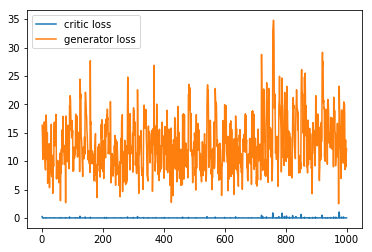

 35%|███▌      | 33499/94950 [1:47:49<3:17:48,  5.18it/s]

step: 33500, D: 0.000184903, G: 13.1


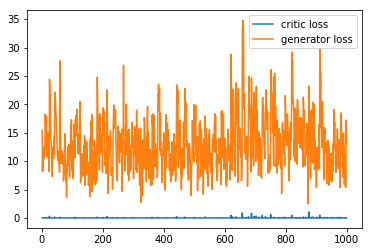

 35%|███▌      | 33599/94950 [1:48:08<3:17:28,  5.18it/s]

step: 33600, D: 3.30024e-07, G: 10.6343


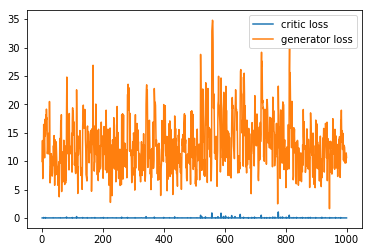

 35%|███▌      | 33699/94950 [1:48:27<3:17:08,  5.18it/s]

step: 33700, D: 3.2752e-05, G: 14.6659


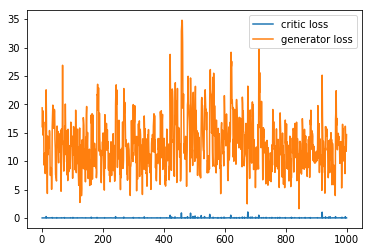

 36%|███▌      | 33799/94950 [1:48:47<3:16:49,  5.18it/s]

step: 33800, D: 0.000566052, G: 4.75539


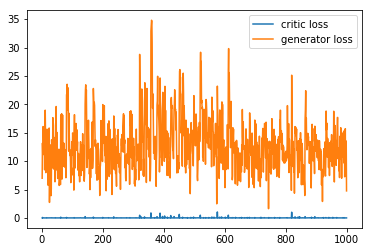

 36%|███▌      | 33899/94950 [1:49:06<3:16:30,  5.18it/s]

step: 33900, D: 1.10323e-06, G: 11.5971


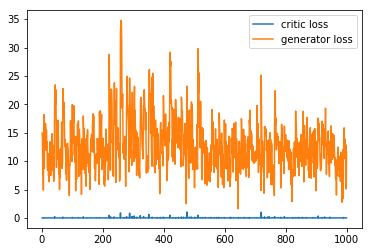

 36%|███▌      | 33999/94950 [1:49:25<3:16:11,  5.18it/s]

step: 34000, D: 0.033465, G: 10.5469


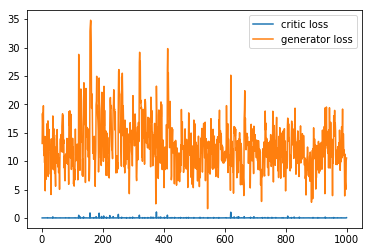

 36%|███▌      | 34099/94950 [1:49:45<3:15:51,  5.18it/s]

step: 34100, D: 0.00183165, G: 8.71655


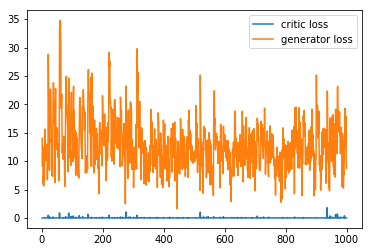

 36%|███▌      | 34199/94950 [1:50:04<3:15:32,  5.18it/s]

step: 34200, D: 0.000765041, G: 8.71787


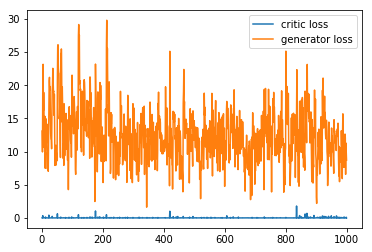

 36%|███▌      | 34299/94950 [1:50:23<3:15:12,  5.18it/s]

step: 34300, D: 0.000218741, G: 9.69558


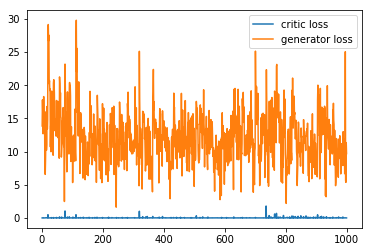

 36%|███▌      | 34399/94950 [1:50:42<3:14:52,  5.18it/s]

step: 34400, D: 0.105569, G: 11.2683


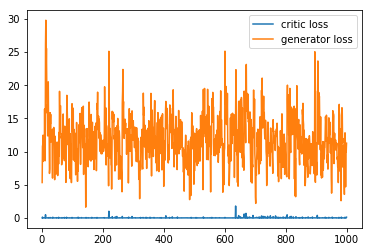

 36%|███▋      | 34499/94950 [1:51:01<3:14:33,  5.18it/s]

step: 34500, D: 0.00850117, G: 10.4464


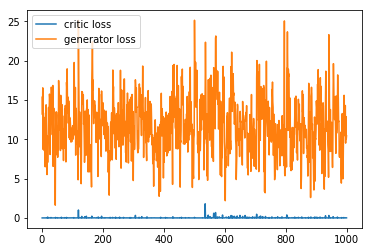

 36%|███▋      | 34599/94950 [1:51:21<3:14:14,  5.18it/s]

step: 34600, D: 6.54465e-05, G: 6.72398


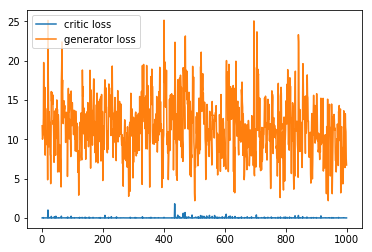

 37%|███▋      | 34699/94950 [1:51:40<3:13:54,  5.18it/s]

step: 34700, D: 0.000233821, G: 8.04509


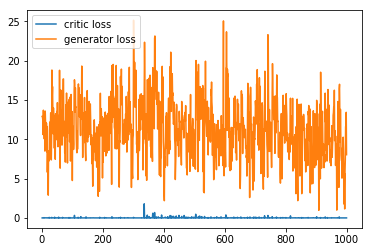

 37%|███▋      | 34799/94950 [1:51:59<3:13:35,  5.18it/s]

step: 34800, D: 0.000268428, G: 12.4203


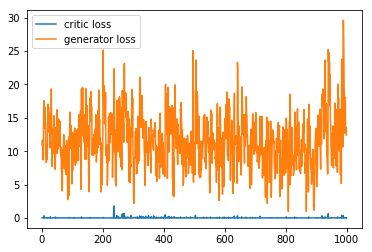

 37%|███▋      | 34899/94950 [1:52:19<3:13:16,  5.18it/s]

step: 34900, D: 4.03038e-05, G: 13.1136


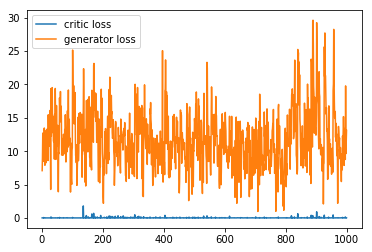

 37%|███▋      | 34999/94950 [1:52:38<3:12:56,  5.18it/s]

step: 35000, D: 9.38029e-08, G: 16.1553


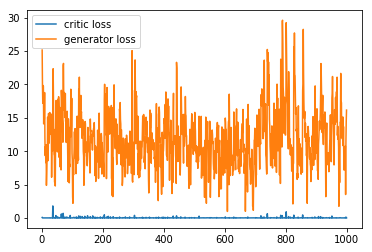

 37%|███▋      | 35099/94950 [1:52:57<3:12:37,  5.18it/s]

step: 35100, D: 1.71739e-06, G: 9.2304


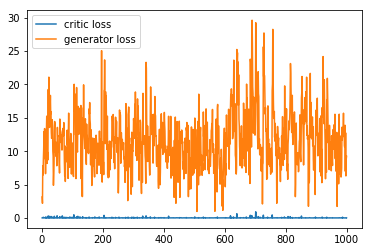

 37%|███▋      | 35199/94950 [1:53:17<3:12:18,  5.18it/s]

step: 35200, D: 0.0056788, G: 16.2558


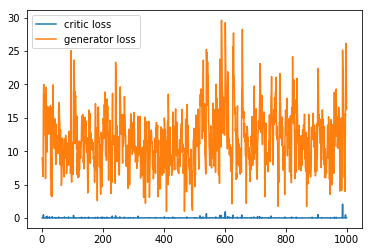

 37%|███▋      | 35299/94950 [1:53:36<3:11:58,  5.18it/s]

step: 35300, D: 0.165346, G: 17.4357


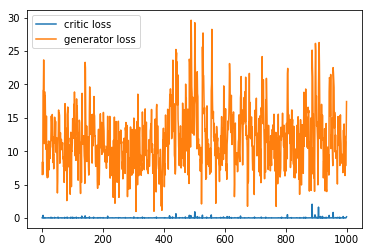

 37%|███▋      | 35399/94950 [1:53:55<3:11:39,  5.18it/s]

step: 35400, D: 0.000447136, G: 13.5725


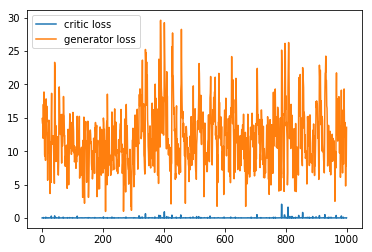

 37%|███▋      | 35499/94950 [1:54:15<3:11:20,  5.18it/s]

step: 35500, D: 0.0830608, G: 14.7899


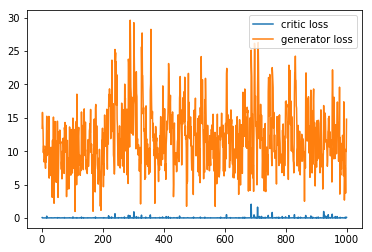

 37%|███▋      | 35599/94950 [1:54:34<3:11:01,  5.18it/s]

step: 35600, D: 0.0906181, G: 16.4389


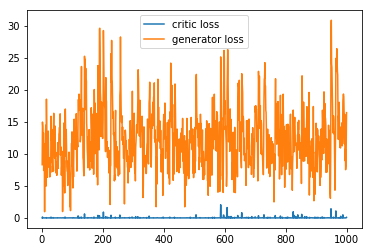

 38%|███▊      | 35699/94950 [1:54:54<3:10:42,  5.18it/s]

step: 35700, D: 2.01702e-05, G: 10.2323


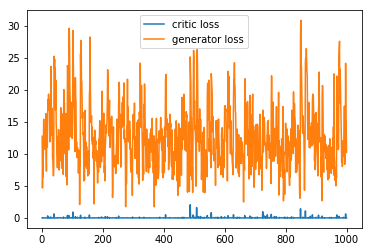

 38%|███▊      | 35799/94950 [1:55:13<3:10:22,  5.18it/s]

step: 35800, D: 0.00117413, G: 9.34085


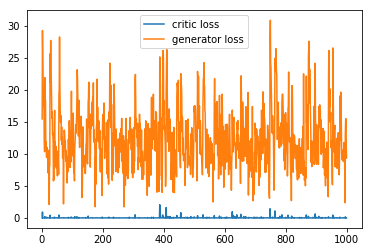

 38%|███▊      | 35899/94950 [1:55:32<3:10:03,  5.18it/s]

step: 35900, D: 0.00121336, G: 8.27614


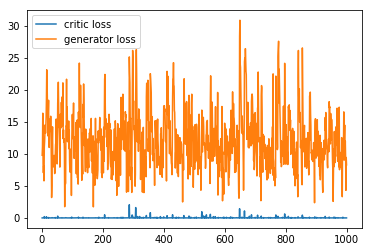

 38%|███▊      | 35999/94950 [1:55:51<3:09:44,  5.18it/s]

step: 36000, D: 0.000675087, G: 8.36808


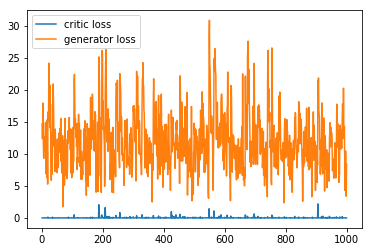

 38%|███▊      | 36099/94950 [1:56:11<3:09:25,  5.18it/s]

step: 36100, D: 0.0114403, G: 9.88503


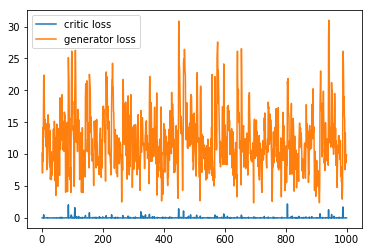

 38%|███▊      | 36199/94950 [1:56:30<3:09:05,  5.18it/s]

step: 36200, D: 0.00126584, G: 6.86301


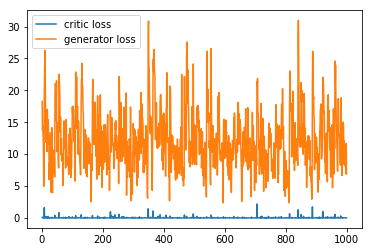

 38%|███▊      | 36299/94950 [1:56:50<3:08:46,  5.18it/s]

step: 36300, D: 0.107731, G: 10.5908


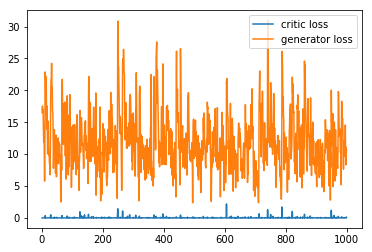

 38%|███▊      | 36399/94950 [1:57:09<3:08:27,  5.18it/s]

step: 36400, D: 0.000186714, G: 10.0967


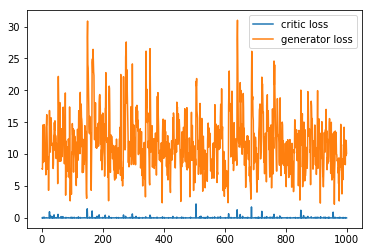

 38%|███▊      | 36499/94950 [1:57:28<3:08:07,  5.18it/s]

step: 36500, D: 0.00284925, G: 2.23753


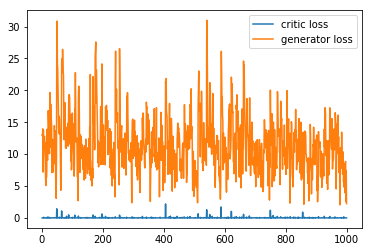

 39%|███▊      | 36599/94950 [1:57:47<3:07:48,  5.18it/s]

step: 36600, D: 0.210276, G: 13.8725


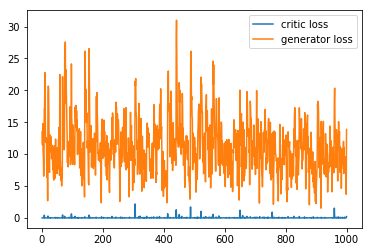

 39%|███▊      | 36699/94950 [1:58:07<3:07:29,  5.18it/s]

step: 36700, D: 0.0644882, G: 9.48567


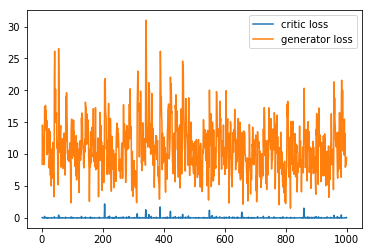

 39%|███▉      | 37299/94950 [2:00:03<3:05:33,  5.18it/s]

step: 37300, D: 5.27145e-05, G: 9.74921


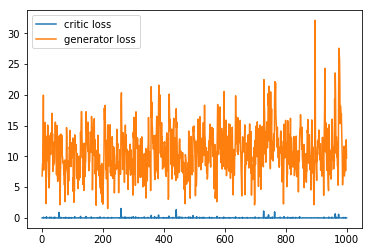

 39%|███▉      | 37399/94950 [2:00:22<3:05:14,  5.18it/s]

step: 37400, D: 0.00258377, G: 10.6316


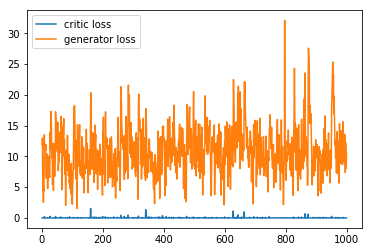

 39%|███▉      | 37499/94950 [2:00:41<3:04:54,  5.18it/s]

step: 37500, D: 0.0172922, G: 7.88142


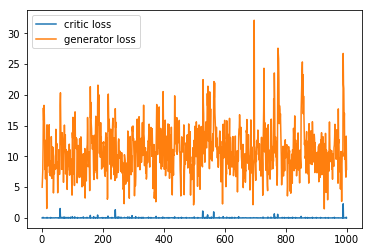

 40%|███▉      | 37599/94950 [2:01:00<3:04:35,  5.18it/s]

step: 37600, D: 0.0182379, G: 9.1411


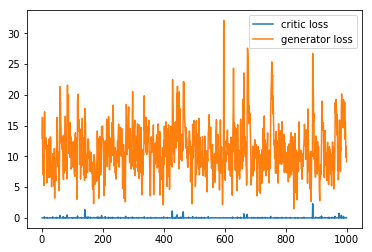

 40%|███▉      | 37699/94950 [2:01:20<3:04:16,  5.18it/s]

step: 37700, D: 0.00138329, G: 7.85942


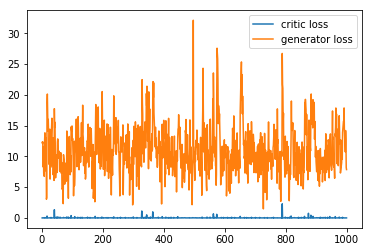

 40%|███▉      | 37799/94950 [2:01:39<3:03:56,  5.18it/s]

step: 37800, D: 0.00855661, G: 10.4359


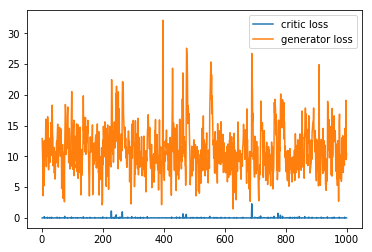

 40%|███▉      | 37899/94950 [2:01:58<3:03:37,  5.18it/s]

step: 37900, D: 8.54578e-05, G: 10.9828


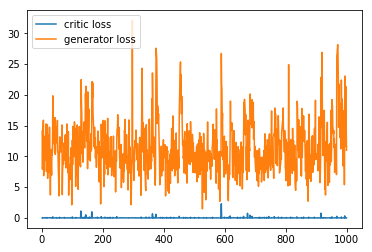

 40%|████      | 37999/94950 [2:02:17<3:03:17,  5.18it/s]

step: 38000, D: 0.00370598, G: 9.75961


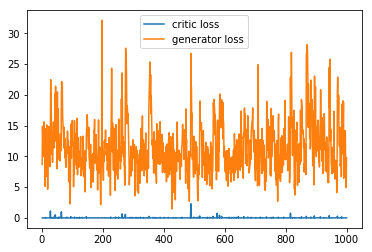

 40%|████      | 38099/94950 [2:02:37<3:02:58,  5.18it/s]

step: 38100, D: 0.0184119, G: 10.9365


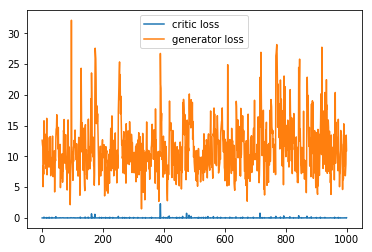

 40%|████      | 38199/94950 [2:02:56<3:02:38,  5.18it/s]

step: 38200, D: 0.000335862, G: 2.01033


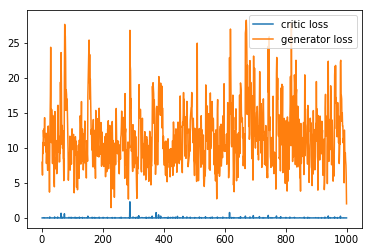

 40%|████      | 38299/94950 [2:03:15<3:02:19,  5.18it/s]

step: 38300, D: 1.47121e-06, G: 18.4528


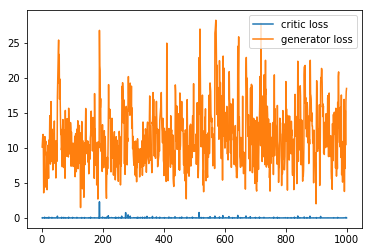

 40%|████      | 38399/94950 [2:03:34<3:02:00,  5.18it/s]

step: 38400, D: 0.000149132, G: 16.9851


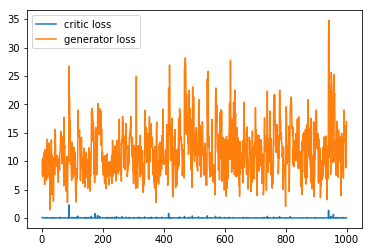

 41%|████      | 38499/94950 [2:03:54<3:01:40,  5.18it/s]

step: 38500, D: 6.12512e-05, G: 13.091


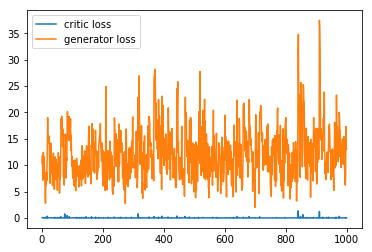

 41%|████      | 38599/94950 [2:04:13<3:01:20,  5.18it/s]

step: 38600, D: 1.16445e-05, G: 7.33879


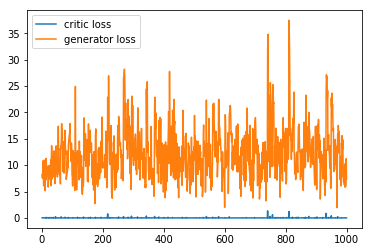

 41%|████      | 38699/94950 [2:04:32<3:01:01,  5.18it/s]

step: 38700, D: 1.14105e-05, G: 13.9336


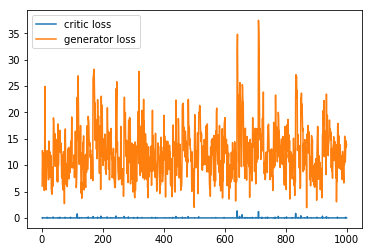

 41%|████      | 38799/94950 [2:04:51<3:00:42,  5.18it/s]

step: 38800, D: 0.00296011, G: 13.5251


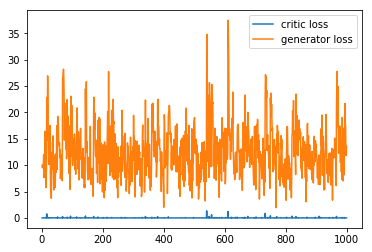

 41%|████      | 38899/94950 [2:05:11<3:00:22,  5.18it/s]

step: 38900, D: 4.45729e-05, G: 10.8424


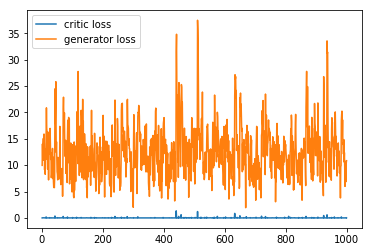

 41%|████      | 38999/94950 [2:05:30<3:00:03,  5.18it/s]

step: 39000, D: 6.48117e-07, G: 19.2541


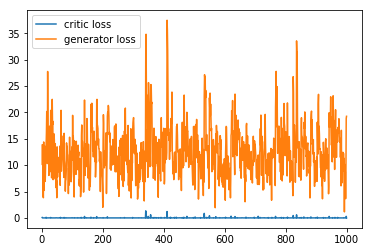

 41%|████      | 39099/94950 [2:05:49<2:59:44,  5.18it/s]

step: 39100, D: 1.50669e-05, G: 20.8691


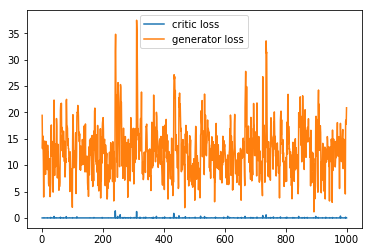

 41%|████▏     | 39199/94950 [2:06:08<2:59:24,  5.18it/s]

step: 39200, D: 3.87857e-07, G: 18.6082


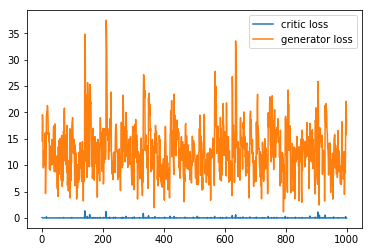

 41%|████▏     | 39299/94950 [2:06:27<2:59:05,  5.18it/s]

step: 39300, D: 0.0600802, G: 10.7156


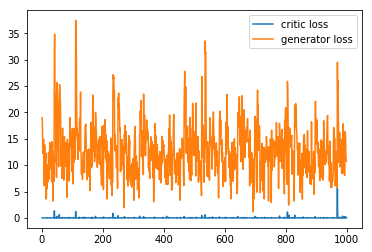

 41%|████▏     | 39399/94950 [2:06:47<2:58:45,  5.18it/s]

step: 39400, D: 0.00299605, G: 5.06335


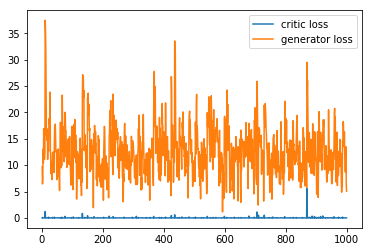

 42%|████▏     | 39499/94950 [2:07:06<2:58:26,  5.18it/s]

step: 39500, D: 0.0157792, G: 16.5613


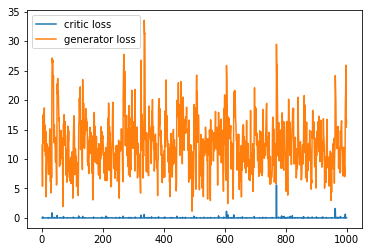

 42%|████▏     | 39599/94950 [2:07:25<2:58:07,  5.18it/s]

step: 39600, D: 0.00122644, G: 12.2864


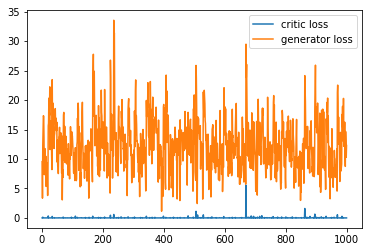

 42%|████▏     | 39699/94950 [2:07:45<2:57:47,  5.18it/s]

step: 39700, D: 0.346183, G: 16.0243


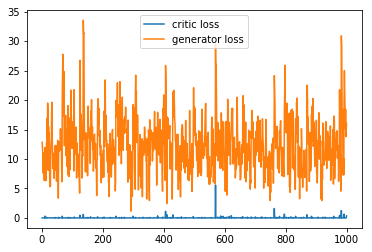

 42%|████▏     | 39799/94950 [2:08:04<2:57:28,  5.18it/s]

step: 39800, D: 1.3036e-05, G: 9.54984


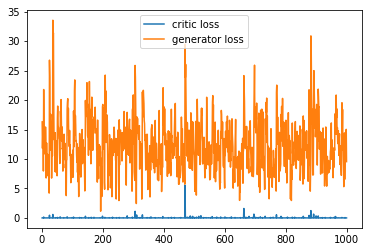

 42%|████▏     | 39899/94950 [2:08:23<2:57:09,  5.18it/s]

step: 39900, D: 8.27928e-06, G: 9.85031


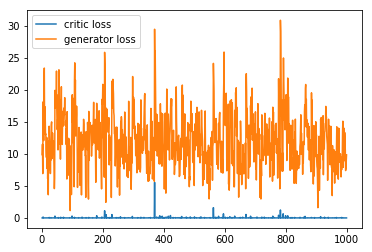

 42%|████▏     | 39999/94950 [2:08:43<2:56:50,  5.18it/s]

step: 40000, D: 1.24344e-06, G: 15.3461


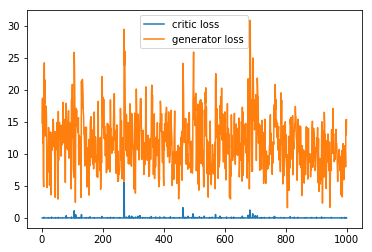

 42%|████▏     | 40099/94950 [2:09:02<2:56:30,  5.18it/s]

step: 40100, D: 0.00087257, G: 11.1244


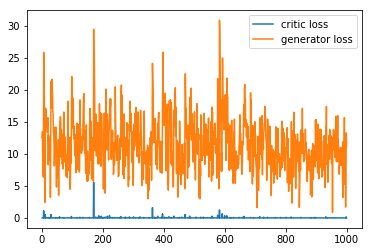

 42%|████▏     | 40199/94950 [2:09:21<2:56:11,  5.18it/s]

step: 40200, D: 0.0734828, G: 14.8471


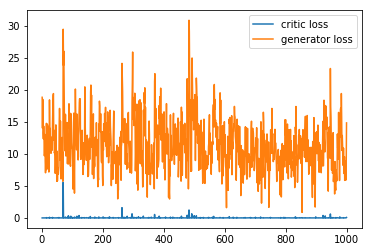

 42%|████▏     | 40299/94950 [2:09:40<2:55:51,  5.18it/s]

step: 40300, D: 1.92396e-05, G: 17.0377


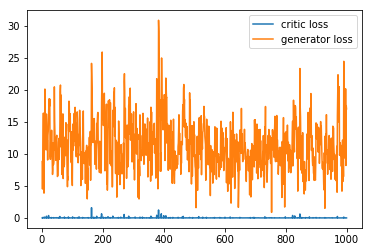

 43%|████▎     | 40399/94950 [2:09:59<2:55:32,  5.18it/s]

step: 40400, D: 7.05638e-05, G: 8.59664


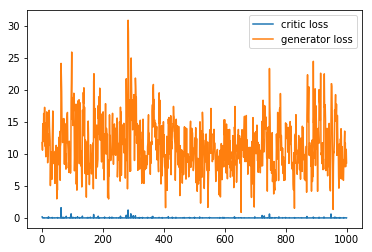

 43%|████▎     | 40499/94950 [2:10:19<2:55:13,  5.18it/s]

step: 40500, D: 5.67222e-11, G: 24.1704


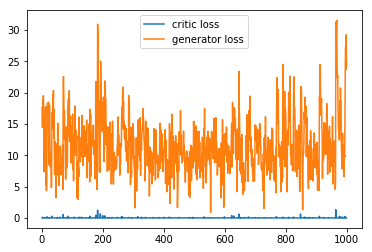

 43%|████▎     | 40599/94950 [2:10:38<2:54:53,  5.18it/s]

step: 40600, D: 0.000711491, G: 10.5041


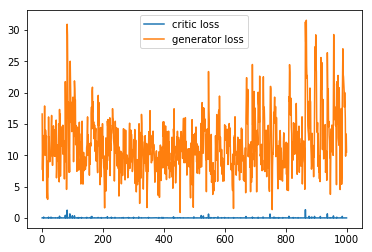

 43%|████▎     | 40699/94950 [2:10:57<2:54:34,  5.18it/s]

step: 40700, D: 1.5835e-07, G: 11.9308


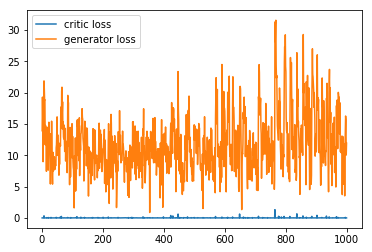

 43%|████▎     | 40799/94950 [2:11:17<2:54:15,  5.18it/s]

step: 40800, D: 0.102665, G: 22.5057


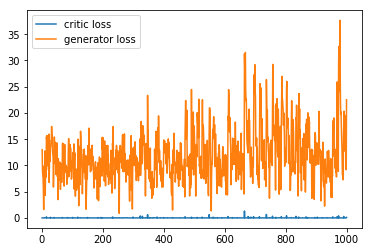

 43%|████▎     | 40899/94950 [2:11:36<2:53:56,  5.18it/s]

step: 40900, D: 0.00138467, G: 9.86309


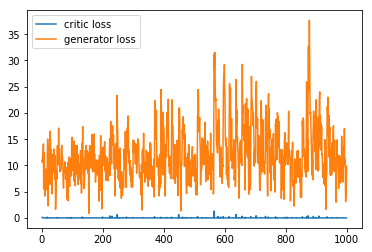

 43%|████▎     | 40999/94950 [2:11:56<2:53:36,  5.18it/s]

step: 41000, D: 0.000703022, G: 8.3699


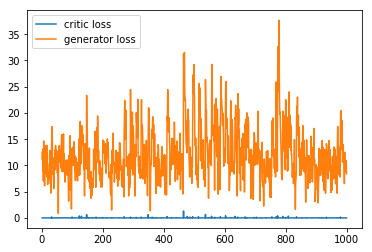

 43%|████▎     | 41099/94950 [2:12:15<2:53:17,  5.18it/s]

step: 41100, D: 5.05747e-05, G: 21.5408


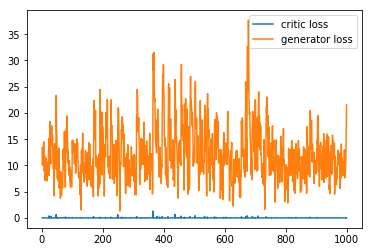

 43%|████▎     | 41199/94950 [2:12:34<2:52:58,  5.18it/s]

step: 41200, D: 0.000808544, G: 8.42122


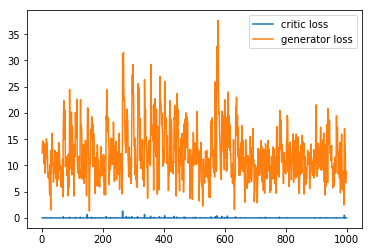

 43%|████▎     | 41299/94950 [2:12:53<2:52:38,  5.18it/s]

step: 41300, D: 0.00138854, G: 7.18354


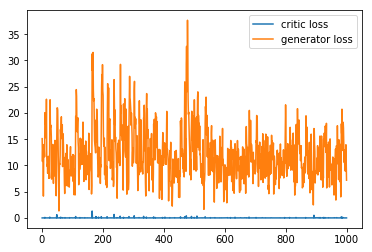

 44%|████▎     | 41399/94950 [2:13:13<2:52:19,  5.18it/s]

step: 41400, D: 0.000750552, G: 8.56417


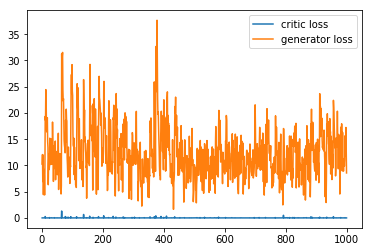

 44%|████▎     | 41499/94950 [2:13:32<2:52:00,  5.18it/s]

step: 41500, D: 5.86763e-05, G: 15.8335


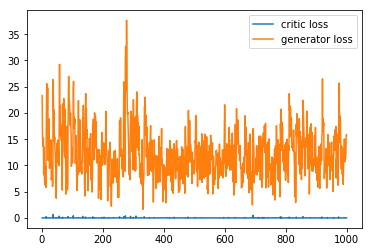

 44%|████▍     | 41599/94950 [2:13:52<2:51:41,  5.18it/s]

step: 41600, D: 0.00224426, G: 9.31412


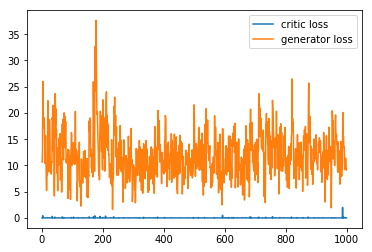

 44%|████▍     | 41699/94950 [2:14:11<2:51:21,  5.18it/s]

step: 41700, D: 0.000734811, G: 12.0687


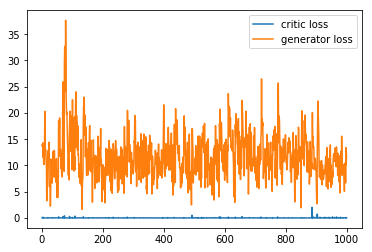

 44%|████▍     | 41799/94950 [2:14:30<2:51:02,  5.18it/s]

step: 41800, D: 4.48406e-05, G: 7.53416


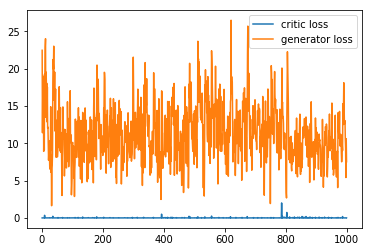

 44%|████▍     | 41899/94950 [2:14:50<2:50:43,  5.18it/s]

step: 41900, D: 0.039316, G: 9.63309


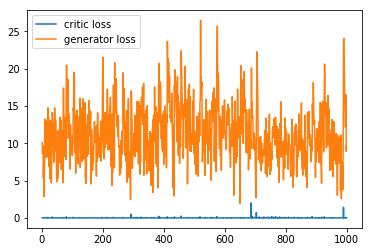

 44%|████▍     | 41999/94950 [2:15:09<2:50:23,  5.18it/s]

step: 42000, D: 0.000236677, G: 13.4539


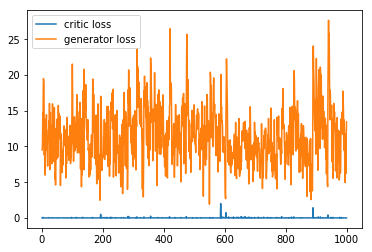

 44%|████▍     | 42099/94950 [2:15:28<2:50:04,  5.18it/s]

step: 42100, D: 0.00146792, G: 12.0358


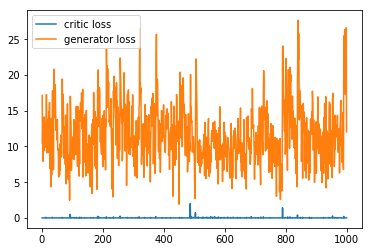

 44%|████▍     | 42199/94950 [2:15:47<2:49:45,  5.18it/s]

step: 42200, D: 0.0127613, G: 9.30634


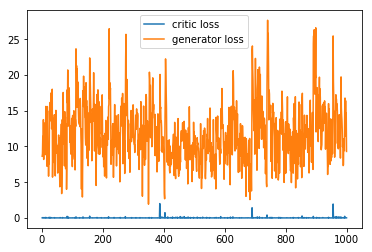

 45%|████▍     | 42299/94950 [2:16:07<2:49:25,  5.18it/s]

step: 42300, D: 3.06334e-07, G: 18.9098


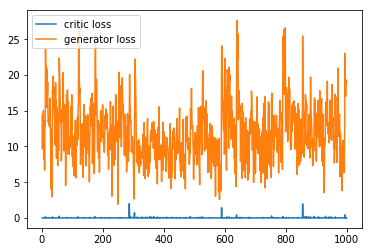

 45%|████▍     | 42399/94950 [2:16:26<2:49:06,  5.18it/s]

step: 42400, D: 0.000255127, G: 15.0413


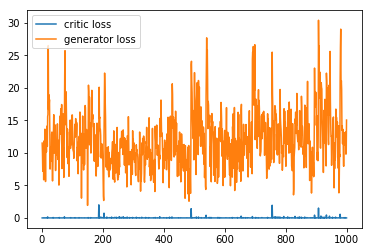

 45%|████▍     | 42499/94950 [2:16:45<2:48:47,  5.18it/s]

step: 42500, D: 6.38172e-05, G: 16.3419


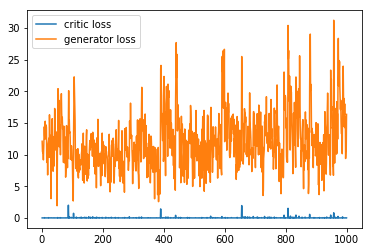

 45%|████▍     | 42599/94950 [2:17:05<2:48:28,  5.18it/s]

step: 42600, D: 1.03271e-06, G: 20.1701


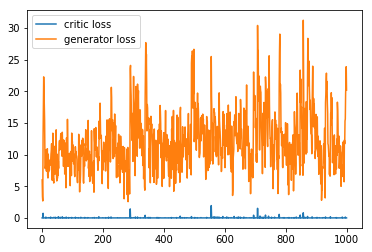

 45%|████▍     | 42699/94950 [2:17:24<2:48:08,  5.18it/s]

step: 42700, D: 3.21519e-06, G: 16.9418


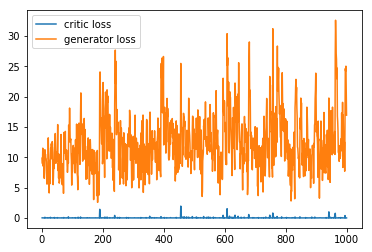

 45%|████▌     | 42799/94950 [2:17:43<2:47:49,  5.18it/s]

step: 42800, D: 0.0203629, G: 8.16911


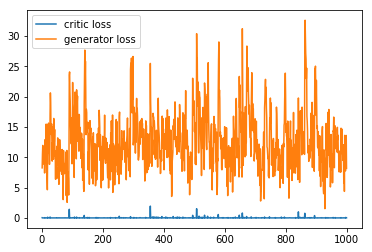

 45%|████▌     | 42899/94950 [2:18:02<2:47:30,  5.18it/s]

step: 42900, D: 0.000682801, G: 1.79471


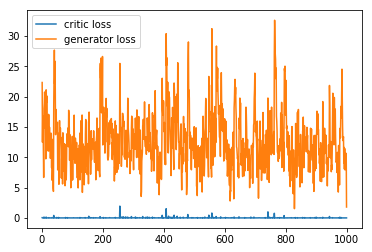

 45%|████▌     | 42999/94950 [2:18:22<2:47:11,  5.18it/s]

step: 43000, D: 0.000113474, G: 12.1173


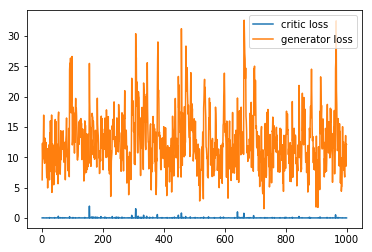

 45%|████▌     | 43099/94950 [2:18:41<2:46:51,  5.18it/s]

step: 43100, D: 4.27422e-05, G: 8.65617


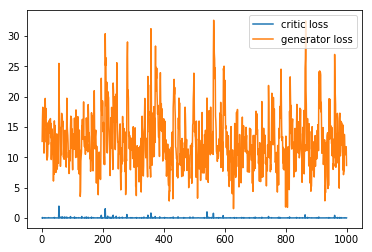

 45%|████▌     | 43199/94950 [2:19:01<2:46:32,  5.18it/s]

step: 43200, D: 0.0101367, G: 11.1699


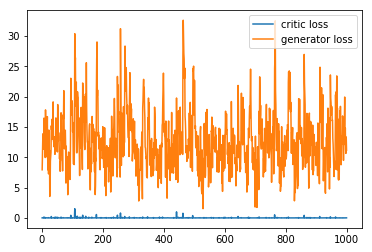

 46%|████▌     | 43299/94950 [2:19:20<2:46:13,  5.18it/s]

step: 43300, D: 1.06558e-05, G: 16.1892


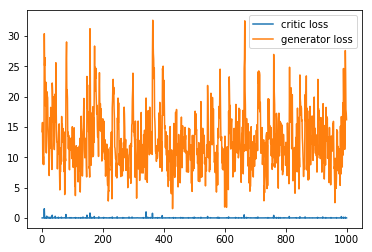

 46%|████▌     | 43399/94950 [2:19:39<2:45:53,  5.18it/s]

step: 43400, D: 0.000593715, G: 10.7605


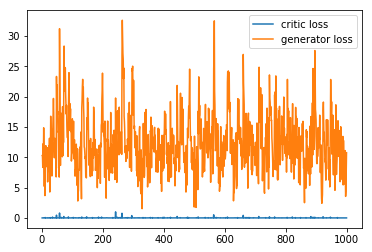

 46%|████▌     | 43499/94950 [2:19:59<2:45:34,  5.18it/s]

step: 43500, D: 0.000362775, G: 10.0608


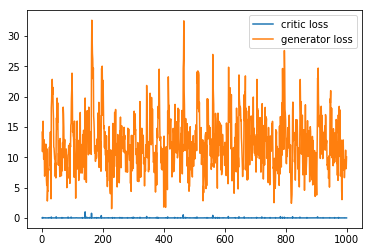

 46%|████▌     | 43599/94950 [2:20:18<2:45:15,  5.18it/s]

step: 43600, D: 1.07954e-09, G: 26.7105


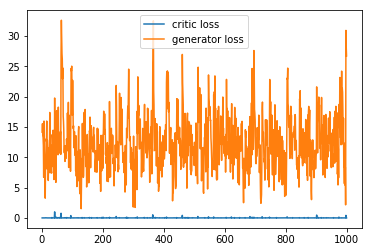

 46%|████▌     | 43699/94950 [2:20:37<2:44:56,  5.18it/s]

step: 43700, D: 0.0146318, G: 14.9268


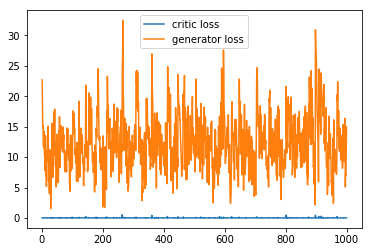

 46%|████▌     | 43799/94950 [2:20:57<2:44:36,  5.18it/s]

step: 43800, D: 0.000545944, G: 10.6181


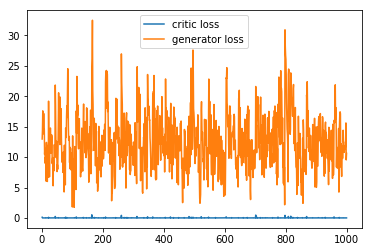

 46%|████▌     | 43899/94950 [2:21:16<2:44:17,  5.18it/s]

step: 43900, D: 0.000655188, G: 14.5676


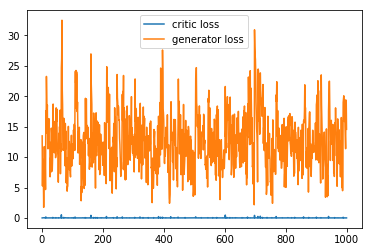

 46%|████▋     | 43999/94950 [2:21:36<2:43:58,  5.18it/s]

step: 44000, D: 0.000127912, G: 12.9554


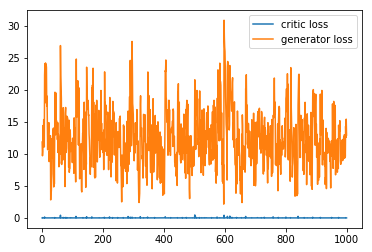

 46%|████▋     | 44099/94950 [2:21:55<2:43:39,  5.18it/s]

step: 44100, D: 1.94386e-05, G: 10.7818


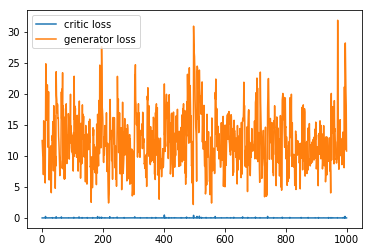

 47%|████▋     | 44199/94950 [2:22:14<2:43:19,  5.18it/s]

step: 44200, D: 4.7309e-05, G: 14.2913


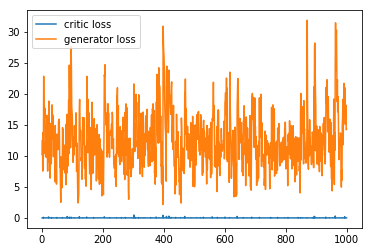

 47%|████▋     | 44299/94950 [2:22:33<2:43:00,  5.18it/s]

step: 44300, D: 2.14568e-06, G: 20.2247


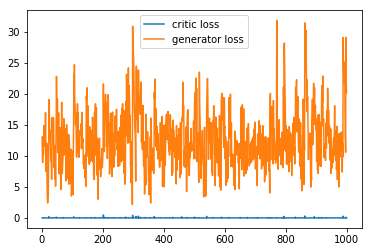

 47%|████▋     | 44399/94950 [2:22:52<2:42:40,  5.18it/s]

step: 44400, D: 0.0564662, G: 7.93973


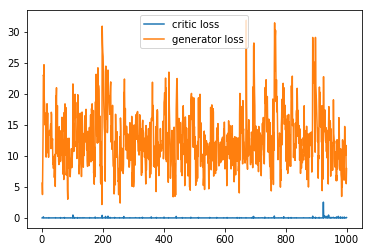

 47%|████▋     | 44499/94950 [2:23:12<2:42:21,  5.18it/s]

step: 44500, D: 0.000174008, G: 9.70911


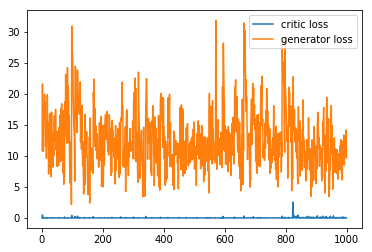

 47%|████▋     | 44599/94950 [2:23:31<2:42:02,  5.18it/s]

step: 44600, D: 0.000723786, G: 13.0913


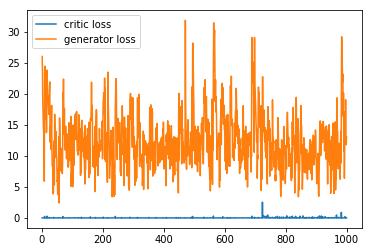

 47%|████▋     | 44699/94950 [2:23:50<2:41:42,  5.18it/s]

step: 44700, D: 1.07859e-05, G: 10.7453


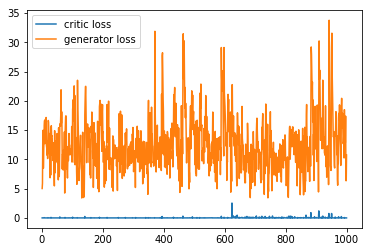

 47%|████▋     | 44799/94950 [2:24:09<2:41:23,  5.18it/s]

step: 44800, D: 1.581e-08, G: 24.9739


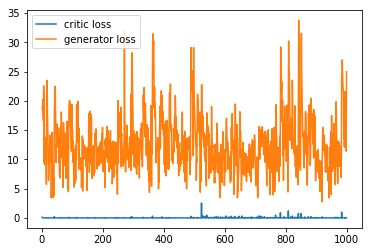

 47%|████▋     | 44899/94950 [2:24:29<2:41:03,  5.18it/s]

step: 44900, D: 2.92394e-07, G: 22.7426


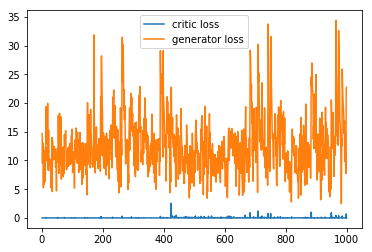

 47%|████▋     | 44999/94950 [2:24:48<2:40:44,  5.18it/s]

step: 45000, D: 2.22156e-06, G: 10.1075


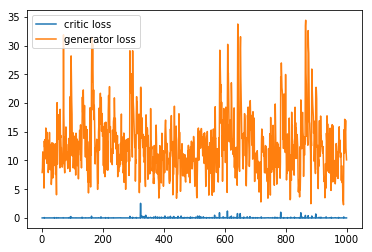

 47%|████▋     | 45099/94950 [2:25:07<2:40:25,  5.18it/s]

step: 45100, D: 0.000222917, G: 10.4124


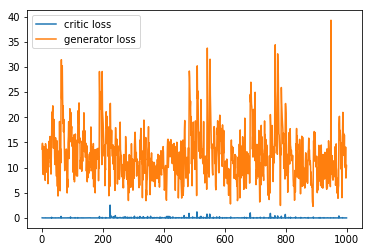

 48%|████▊     | 45199/94950 [2:25:26<2:40:05,  5.18it/s]

step: 45200, D: 0.00148539, G: 7.23188


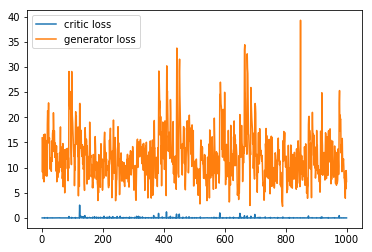

 48%|████▊     | 45299/94950 [2:25:46<2:39:46,  5.18it/s]

step: 45300, D: 0.000453593, G: 11.0068


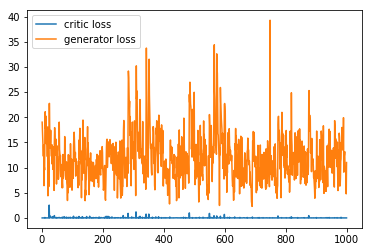

 48%|████▊     | 45399/94950 [2:26:05<2:39:27,  5.18it/s]

step: 45400, D: 0.00162768, G: 7.70249


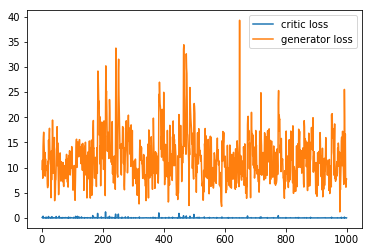

 48%|████▊     | 45499/94950 [2:26:24<2:39:07,  5.18it/s]

step: 45500, D: 0.000324375, G: 11.9532


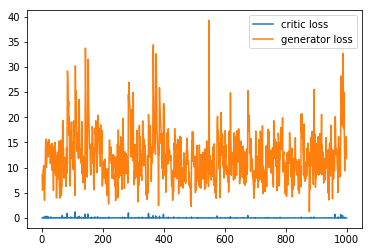

 48%|████▊     | 45599/94950 [2:26:43<2:38:48,  5.18it/s]

step: 45600, D: 1.24946e-05, G: 7.09072


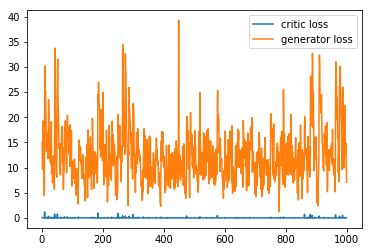

 48%|████▊     | 45699/94950 [2:27:02<2:38:28,  5.18it/s]

step: 45700, D: 3.22244e-06, G: 5.73787


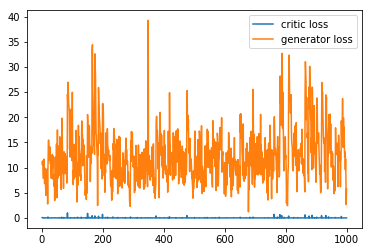

 48%|████▊     | 45799/94950 [2:27:22<2:38:09,  5.18it/s]

step: 45800, D: 0.0123522, G: 5.71451


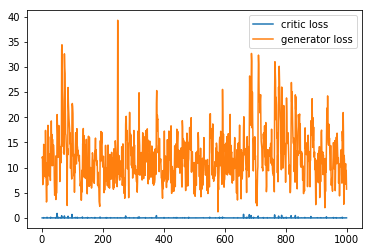

 48%|████▊     | 45899/94950 [2:27:41<2:37:49,  5.18it/s]

step: 45900, D: 1.19498e-07, G: 26.7758


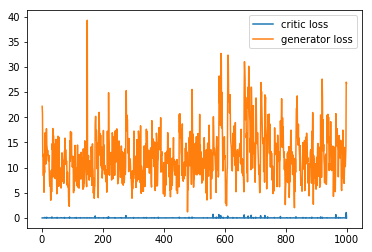

 48%|████▊     | 45999/94950 [2:28:00<2:37:30,  5.18it/s]

step: 46000, D: 3.05117e-06, G: 9.63008


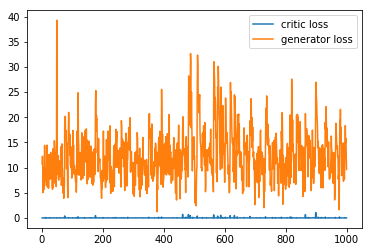

 49%|████▊     | 46099/94950 [2:28:20<2:37:11,  5.18it/s]

step: 46100, D: 2.20024e-05, G: 9.39522


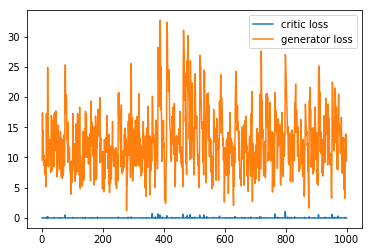

 49%|████▊     | 46199/94950 [2:28:39<2:36:52,  5.18it/s]

step: 46200, D: 1.61081e-06, G: 17.7421


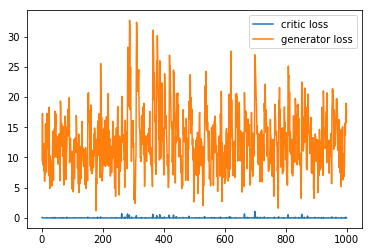

 49%|████▉     | 46299/94950 [2:28:58<2:36:32,  5.18it/s]

step: 46300, D: 0.00130182, G: 14.0923


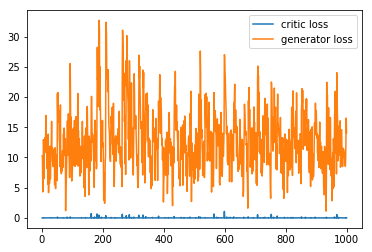

 49%|████▉     | 46399/94950 [2:29:18<2:36:13,  5.18it/s]

step: 46400, D: 2.39087e-05, G: 18.1459


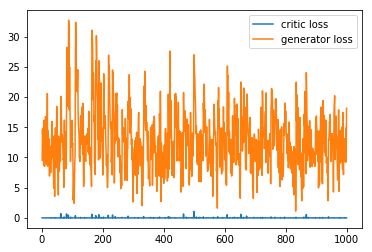

 49%|████▉     | 46499/94950 [2:29:37<2:35:54,  5.18it/s]

step: 46500, D: 1.75414e-06, G: 16.8477


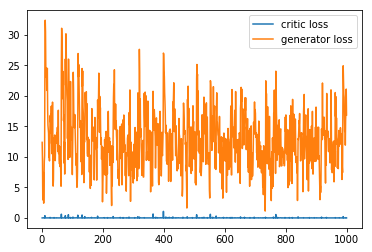

 49%|████▉     | 46599/94950 [2:29:56<2:35:34,  5.18it/s]

step: 46600, D: 0.00560325, G: 12.3346


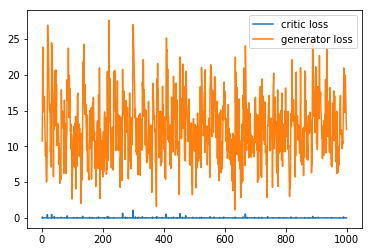

 49%|████▉     | 46699/94950 [2:30:15<2:35:15,  5.18it/s]

step: 46700, D: 5.53478e-07, G: 22.2962


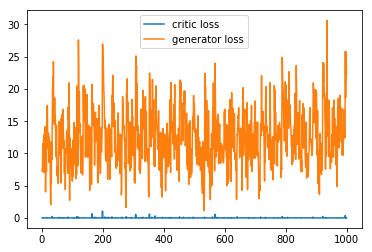

 49%|████▉     | 46799/94950 [2:30:35<2:34:56,  5.18it/s]

step: 46800, D: 5.00025e-05, G: 12.3497


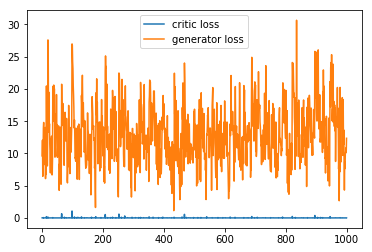

 49%|████▉     | 46899/94950 [2:30:54<2:34:36,  5.18it/s]

step: 46900, D: 0.000974866, G: 11.2765


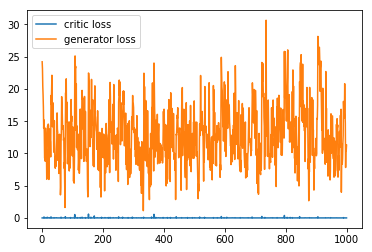

 49%|████▉     | 46999/94950 [2:31:13<2:34:17,  5.18it/s]

step: 47000, D: 2.77232e-08, G: 16.555


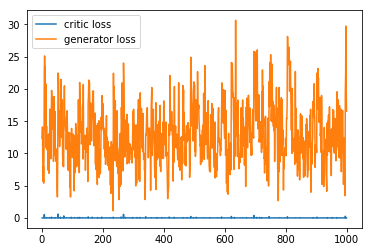

 50%|████▉     | 47099/94950 [2:31:32<2:33:57,  5.18it/s]

step: 47100, D: 1.81644e-07, G: 22.3178


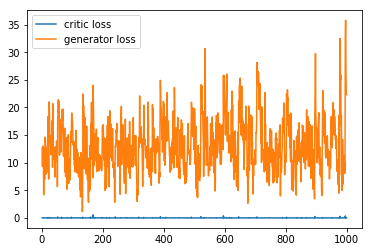

 50%|████▉     | 47199/94950 [2:31:52<2:33:38,  5.18it/s]

step: 47200, D: 7.63378e-09, G: 19.9172


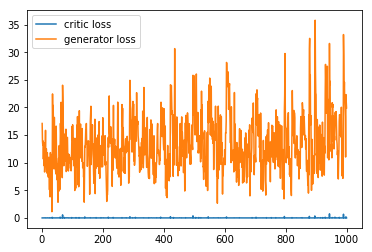

 50%|████▉     | 47299/94950 [2:32:11<2:33:19,  5.18it/s]

step: 47300, D: 0.00114274, G: 6.93834


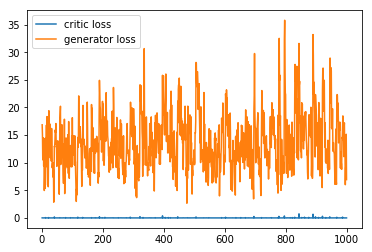

 50%|████▉     | 47399/94950 [2:32:30<2:33:00,  5.18it/s]

step: 47400, D: 4.64929e-05, G: 12.8667


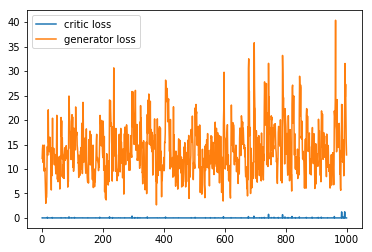

 50%|█████     | 47499/94950 [2:32:50<2:32:40,  5.18it/s]

step: 47500, D: 0.0149178, G: 9.71622


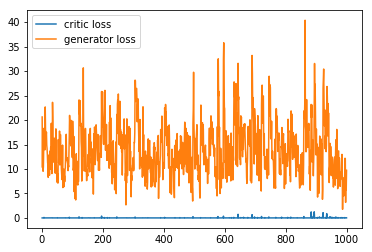

 50%|█████     | 47599/94950 [2:33:09<2:32:21,  5.18it/s]

step: 47600, D: 0.148629, G: 19.7853


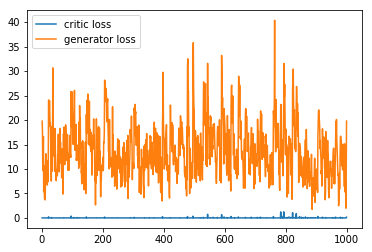

 50%|█████     | 47699/94950 [2:33:28<2:32:02,  5.18it/s]

step: 47700, D: 1.77345e-05, G: 14.7851


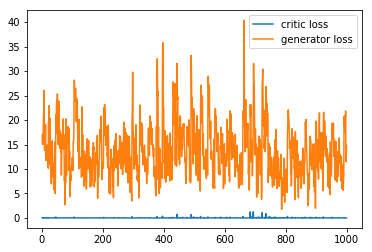

 50%|█████     | 47799/94950 [2:33:47<2:31:42,  5.18it/s]

step: 47800, D: 0.126744, G: 11.1315


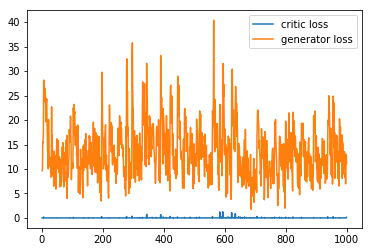

 50%|█████     | 47899/94950 [2:34:07<2:31:23,  5.18it/s]

step: 47900, D: 4.05027e-05, G: 6.5873


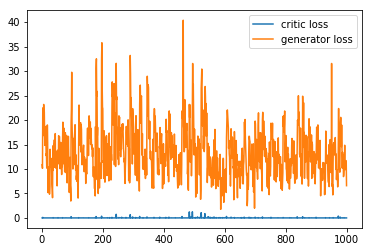

 51%|█████     | 47999/94950 [2:34:26<2:31:04,  5.18it/s]

step: 48000, D: 0.000777513, G: 14.5369


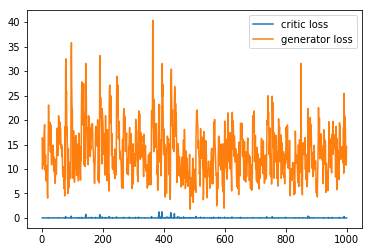

 51%|█████     | 48099/94950 [2:34:45<2:30:44,  5.18it/s]

step: 48100, D: 2.3071e-07, G: 10.067


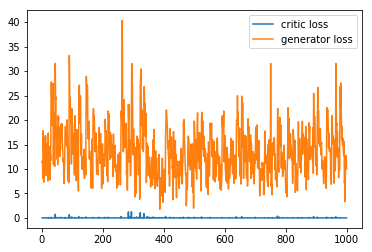

 51%|█████     | 48199/94950 [2:35:05<2:30:25,  5.18it/s]

step: 48200, D: 2.49427e-05, G: 19.6931


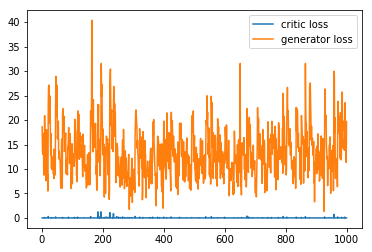

 51%|█████     | 48299/94950 [2:35:24<2:30:06,  5.18it/s]

step: 48300, D: 0.00094803, G: 15.4893


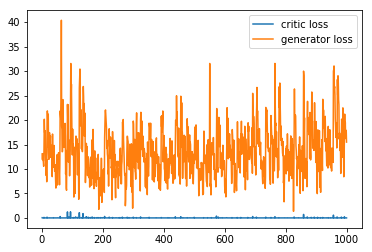

 51%|█████     | 48399/94950 [2:35:44<2:29:47,  5.18it/s]

step: 48400, D: 0.000219216, G: 14.0865


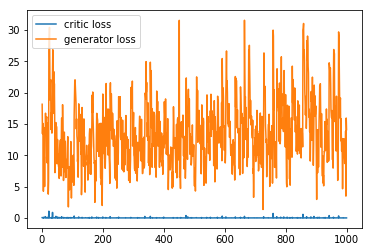

 51%|█████     | 48499/94950 [2:36:03<2:29:28,  5.18it/s]

step: 48500, D: 0.000241152, G: 6.2706


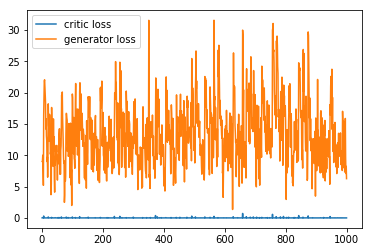

 51%|█████     | 48599/94950 [2:36:22<2:29:08,  5.18it/s]

step: 48600, D: 0.00508636, G: 5.50952


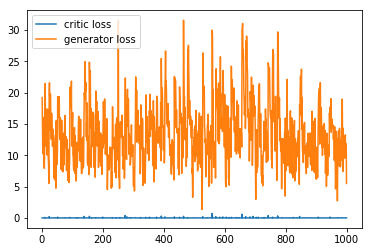

 51%|█████▏    | 48699/94950 [2:36:42<2:28:49,  5.18it/s]

step: 48700, D: 0.000870279, G: 11.4762


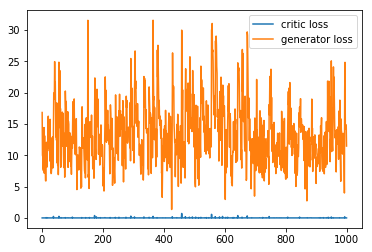

 51%|█████▏    | 48799/94950 [2:37:01<2:28:30,  5.18it/s]

step: 48800, D: 1.46313e-07, G: 12.3812


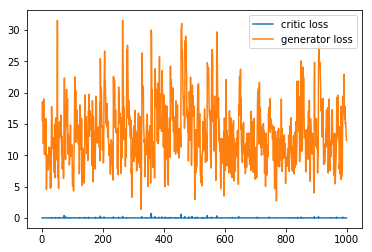

 51%|█████▏    | 48899/94950 [2:37:21<2:28:11,  5.18it/s]

step: 48900, D: 8.21926e-05, G: 10.9096


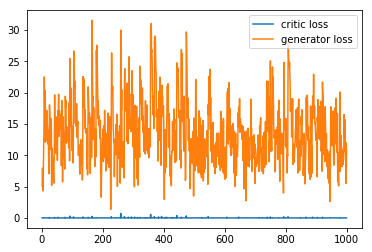

 52%|█████▏    | 48999/94950 [2:37:40<2:27:52,  5.18it/s]

step: 49000, D: 3.09317e-05, G: 9.71723


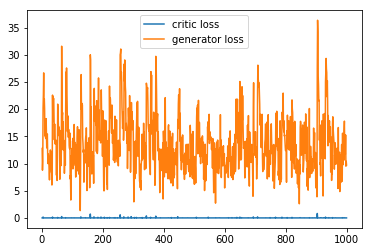

 52%|█████▏    | 49099/94950 [2:37:59<2:27:32,  5.18it/s]

step: 49100, D: 1.0707e-07, G: 16.4369


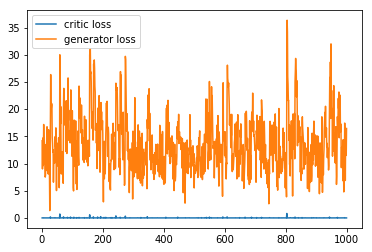

 52%|█████▏    | 49199/94950 [2:38:19<2:27:13,  5.18it/s]

step: 49200, D: 0.478543, G: 26.0518


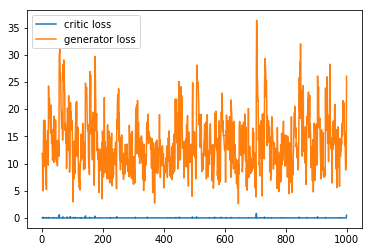

 52%|█████▏    | 49299/94950 [2:38:38<2:26:54,  5.18it/s]

step: 49300, D: 0.181545, G: 25.5112


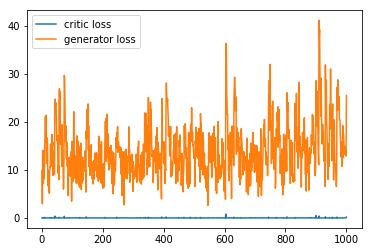

 52%|█████▏    | 49399/94950 [2:38:57<2:26:34,  5.18it/s]

step: 49400, D: 4.17449e-10, G: 23.9388


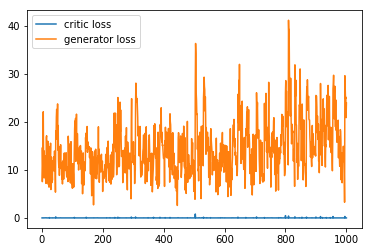

 52%|█████▏    | 49499/94950 [2:39:16<2:26:15,  5.18it/s]

step: 49500, D: 0.0013179, G: 14.9595


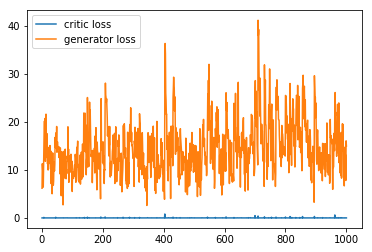

 52%|█████▏    | 49599/94950 [2:39:36<2:25:56,  5.18it/s]

step: 49600, D: 0.000161128, G: 14.2516


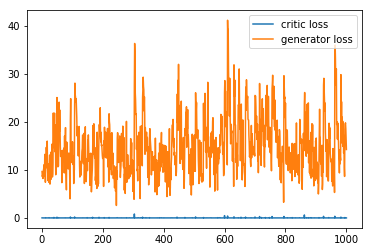

 52%|█████▏    | 49699/94950 [2:39:55<2:25:36,  5.18it/s]

step: 49700, D: 3.34212e-05, G: 17.9193


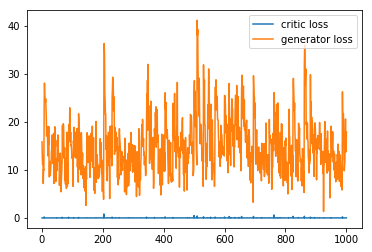

 52%|█████▏    | 49799/94950 [2:40:14<2:25:17,  5.18it/s]

step: 49800, D: 9.80999e-05, G: 8.89784


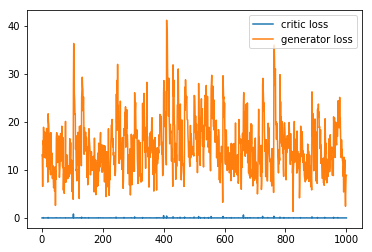

 53%|█████▎    | 49899/94950 [2:40:33<2:24:57,  5.18it/s]

step: 49900, D: 3.54842e-05, G: 8.91226


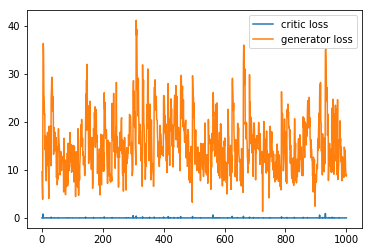

 53%|█████▎    | 49999/94950 [2:40:53<2:24:38,  5.18it/s]

step: 50000, D: 0.138159, G: 17.5912


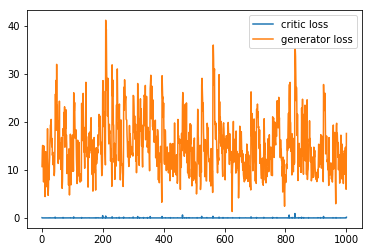

 53%|█████▎    | 50099/94950 [2:41:13<2:24:19,  5.18it/s]

step: 50100, D: 3.58959e-05, G: 11.238


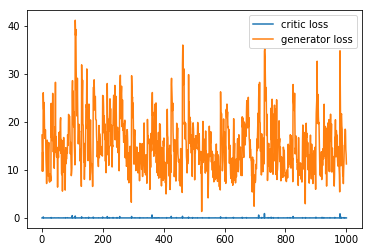

 53%|█████▎    | 50199/94950 [2:41:32<2:24:00,  5.18it/s]

step: 50200, D: 0.15948, G: 14.2136


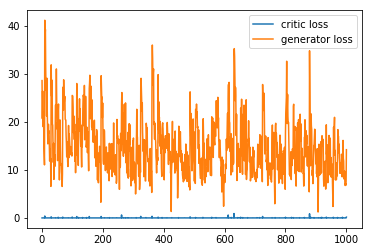

 53%|█████▎    | 50299/94950 [2:41:51<2:23:41,  5.18it/s]

step: 50300, D: 0.00238166, G: 6.31137


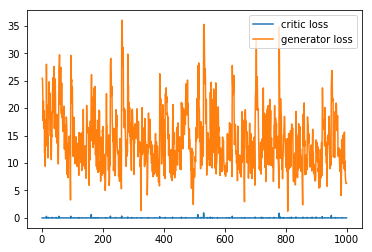

 53%|█████▎    | 50399/94950 [2:42:11<2:23:21,  5.18it/s]

step: 50400, D: 0.0521711, G: 13.113


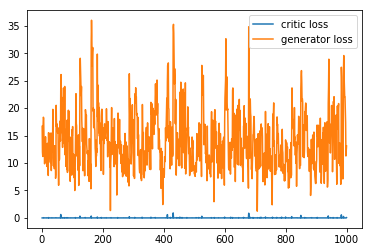

 53%|█████▎    | 50499/94950 [2:42:30<2:23:02,  5.18it/s]

step: 50500, D: 2.21297e-07, G: 10.0043


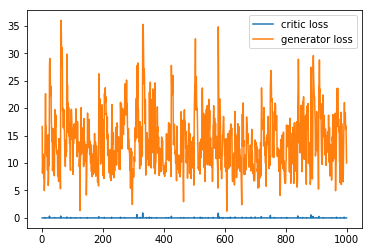

 53%|█████▎    | 50599/94950 [2:42:49<2:22:43,  5.18it/s]

step: 50600, D: 1.38148e-06, G: 13.9823


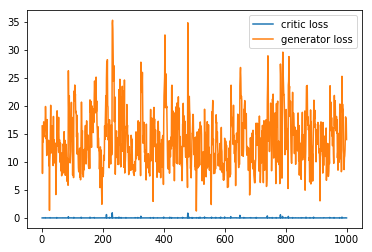

 53%|█████▎    | 50699/94950 [2:43:09<2:22:24,  5.18it/s]

step: 50700, D: 2.17587e-05, G: 10.5649


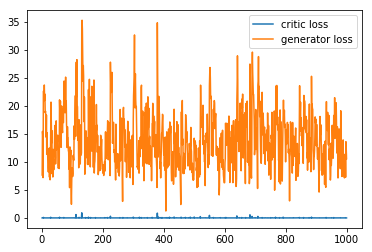

 54%|█████▎    | 50799/94950 [2:43:28<2:22:04,  5.18it/s]

step: 50800, D: 4.52854e-08, G: 21.4712


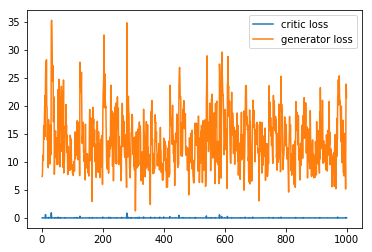

 54%|█████▎    | 50899/94950 [2:43:47<2:21:45,  5.18it/s]

step: 50900, D: 4.46005e-05, G: 15.6601


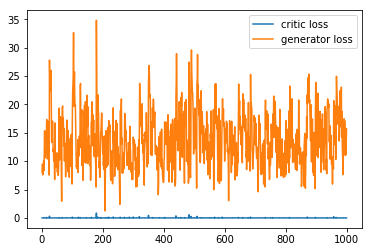

 54%|█████▎    | 50999/94950 [2:44:06<2:21:26,  5.18it/s]

step: 51000, D: 6.52624e-06, G: 7.909


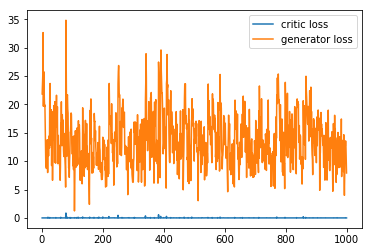

 54%|█████▍    | 51099/94950 [2:44:26<2:21:06,  5.18it/s]

step: 51100, D: 4.763e-07, G: 20.6181


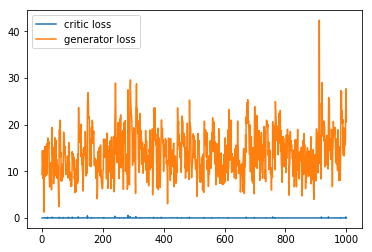

 54%|█████▍    | 51199/94950 [2:44:45<2:20:47,  5.18it/s]

step: 51200, D: 9.65462e-09, G: 23.5041


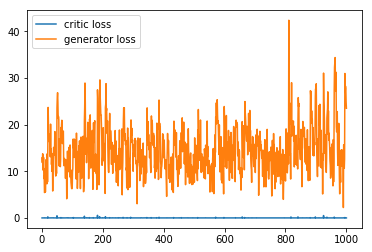

 54%|█████▍    | 51299/94950 [2:45:04<2:20:27,  5.18it/s]

step: 51300, D: 2.74296e-09, G: 19.7582


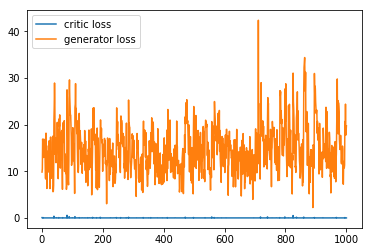

 54%|█████▍    | 51399/94950 [2:45:23<2:20:08,  5.18it/s]

step: 51400, D: 8.42653e-06, G: 8.83797


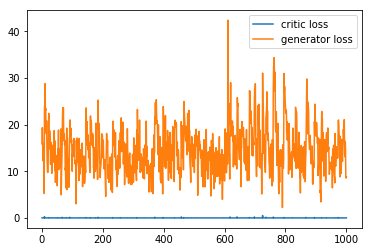

 54%|█████▍    | 51499/94950 [2:45:43<2:19:49,  5.18it/s]

step: 51500, D: 1.39105e-05, G: 20.3427


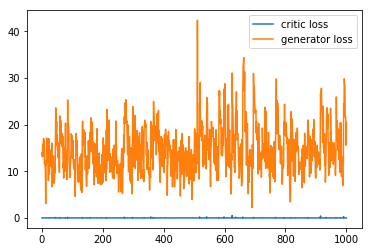

 54%|█████▍    | 51599/94950 [2:46:02<2:19:29,  5.18it/s]

step: 51600, D: 2.63832e-06, G: 22.897


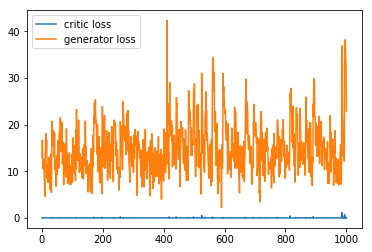

 54%|█████▍    | 51699/94950 [2:46:21<2:19:10,  5.18it/s]

step: 51700, D: 4.91162e-05, G: 11.4473


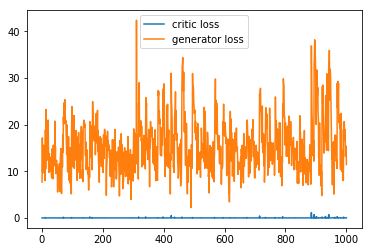

 55%|█████▍    | 51799/94950 [2:46:41<2:18:51,  5.18it/s]

step: 51800, D: 5.28877e-05, G: 10.2709


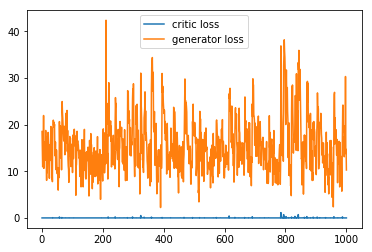

 55%|█████▍    | 51899/94950 [2:47:00<2:18:31,  5.18it/s]

step: 51900, D: 1.43179e-07, G: 24.7198


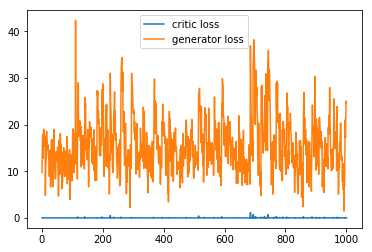

 55%|█████▍    | 51999/94950 [2:47:19<2:18:12,  5.18it/s]

step: 52000, D: 8.30341e-10, G: 26.9668


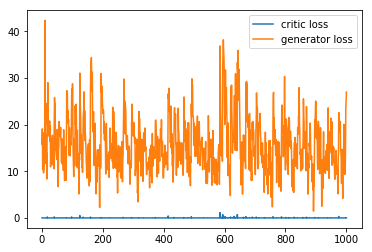

 55%|█████▍    | 52099/94950 [2:47:38<2:17:53,  5.18it/s]

step: 52100, D: 6.10009e-05, G: 18.5521


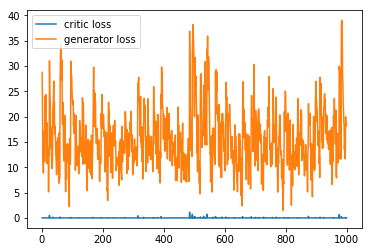

 55%|█████▍    | 52199/94950 [2:47:58<2:17:33,  5.18it/s]

step: 52200, D: 4.18131e-07, G: 7.47637


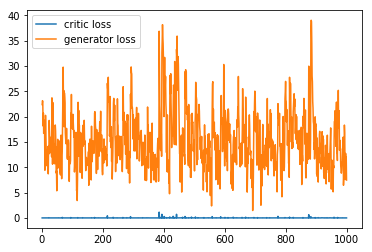

 55%|█████▌    | 52299/94950 [2:48:17<2:17:14,  5.18it/s]

step: 52300, D: 4.00842e-06, G: 10.6525


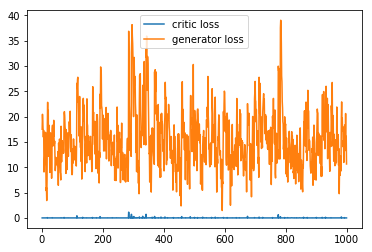

 55%|█████▌    | 52399/94950 [2:48:36<2:16:55,  5.18it/s]

step: 52400, D: 0.000145093, G: 11.533


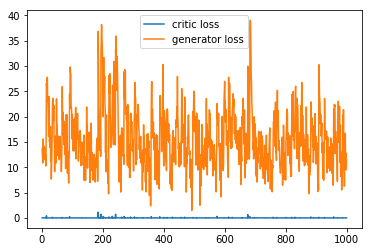

 55%|█████▌    | 52499/94950 [2:48:56<2:16:36,  5.18it/s]

step: 52500, D: 0.00020135, G: 9.65628


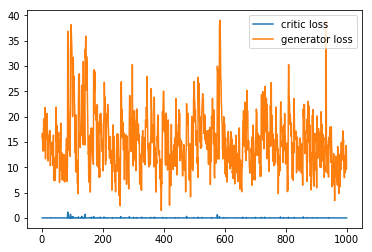

 55%|█████▌    | 52599/94950 [2:49:15<2:16:16,  5.18it/s]

step: 52600, D: 5.16371e-05, G: 12.6062


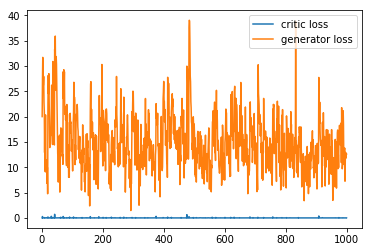

 56%|█████▌    | 52699/94950 [2:49:34<2:15:57,  5.18it/s]

step: 52700, D: 3.282e-06, G: 15.2248


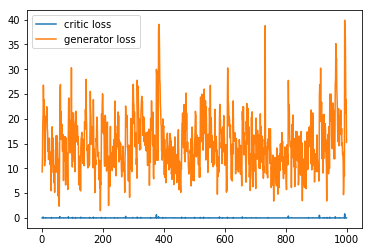

 56%|█████▌    | 52799/94950 [2:49:54<2:15:38,  5.18it/s]

step: 52800, D: 8.96016e-07, G: 15.6834


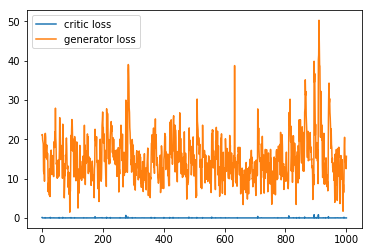

 56%|█████▌    | 52899/94950 [2:50:13<2:15:18,  5.18it/s]

step: 52900, D: 4.29625e-06, G: 10.1356


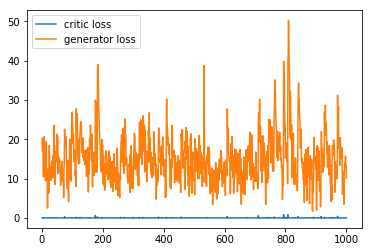

 56%|█████▌    | 52999/94950 [2:50:32<2:14:59,  5.18it/s]

step: 53000, D: 0.00208327, G: 8.6202


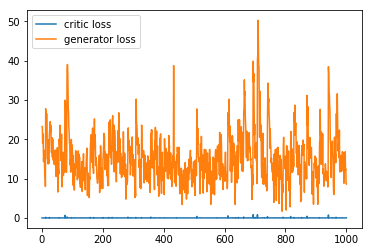

 56%|█████▌    | 53099/94950 [2:50:51<2:14:40,  5.18it/s]

step: 53100, D: 7.52866e-06, G: 16.5054


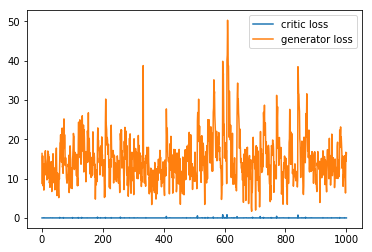

 56%|█████▌    | 53199/94950 [2:51:10<2:14:20,  5.18it/s]

step: 53200, D: 3.01828e-06, G: 16.4096


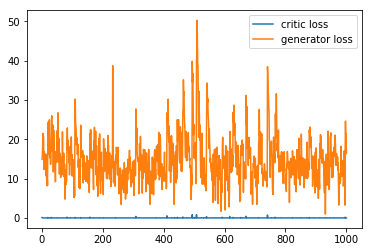

 56%|█████▌    | 53299/94950 [2:51:30<2:14:01,  5.18it/s]

step: 53300, D: 0.000642943, G: 19.5066


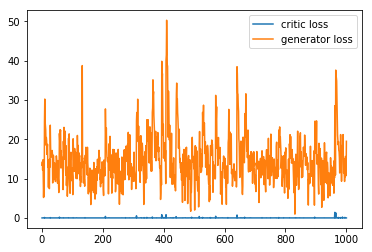

 56%|█████▌    | 53399/94950 [2:51:49<2:13:42,  5.18it/s]

step: 53400, D: 0.000273207, G: 8.91268


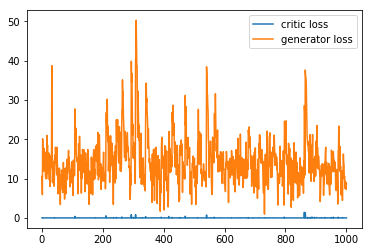

 56%|█████▋    | 53499/94950 [2:52:08<2:13:22,  5.18it/s]

step: 53500, D: 0.122499, G: 14.2629


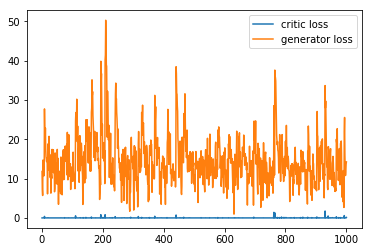

 56%|█████▋    | 53599/94950 [2:52:27<2:13:03,  5.18it/s]

step: 53600, D: 1.60035e-08, G: 23.6464


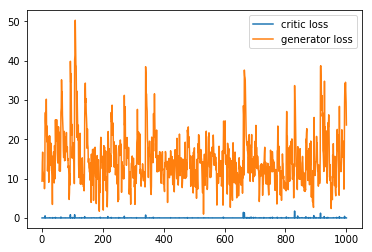

 57%|█████▋    | 53699/94950 [2:52:47<2:12:44,  5.18it/s]

step: 53700, D: 0.000178317, G: 16.5973


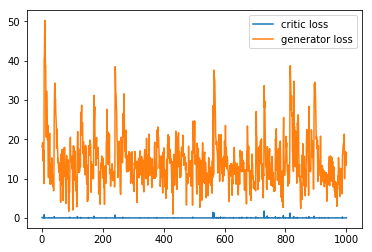

 57%|█████▋    | 53799/94950 [2:53:06<2:12:24,  5.18it/s]

step: 53800, D: 0.00109432, G: 9.67479


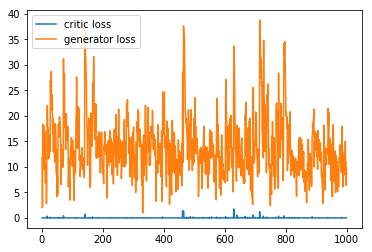

 57%|█████▋    | 53899/94950 [2:53:25<2:12:05,  5.18it/s]

step: 53900, D: 0.000852591, G: 11.0081


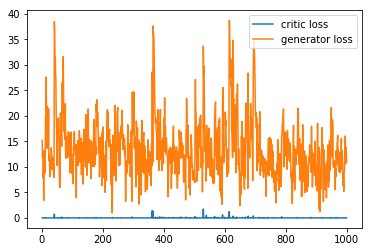

 57%|█████▋    | 53999/94950 [2:53:45<2:11:45,  5.18it/s]

step: 54000, D: 9.43185e-05, G: 13.0835


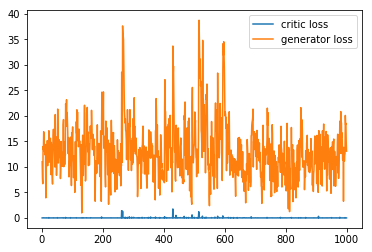

 57%|█████▋    | 54099/94950 [2:54:04<2:11:26,  5.18it/s]

step: 54100, D: 4.27546e-07, G: 18.9847


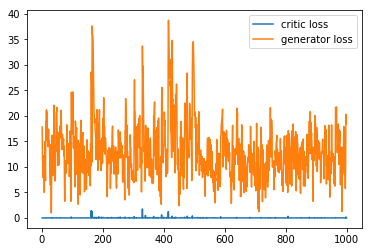

 57%|█████▋    | 54199/94950 [2:54:23<2:11:07,  5.18it/s]

step: 54200, D: 1.55e-06, G: 8.31493


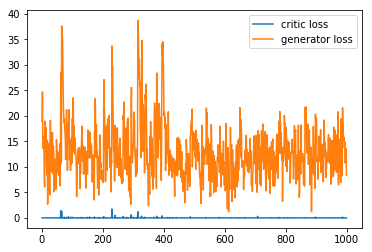

 57%|█████▋    | 54299/94950 [2:54:42<2:10:47,  5.18it/s]

step: 54300, D: 0.000169652, G: 5.02927


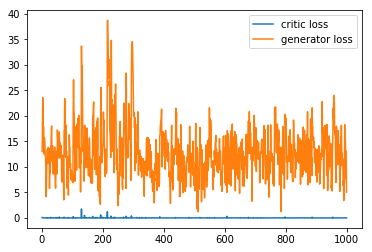

 57%|█████▋    | 54399/94950 [2:55:02<2:10:28,  5.18it/s]

step: 54400, D: 0.147664, G: 15.0937


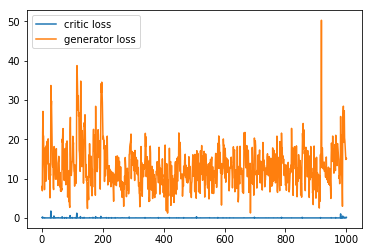

 57%|█████▋    | 54499/94950 [2:55:21<2:10:09,  5.18it/s]

step: 54500, D: 0.00648147, G: 7.26885


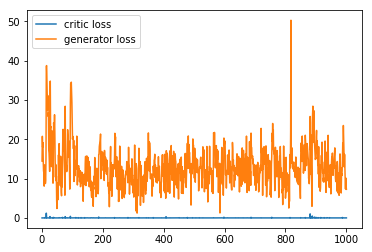

 58%|█████▊    | 54599/94950 [2:55:40<2:09:50,  5.18it/s]

step: 54600, D: 0.000200829, G: 9.31979


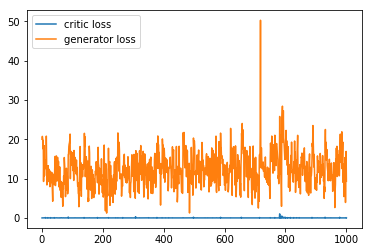

 58%|█████▊    | 54699/94950 [2:56:00<2:09:30,  5.18it/s]

step: 54700, D: 1.17182e-07, G: 18.6341


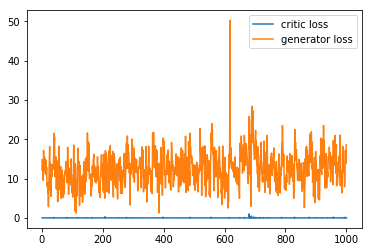

 58%|█████▊    | 54799/94950 [2:56:19<2:09:11,  5.18it/s]

step: 54800, D: 1.27003e-05, G: 13.9822


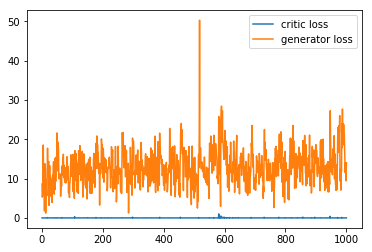

 58%|█████▊    | 54899/94950 [2:56:38<2:08:52,  5.18it/s]

step: 54900, D: 0.129484, G: 20.7623


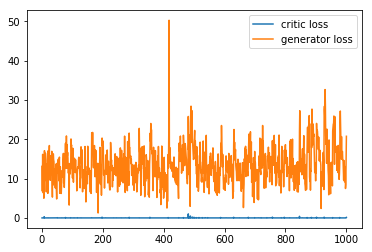

 58%|█████▊    | 54999/94950 [2:56:58<2:08:32,  5.18it/s]

step: 55000, D: 3.40333e-10, G: 27.0063


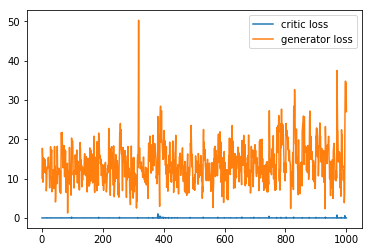

 58%|█████▊    | 55099/94950 [2:57:17<2:08:13,  5.18it/s]

step: 55100, D: 0.000107265, G: 18.9534


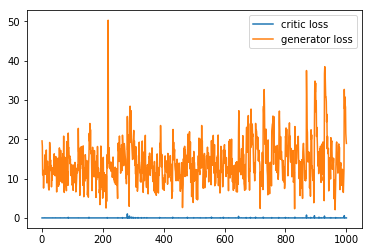

 58%|█████▊    | 55199/94950 [2:57:36<2:07:54,  5.18it/s]

step: 55200, D: 1.43988e-08, G: 25.5124


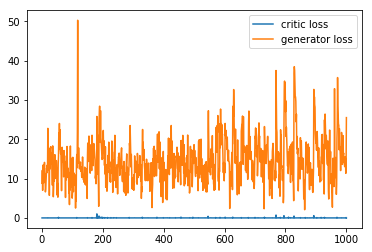

 58%|█████▊    | 55299/94950 [2:57:55<2:07:34,  5.18it/s]

step: 55300, D: 2.09686e-07, G: 15.9622


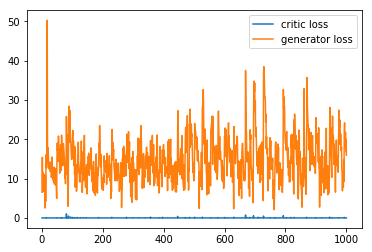

 58%|█████▊    | 55399/94950 [2:58:15<2:07:15,  5.18it/s]

step: 55400, D: 1.164e-06, G: 16.6876


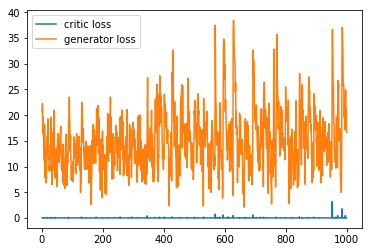

 58%|█████▊    | 55499/94950 [2:58:34<2:06:56,  5.18it/s]

step: 55500, D: 3.73822e-06, G: 25.6615


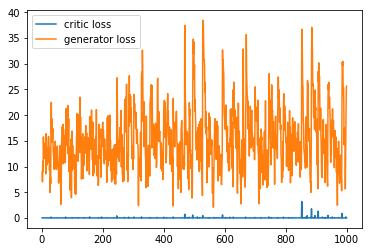

 59%|█████▊    | 55599/94950 [2:58:54<2:06:37,  5.18it/s]

step: 55600, D: 0.00204582, G: 7.58432


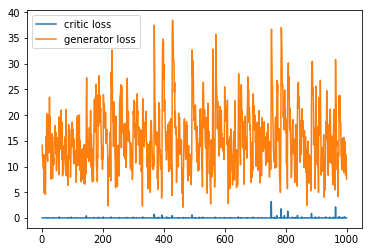

 59%|█████▊    | 55699/94950 [2:59:13<2:06:17,  5.18it/s]

step: 55700, D: 4.18532e-05, G: 10.4859


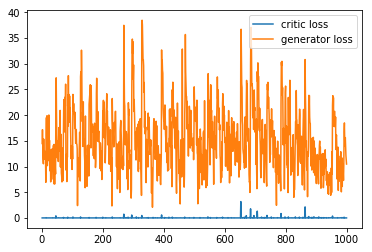

 59%|█████▉    | 55799/94950 [2:59:32<2:05:58,  5.18it/s]

step: 55800, D: 5.61021e-06, G: 8.72561


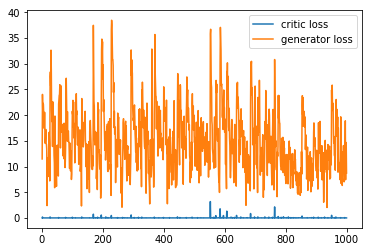

 59%|█████▉    | 55899/94950 [2:59:51<2:05:39,  5.18it/s]

step: 55900, D: 2.49485e-07, G: 17.3263


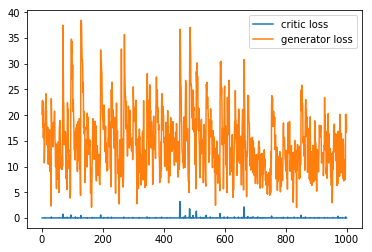

 59%|█████▉    | 55999/94950 [3:00:11<2:05:19,  5.18it/s]

step: 56000, D: 0.00131511, G: 10.3893


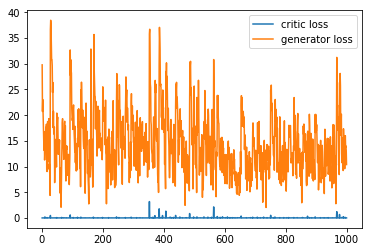

 59%|█████▉    | 56099/94950 [3:00:30<2:05:00,  5.18it/s]

step: 56100, D: 9.47146e-06, G: 10.5764


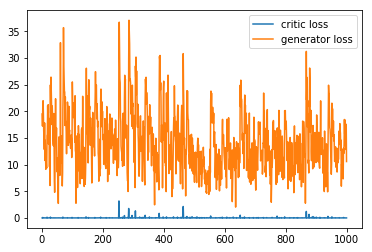

 59%|█████▉    | 56199/94950 [3:00:49<2:04:41,  5.18it/s]

step: 56200, D: 0.000322687, G: 15.8964


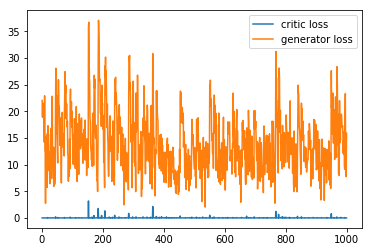

 59%|█████▉    | 56299/94950 [3:01:09<2:04:21,  5.18it/s]

step: 56300, D: 0.0677149, G: 12.8432


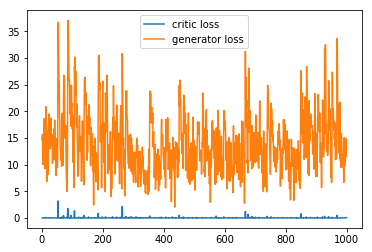

 59%|█████▉    | 56399/94950 [3:01:28<2:04:02,  5.18it/s]

step: 56400, D: 0.000112018, G: 11.4851


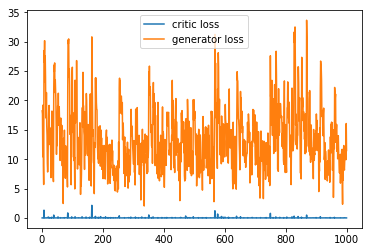

 60%|█████▉    | 56499/94950 [3:01:47<2:03:43,  5.18it/s]

step: 56500, D: 0.000126978, G: 11.0905


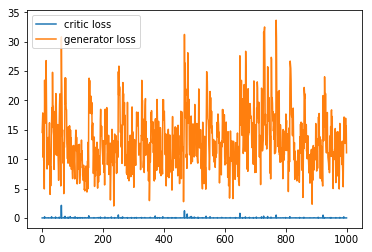

 60%|█████▉    | 56599/94950 [3:02:06<2:03:23,  5.18it/s]

step: 56600, D: 0.0281821, G: 14.6537


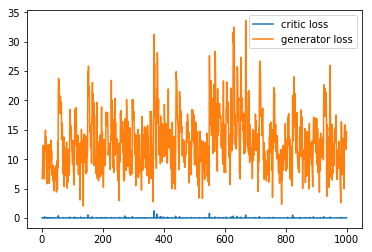

 60%|█████▉    | 56699/94950 [3:02:26<2:03:04,  5.18it/s]

step: 56700, D: 8.75685e-06, G: 12.6783


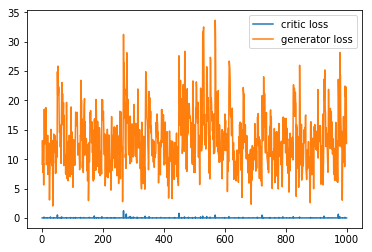

 60%|█████▉    | 56799/94950 [3:02:45<2:02:45,  5.18it/s]

step: 56800, D: 4.29266e-06, G: 13.4258


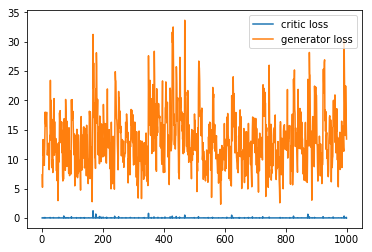

 60%|█████▉    | 56899/94950 [3:03:04<2:02:25,  5.18it/s]

step: 56900, D: 7.67277e-08, G: 12.768


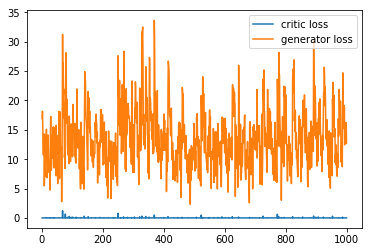

 60%|██████    | 56999/94950 [3:03:23<2:02:06,  5.18it/s]

step: 57000, D: 3.05716e-05, G: 21.8313


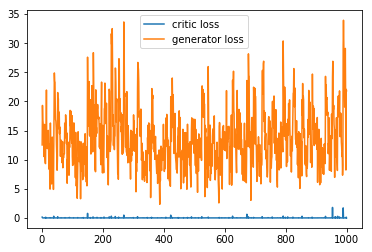

 60%|██████    | 57099/94950 [3:03:42<2:01:47,  5.18it/s]

step: 57100, D: 8.30417e-05, G: 16.4465


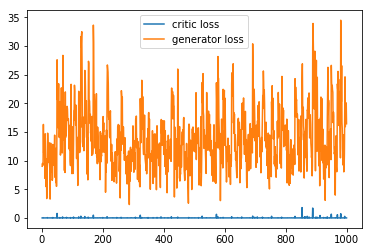

 60%|██████    | 57199/94950 [3:04:02<2:01:27,  5.18it/s]

step: 57200, D: 3.23388e-05, G: 14.7005


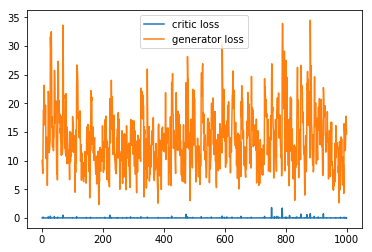

 60%|██████    | 57299/94950 [3:04:21<2:01:08,  5.18it/s]

step: 57300, D: 0.0431307, G: 10.7904


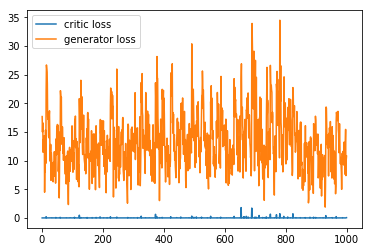

 60%|██████    | 57399/94950 [3:04:41<2:00:49,  5.18it/s]

step: 57400, D: 4.53678e-07, G: 16.1419


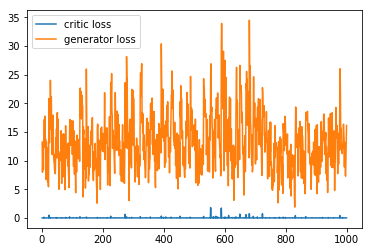

 61%|██████    | 57499/94950 [3:05:00<2:00:30,  5.18it/s]

step: 57500, D: 1.79938e-06, G: 15.3526


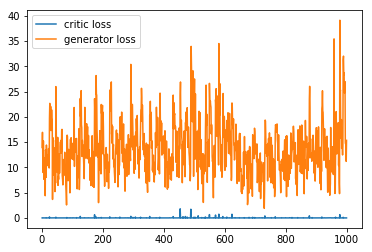

 61%|██████    | 57599/94950 [3:05:19<2:00:10,  5.18it/s]

step: 57600, D: 2.60074e-07, G: 15.2732


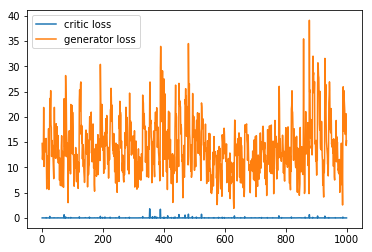

 61%|██████    | 57699/94950 [3:05:39<1:59:51,  5.18it/s]

step: 57700, D: 1.68149e-06, G: 17.9687


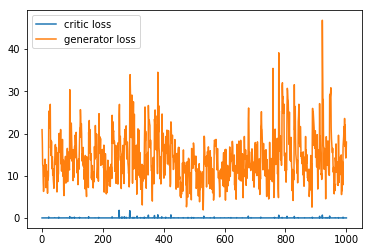

 61%|██████    | 57799/94950 [3:05:58<1:59:32,  5.18it/s]

step: 57800, D: 3.43495e-05, G: 12.4949


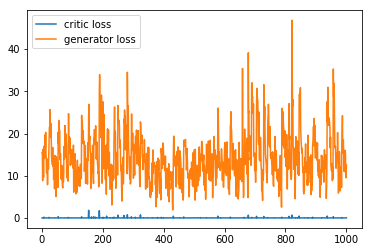

 61%|██████    | 57899/94950 [3:06:17<1:59:12,  5.18it/s]

step: 57900, D: 7.59665e-06, G: 15.8184


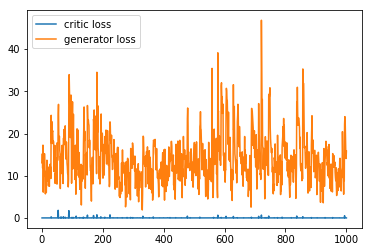

 61%|██████    | 57999/94950 [3:06:37<1:58:53,  5.18it/s]

step: 58000, D: 9.13419e-12, G: 30.7647


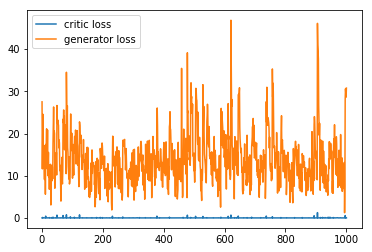

 61%|██████    | 58099/94950 [3:06:56<1:58:34,  5.18it/s]

step: 58100, D: 0.000672647, G: 12.7244


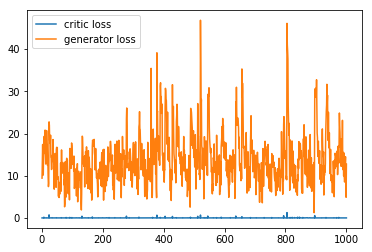

 61%|██████▏   | 58199/94950 [3:07:15<1:58:14,  5.18it/s]

step: 58200, D: 5.45026e-06, G: 15.688


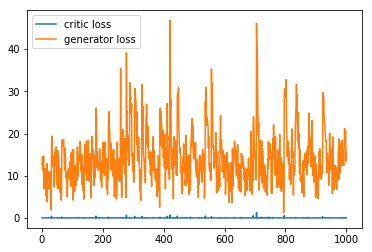

 61%|██████▏   | 58299/94950 [3:07:34<1:57:55,  5.18it/s]

step: 58300, D: 1.20389e-07, G: 24.0967


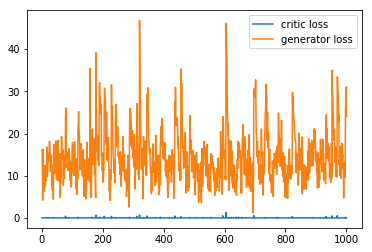

 62%|██████▏   | 58399/94950 [3:07:54<1:57:36,  5.18it/s]

step: 58400, D: 6.7993e-10, G: 21.8419


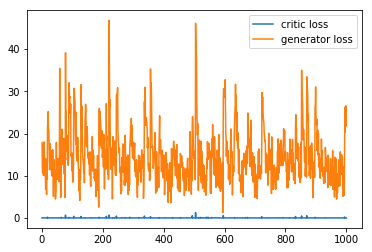

 62%|██████▏   | 58499/94950 [3:08:13<1:57:17,  5.18it/s]

step: 58500, D: 3.59124e-08, G: 14.0475


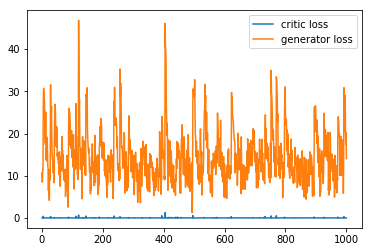

 62%|██████▏   | 58599/94950 [3:08:33<1:56:57,  5.18it/s]

step: 58600, D: 1.84406e-06, G: 10.0273


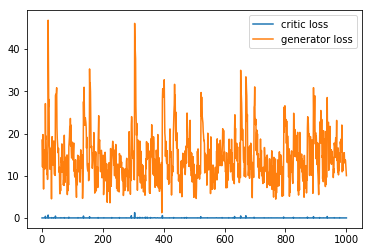

 62%|██████▏   | 58699/94950 [3:08:52<1:56:38,  5.18it/s]

step: 58700, D: 6.16974e-07, G: 18.3937


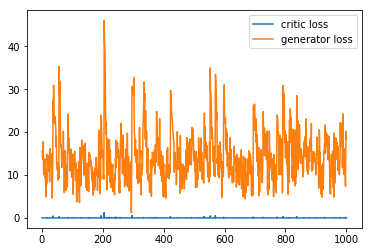

 62%|██████▏   | 58799/94950 [3:09:11<1:56:19,  5.18it/s]

step: 58800, D: 6.58922e-08, G: 22.2502


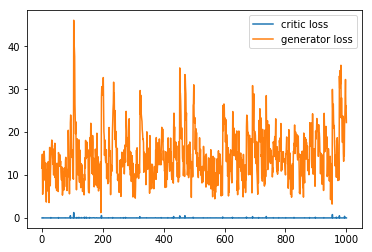

 62%|██████▏   | 58899/94950 [3:09:30<1:55:59,  5.18it/s]

step: 58900, D: 0.00347735, G: 16.7621


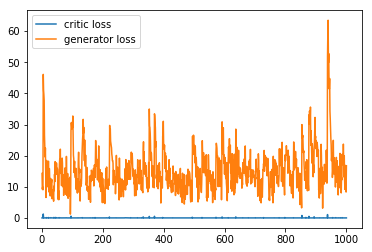

 62%|██████▏   | 58999/94950 [3:09:49<1:55:40,  5.18it/s]

step: 59000, D: 0.00453846, G: 12.5104


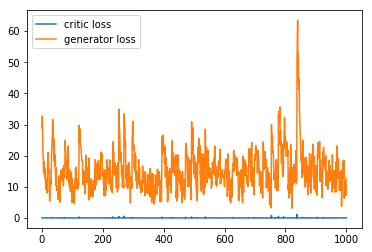

 62%|██████▏   | 59099/94950 [3:10:09<1:55:21,  5.18it/s]

step: 59100, D: 5.03146e-05, G: 19.6027


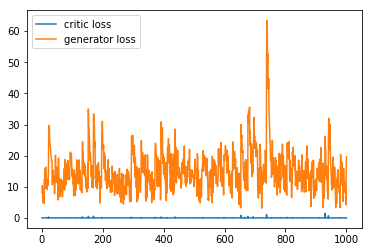

 62%|██████▏   | 59199/94950 [3:10:28<1:55:01,  5.18it/s]

step: 59200, D: 0.000155688, G: 16.3312


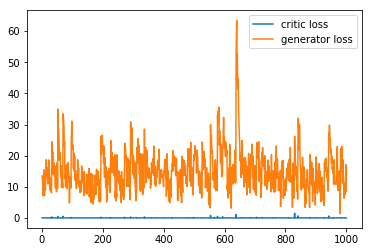

 62%|██████▏   | 59299/94950 [3:10:47<1:54:42,  5.18it/s]

step: 59300, D: 0.000430639, G: 5.40493


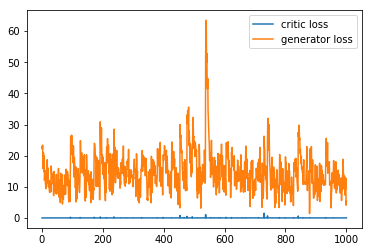

 63%|██████▎   | 59399/94950 [3:11:07<1:54:23,  5.18it/s]

step: 59400, D: 2.83151e-10, G: 35.3268


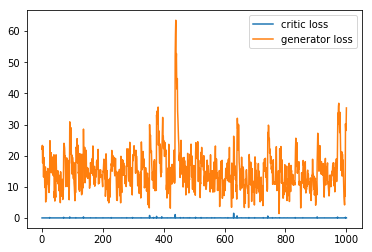

 63%|██████▎   | 59499/94950 [3:11:26<1:54:03,  5.18it/s]

step: 59500, D: 0.0122911, G: 12.7548


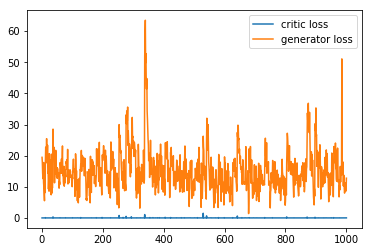

 63%|██████▎   | 59599/94950 [3:11:45<1:53:44,  5.18it/s]

step: 59600, D: 1.5386e-05, G: 11.9013


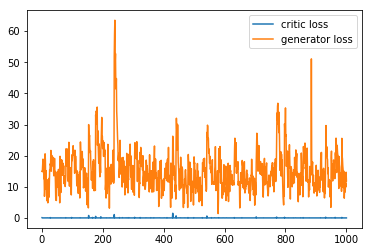

 63%|██████▎   | 59699/94950 [3:12:04<1:53:25,  5.18it/s]

step: 59700, D: 0.023414, G: 15.1136


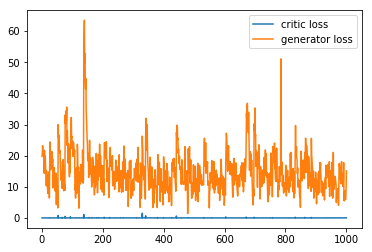

 63%|██████▎   | 59799/94950 [3:12:24<1:53:06,  5.18it/s]

step: 59800, D: 0.0337049, G: 11.0637


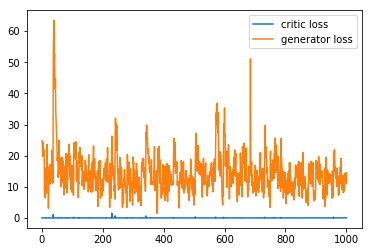

 63%|██████▎   | 59899/94950 [3:12:43<1:52:46,  5.18it/s]

step: 59900, D: 8.19623e-07, G: 17.0742


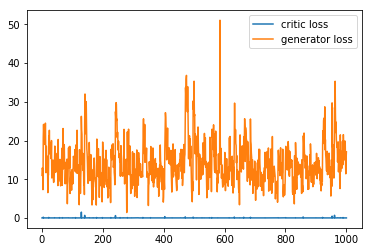

 63%|██████▎   | 59999/94950 [3:13:02<1:52:27,  5.18it/s]

step: 60000, D: 3.71682e-07, G: 23.8799


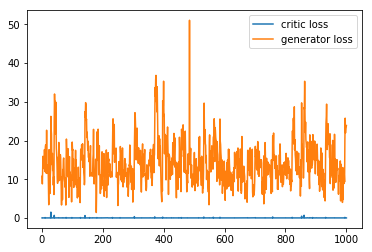

 63%|██████▎   | 60099/94950 [3:13:22<1:52:08,  5.18it/s]

step: 60100, D: 1.82674e-06, G: 20.012


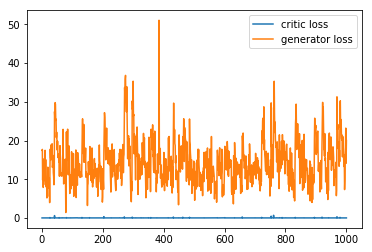

 63%|██████▎   | 60199/94950 [3:13:41<1:51:48,  5.18it/s]

step: 60200, D: 7.60386e-10, G: 20.5273


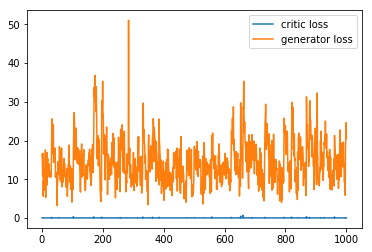

 64%|██████▎   | 60299/94950 [3:14:00<1:51:29,  5.18it/s]

step: 60300, D: 0.000296387, G: 9.06774


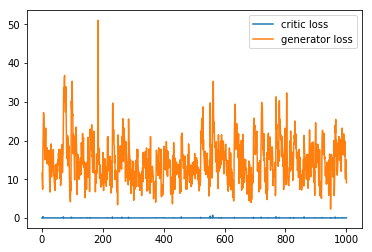

 64%|██████▎   | 60399/94950 [3:14:19<1:51:09,  5.18it/s]

step: 60400, D: 0.0215913, G: 7.36159


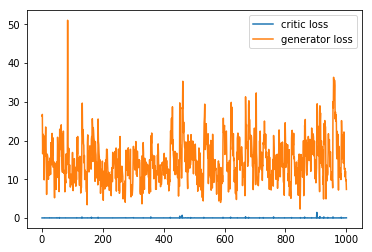

 64%|██████▎   | 60499/94950 [3:14:38<1:50:50,  5.18it/s]

step: 60500, D: 0.00232671, G: 9.00229


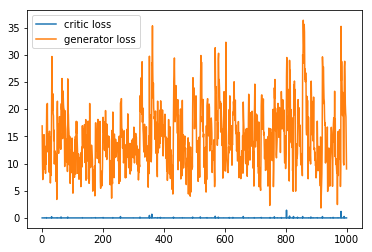

 64%|██████▍   | 60599/94950 [3:14:58<1:50:31,  5.18it/s]

step: 60600, D: 5.74819e-06, G: 12.2388


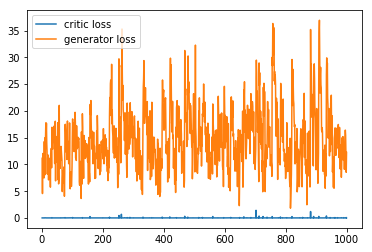

 64%|██████▍   | 60699/94950 [3:15:17<1:50:11,  5.18it/s]

step: 60700, D: 5.64313e-05, G: 16.349


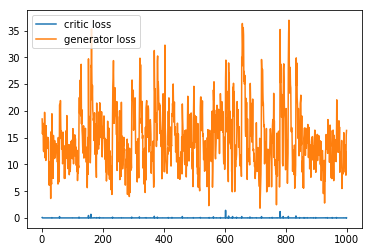

 64%|██████▍   | 60799/94950 [3:15:36<1:49:52,  5.18it/s]

step: 60800, D: 0.000457927, G: 11.8724


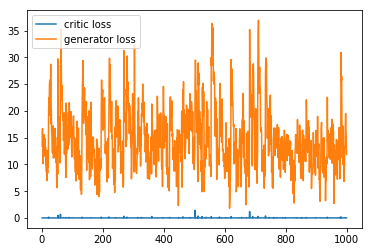

 64%|██████▍   | 60884/94950 [3:15:52<1:49:36,  5.18it/s]

In [ ]:
train(steps=total_steps, batch_size=BATCH_SIZE, sample_interval=100, hist_interval=100)